This notebook aims to conduct feature engineering and final model building for our PD Model. Order of feature engineering is as followed:

1. Creation of Features
2. Feature Selection via IV <-> WoE binning selected features

This sequence is chosen due to the following reasons:

- Reduce chance of discarding features, which may only become useful after feature engineering
- Generating interaction features allow me to rank / select variables which are relevant and useful for PD Modeling
- Multicollinearity checks can be conducted once, instead of being repeated multiple times

# 0. Import Libraries


In [1]:
# === Standard libraries ===

import os
import warnings

warnings.filterwarnings("ignore", category=FutureWarning)

# === WandB Logging  ===
import wandb

wandb.login(key=os.getenv("WANDB_API_KEY"))

# == Global Functions ==
from functions import *


# === Spark Session & Functions ===
from init_spark import start_spark

spark = start_spark()
from pyspark.sql.functions import (
    col,
    when,
    count,
    desc,
    isnan,
    isnull,
    lit,
    length,
    trim,
    lower,
    upper,
    to_date,
    concat_ws,
    regexp_extract,
    mean,
)
from pyspark.sql.types import (
    StructType,
    StructField,
    StringType,
    DoubleType,
    IntegerType,
    DateType,
    NumericType,
    FloatType,
    LongType,
)


# === Pandas Dataframe & WoE Binning ===
import pandas as pd
from tabulate import tabulate
from optbinning import OptimalBinning
import numpy as np

# == Visualisation
import matplotlib.pyplot as plt
import seaborn as sns
import seaborn as sns
import matplotlib.pyplot as plt

# === Machine Learning ===
from sklearn.linear_model import LogisticRegression as SkLogisticRegression
from sklearn.metrics import (
    roc_auc_score,
    f1_score,
    precision_score,
    recall_score,
    accuracy_score,
    classification_report,
    confusion_matrix,
    precision_recall_curve,
    ConfusionMatrixDisplay,
)

# == Optbinning ==
from optbinning import OptimalPWBinning


# === Load Environment Variables ===
from dotenv import load_dotenv

load_dotenv()

wandb: WARNING If you're specifying your api key in code, ensure this code is not shared publicly.
wandb: WARNING Consider setting the WANDB_API_KEY environment variable, or running `wandb login` from the command line.
wandb: Appending key for api.wandb.ai to your netrc file: /Users/lunlun/.netrc
wandb: Currently logged in as: wlunlun1212 (wlunlun1212-singapore-management-university) to https://api.wandb.ai. Use `wandb login --relogin` to force relogin
wandb: WARNING If you're specifying your api key in code, ensure this code is not shared publicly.
wandb: WARNING Consider setting the WANDB_API_KEY environment variable, or running `wandb login` from the command line.
wandb: Appending key for api.wandb.ai to your netrc file: /Users/lunlun/.netrc
Using Spark's default log4j profile: org/apache/spark/log4j2-defaults.properties
25/08/16 16:21:02 WARN Utils: Your hostname, Chengs-MacBook-Pro.local, resolves to a loopback address: 127.0.0.1; using 192.168.0.77 instead (on interface en0)
25/0

4.0.0


True

In [2]:
# ============ Constants ======================

TARGET_COL = "default_status"
SAMPLE_FRAC = 0.2
SEED = 42
NOTEBOOK_RUN_NAME = "Feature Engineering"

IV_THRESHOLDS = {
    "useless (< 0.02)": 0.02,
    "weak (< 0.1)": 0.1,
    "medium (< 0.3)": 0.3,
    "strong (< 0.5)": 0.5,
}

# === Feature Categorisation ===
iv_categories = {
    "useless (< 0.02)": [],
    "weak (< 0.1)": [],
    "medium (< 0.3)": [],
    "strong (< 0.5)": [],
    "suspicious": [],
    "no_variation": [],
}

In [3]:
# ====================== Reusable Functions ======================


# == 0. Outliers ==
# == Outliers Handling ==
def compute_outlier_pct(df, col_name, lower_pct=0.25, upper_pct=0.75):
    """Computes pct of outliers per column based on IQR method"""

    # 1. Compute percentile bounds
    quantiles = df.approxQuantile(col_name, [lower_pct, upper_pct], 0.01)
    q1, q3 = quantiles[0], quantiles[1]
    iqr = q3 - q1

    # 2. Obtain lower and upper bound, any data points outside of this are seen as outliers
    lower_bound = q1 - 1.5 * iqr
    upper_bound = q3 + 1.5 * iqr
    total_rows = df.count()

    return round(
        df.filter((col(col_name) < lower_bound) | (col(col_name) > upper_bound)).count()
        / total_rows
        * 100,
        2,
    )


def display_distributions(df):
    """Takes in Spark Dataframe. Samples it and display distribution for skewness checking"""
    # 1. Select numerical columns
    numeric_cols = [
        field.name for field in df.schema if isinstance(field.dataType, NumericType)
    ]

    # 2. Sample small portion of data (e.g., 5%) and convert to pandas
    sample_df = df.select(numeric_cols).sample(fraction=0.1, seed=42)
    sample_pdf = sample_df.toPandas()

    # 3. Plot histograms as subplots
    n_cols = 3  # Number of plots per row
    n_rows = (len(numeric_cols) + n_cols - 1) // n_cols

    fig, axes = plt.subplots(n_rows, n_cols, figsize=(15, 4 * n_rows))
    axes = axes.flatten()

    for i, col_name in enumerate(numeric_cols):
        axes[i].hist(sample_pdf[col_name].dropna(), bins=50, color="skyblue")
        axes[i].set_title(col_name, fontsize=10)
        axes[i].tick_params(axis="x", rotation=45)

    # Hide any unused subplots
    for j in range(i + 1, len(axes)):
        axes[j].axis("off")

    plt.tight_layout()
    plt.show()


def inspect_outliers_iqr(df: DataFrame, columns: list, sample_size: int = 5):
    for col_name in columns:
        try:
            print(f"\n📊 Inspecting Outliers for Column: `{col_name}`")

            # Step 1: Calculate Q1, Q3, and IQR
            q1, q3 = df.approxQuantile(col_name, [0.25, 0.75], 0.01)
            iqr = q3 - q1
            lower = q1 - 1.5 * iqr
            upper = q3 + 1.5 * iqr

            print(f"Q1 = {q1}, Q3 = {q3}, IQR = {iqr}")
            print(f"Lower Bound = {lower}, Upper Bound = {upper}")

            # Step 2: Count outliers
            outlier_count = df.filter(
                (col(col_name) < lower) | (col(col_name) > upper)
            ).count()
            total_count = df.count()
            outlier_pct = round(outlier_count / total_count * 100, 2)
            print(f"Outlier Count: {outlier_count} ({outlier_pct}%)")

            # Step 3: Sample outlier values (top and bottom)
            print(f"🔼 Top Outliers (>{upper}):")
            df.filter(col(col_name) > upper).select(col_name).orderBy(
                col(col_name).desc()
            ).show(sample_size)

            print(f"🔽 Bottom Outliers (<{lower}):")
            df.filter(col(col_name) < lower).select(col_name).orderBy(
                col(col_name)
            ).show(sample_size)

        except Exception as e:
            print(f"❌ Could not process column `{col_name}`: {str(e)}")


def winsorise_col(df, col_name, operator: str, condition_val, final_val):
    """
    Winsorises a column by replacing values above a certain condition with a final value.

    Args:
        df (DataFrame): The input DataFrame.
        col_name (str): The name of the column to winsorise.
        condition_val (float): The value above which to replace with final_val (cut-off)
        final_val (float): The value to replace with.

    Returns:
        DataFrame: The DataFrame with the winsorised column.
    """
    print("✅ Winsorising column:", col_name, "...")

    if operator == "<":
        return df.withColumn(
            col_name,
            when(col(col_name) < condition_val, final_val).otherwise(col(col_name)),
        )

    elif operator == ">":
        return df.withColumn(
            col_name,
            when(col(col_name) > condition_val, final_val).otherwise(col(col_name)),
        )


def retain_rows(
    df: DataFrame, col_name: str, condition_val: float, operator: str
) -> DataFrame:
    """
    Retains rows in the DataFrame where the specified column meets a condition.

    Returns:
        DataFrame: The DataFrame with the specified rows dropped.
    """

    if operator == "<=":
        return df.filter(col(col_name) <= condition_val)

    elif operator == "<":
        return df.filter(col(col_name) < condition_val)

    elif operator == ">":
        return df.filter(col(col_name) > condition_val)

    elif operator == ">=":
        return df.filter(col(col_name) >= condition_val)

    else:
        raise ValueError("Operator must be '>=' or '<='")


# == 1. Feature Engineering ==
def add_ratio_with_flag(df, numerator, denominator, ratio_col, flag_col, fill_value=-1):
    """
    Adds flag column to indicate invalid value upon division. Adds engineered feature column, and fills -1 upon invalid
    division operation.

    Parameters
    ----------
    df: str
        Spark Dataframe

    numerator: str
        Numerator Column Name
    denominator: str
        Denominator Column Name

    ratio_col: str
        Engineered Feature Name (Create Yourself)

    flag_col: str
        For e.g. annual_inc/loan_ratio_invalid

    fill_value: int
        Default: -1 (Placeholder in flag column, if invalid division operation)

    Returns
    -------
    Spark Dataframe with new columns (flag and divided column)
    """
    # ==  invalid denom (null or <= 0) -> 0 or -1 will be in flag columnis ==
    df = df.withColumn(
        flag_col,
        when(
            (col(denominator).isNull()) | (col(denominator) <= 0), 1
        ).otherwise(  # invalid → 1
            0
        ),  # valid → 0
    )

    # == safe ratio: real divide only when valid, else sentinel ==
    df = df.withColumn(
        ratio_col,
        when(col(flag_col) == 0, col(numerator) / col(denominator)).otherwise(
            lit(fill_value)
        ),
    )
    return df


# == 2. Feature Selection (WoE & IV) ==
def get_numerical_cols(df, target_col):
    """
    Get numerical columns of a Spark Dataframe and return list of numerical columns,
    excluding 'default_status'

    Parameters
    -----------

    df: Dataframe
        Spark Dataframe

    target_col: str
        default_status

    """
    return [
        f.name
        for f in df.schema.fields
        if isinstance(f.dataType, NumericType) and f.name != target_col
    ]


def get_categorical_cols(df, target_col):
    """
    Get categorical columns of a Spark Dataframe and return list of
    string columns

    Parameters
    -----------

    df: Dataframe
        Spark Dataframe

    target_col: str
        default_status

    """
    return [
        f.name
        for f in df.schema.fields
        if isinstance(f.dataType, StringType) and f.name != target_col
    ]


def classify_iv(iv_categories, feature, iv_score):
    """Adds 1 feature into respective IV categories of iv_categories dictionary"""
    for label, threshold in IV_THRESHOLDS.items():
        if iv_score < threshold:
            iv_categories[label].append((feature, iv_score))
            return

    iv_categories["suspicious"].append((feature, iv_score))


def bin_and_classify_feature(
    feature,
    x,
    y,
    dtype="numerical",
    monotonic_trend_type="auto",
    min_bin_size=0.05,
    max_n_bins=5,
    iv_categories=iv_categories,
):
    """
    Sample first before attempting to inspect binning & classifying into different IV Categories.
    Ensure only train_df (Pandas) fed in this function

    - Conducts Optimal Binning on a feature.
    - Outputs WoE table & Plot (to observe monotonic trend)
    - Categorises 1 feature into `iv_categories` dictionary

    Parameters
    ----------
    - feature: str
            Name of Feature
    - x: series
            e.g. train_df[feature]
    - y: series
            e.g. train_df['default_status']
    - dtype: str
            e.g. numerical (continuous /discrete / ordinal) & categorical (nominal) for OptBinning library
    - monotonic_trend_type: str
            e.g auto (default) / auto_asc_desc
    """

    # Fit binning with automatic solver
    optb = OptimalBinning(
        name=feature,
        dtype=dtype,
        monotonic_trend=monotonic_trend_type,
        min_bin_size=min_bin_size,  # min bin size is 1% (majority of our features have >= 1% outliers ... )
        solver="cp",
        max_n_bins=max_n_bins,
    )
    optb.fit(x, y)

    bin_table = optb.binning_table.build()

    #  Format binning table to display bins WoE & IV
    bin_df = pd.DataFrame(
        {
            "Bin": bin_table["Bin"].astype(str),
            "Count": round(bin_table["Count"], 4),
            "Default Rate (%)": round(bin_table["Event rate"], 4),
            "WOE": bin_table["WoE"],
            "IV": bin_table["IV"],
        }
    )

    # Get total IV for feature
    bin_df = bin_df[~bin_df["Bin"].str.contains("Total", na=False)]
    total_iv = bin_df.iloc[-1]["IV"]
    print(f"✅ Total IV for {feature}: {total_iv:.4f}")

    # Add feature to iv_categories
    classify_iv(iv_categories, feature, total_iv)

    # Print binning table
    print(tabulate(bin_df, headers="keys", tablefmt="fancy_grid", showindex=False))

    # Plot curve
    optb.binning_table.plot(metric="woe", figsize=(7, 4))


def tx_grade(df):
    """Takes in Pandas Dataframe and returns correct grade_numeric mapping from 'grade' column.
    This ensures ordinal natured of grade to be captured. Returns Pandas Dataframe."""
    # == Grade = Ordinal -> Dtype = `numerical` ==
    grade_map = {"A": 1, "B": 2, "C": 3, "D": 4, "E": 5, "F": 6, "G": 7}
    df["grade_numeric"] = df["grade"].map(grade_map)

    df = df.drop("grade", axis=1)

    return df


def get_updated_iv_categories(iv_categories, train_df):

    updated_iv_categories = {}
    for key, value in iv_categories.items():
        new_list = []
        if len(value) > 0 and key != "no_variation":
            for feature, iv_value in value:
                if feature in train_df.columns:
                    new_list.append((feature, iv_value))
            updated_iv_categories[key] = new_list
        else:
            continue

    return updated_iv_categories


def plot_iv_by_category(iv_categories):
    # === 1. Flatten into a clean DataFrame ===
    rows = []
    for category, items in iv_categories.items():
        for it in items:
            if isinstance(it, (tuple, list)) and len(it) >= 2:
                feature, iv = it[0], it[1]
                rows.append({"Feature": feature, "IV": float(iv), "Category": category})
            elif isinstance(it, str):
                rows.append({"Feature": it, "IV": 0.0, "Category": category})

    df_iv = pd.DataFrame(rows).sort_values(by="Feature")

    # === 2. Create faceted plots, showing only relevant features in each ===
    g = sns.catplot(
        data=df_iv,
        kind="bar",
        x="IV",
        y="Feature",
        col="Category",
        col_wrap=2,
        height=6,
        aspect=1.2,
        sharex=False,  # <== allow different x scales
        sharey=False,  # <== allow different features per facet
        palette="Set2",
    )

    g.figure.subplots_adjust(top=0.9, wspace=0.9)

    # === 3. Annotate bars ===
    for ax in g.axes.flat:
        for bar in ax.patches:
            width = bar.get_width()
            if width > 0:
                y = bar.get_y() + bar.get_height() / 2
                ax.text(width + 0.002, y, f"{width:.3f}", va="center", fontsize=8)

    # === 4. Final polish ===
    g.set_titles(col_template="{col_name}")
    g.set_xlabels("IV Score")
    g.set_ylabels("Feature")
    g.figure.suptitle("Information Value (IV) by Feature Category", fontsize=16)
    plt.show()
    return g


def peek_iv_score(updated_iv_categories, string_name, train_pdf):
    res_list = []
    for key, iv_list in updated_iv_categories.items():
        for feature, iv_score in iv_list:
            if (string_name in feature) and (feature in train_pdf.columns):
                res_list.append((feature, iv_score))

    return res_list


# == 3. WoE Transformation ==
def woe_bin_transform_train(df, non_mono_cols, target_col=TARGET_COL, monotonic="auto"):
    """
    Takes in train dataframe (Pandas)
    For each feature, separate Optbinning model is trained separately.
    If there are non-monotonic columns, use `auto_asc_desc` constraint in Optbinning

    Parameters
    -----------
    df: Pandas Dataframe
            train_pdf

    non_mono_cols: list
            non-monotonic columns

    target_col: str
            default_status (exists in train_pdf.columns)

    monotonic: str
            By default, monotonic='auto'
    """

    excluded_columns = ["id", "issue_d", "default_status", "earliest_cr_line"]
    loop_cols = [feature for feature in df.columns if feature not in excluded_columns]

    optb_dict = {}

    for column in loop_cols:
        # == Check if we should enforce monotonic trend on current feature ==
        if column in non_mono_cols:
            monotonic_trend = "auto_asc_desc"
        else:
            monotonic_trend = monotonic

        # == Determine dtype of current column ==
        if df[column].dtype == "object":
            dtype = "categorical"
        elif pd.api.types.is_numeric_dtype(df[column]):
            dtype = "numerical"
        else:
            continue  # skip unknown types

        optb = OptimalBinning(
            name=column,
            dtype=dtype,
            monotonic_trend=monotonic_trend,
            solver="cp",
            min_bin_size=0.05,
            max_n_bins=5,
        )

        try:
            optb.fit(df[column], df[target_col])
            df[column + "_woe"] = optb.transform(df[column].to_numpy(), metric="woe")
            df = df.drop(column, axis=1)
            optb_dict[column] = optb

        except Exception as e:
            print(f"❌ Error fitting {column}: {e}")

    return (df, optb_dict)


def apply_woe_transform(df, optb_dict):
    """
    Uses dictionary outputted by woe_bin_transform_train() to fit test dataframe,
    variable -> trainned Optbinning Model on train dataframe's feature.

    Transform each of test_pdf feature into `feature_woe`

    Parameters
    ----------
    df: Dataframe
            test_pdf

    optb_dict: dict
            Maps feature -> Optbinning Object
    """
    for column, optb in optb_dict.items():
        df[column + "_woe"] = optb.transform(df[column].to_numpy(), metric="woe")
        df = df.drop(columns=[column])
    return df


def pretty_print_iv_dict(iv_dict):
    for bucket, feats in iv_dict.items():
        print(f"\n{bucket}:")
        for feat, iv in feats:
            print(f"  {feat:<40} {float(iv):.6f}")

In [4]:
# == Remove all existing runs every time I run this notebook ==
NOTEBOOK_RUN_NAME = "PD Model Building II"
api = wandb.Api()
for run in api.runs(
    f"wlunlun1212-singapore-management-university/Credit Risk Modeling"
):
    if run.group == NOTEBOOK_RUN_NAME:
        run.delete()

In [5]:
df = spark.read.format("delta").load("../data/gold/medallion_cleaned_lc_data")

df.limit(10).toPandas()

25/08/16 16:21:08 WARN SparkStringUtils: Truncated the string representation of a plan since it was too large. This behavior can be adjusted by setting 'spark.sql.debug.maxToStringFields'.


,id,loan_amnt,funded_amnt,term,int_rate,installment,grade,emp_length,home_ownership,annual_inc,...,pct_tl_nvr_dlq,percent_bc_gt_75,pub_rec_bankruptcies,tax_liens,tot_hi_cred_lim,total_bal_ex_mort,total_bc_limit,total_il_high_credit_limit,credit_history_years,fico_score
0,87704389,1000.0,1000.0,36,10.49,32.50,B,2,MORTGAGE,39975.0,...,100.0,0.0,0.0,0.0,146014.0,60931.0,8300.0,70423.0,10,762.0
1,88862675,4800.0,4800.0,36,18.99,175.93,D,6,MORTGAGE,132000.0,...,78.6,0.0,0.0,0.0,314046.0,53279.0,500.0,54636.0,17,662.0
2,85636448,4075.0,4075.0,36,14.49,140.25,C,1,RENT,12000.0,...,100.0,0.0,0.0,0.0,27142.0,18772.0,5200.0,20342.0,4,752.0
3,88012886,23975.0,23975.0,60,15.59,577.82,C,2,RENT,89999.0,...,95.2,0.0,0.0,0.0,48652.0,14397.0,31500.0,12684.0,18,732.0
4,87989149,8000.0,8000.0,36,12.79,268.75,C,10,OWN,30000.0,...,100.0,20.0,1.0,0.0,55262.0,29807.0,11600.0,34562.0,9,707.0
5,85582885,5600.0,5600.0,36,12.79,188.13,C,10,MORTGAGE,109000.0,...,81.2,0.0,0.0,0.0,421855.0,50608.0,3000.0,58902.0,17,702.0
6,88494037,6000.0,6000.0,36,10.49,194.99,B,0,OWN,55000.0,...,100.0,0.0,0.0,0.0,27352.0,7421.0,19500.0,7852.0,15,807.0
7,88143505,24000.0,24000.0,60,15.59,578.42,C,10,MORTGAGE,65000.0,...,94.7,50.0,0.0,0.0,310036.0,38795.0,14000.0,28679.0,13,682.0
8,86216472,3200.0,3200.0,36,9.49,102.50,B,6,MORTGAGE,72000.0,...,94.3,0.0,0.0,0.0,112899.0,60713.0,4000.0,57816.0,12,747.0
9,87624578,3600.0,3600.0,36,8.59,113.80,A,0,RENT,70000.0,...,56.2,100.0,0.0,0.0,63980.0,40699.0,7500.0,54780.0,30,692.0


Before we continue on with data preprocessing, we should ensure that in each stage of our data preprocessing, our train and test dataset has ample proportion of defaults. As such, we shall conduct out of time split with column `issue_d` right from the start and inspect the proportion of defaulted loans vs non-defaulted loans of our train dataset and test dataset.

The code below indicates that the train and test datasets have ample defaulted loans for us to work on.


In [6]:
# 1) Convert to numeric timestamp
df_ts = df.withColumn("issue_ts", unix_timestamp(col("issue_d")))

# 2) Compute the 7th percentile of that timestamp
quantiles = df_ts.approxQuantile("issue_ts", [0.8], 0.01)
cut_ts = quantiles[0]  # e.g. 1672531200

# 3) Convert back to a human date
cut_date = df_ts.select(
    from_unixtime(lit(cut_ts), "yyyy-MM-dd").alias("cut_date")
).first()["cut_date"]

print(f"Splitting at ≈ {cut_date} ... ")

# 4) Train-test split
train_df = df.filter(
    col("issue_d") < cut_date
)  # train using 80% of the data before cut-off data at 80%
test_df = df.filter(col("issue_d") >= cut_date)
df = df.withColumn("issue_d", to_date(col("issue_d"), "yyyy-MM-dd"))
df = df.orderBy(col("issue_d").asc())
train_df = df.where(col("issue_d") < cut_date)
test_df = df.where(col("issue_d") >= cut_date)

print("Train Dataset Proportion:")
train_df.groupBy(col("default_status")).count().show()

print("Test Dataset Proportion:")
test_df.groupBy(col("default_status")).count().show()

CUT_DATE = pd.to_datetime(cut_date)  # or pd.to_datetime(...) — same result

Splitting at ≈ 2016-11-01 ... 
Train Dataset Proportion:
+--------------+------+
|default_status| count|
+--------------+------+
|             1|209897|
|             0|866563|
+--------------+------+

Test Dataset Proportion:
+--------------+------+
|default_status| count|
+--------------+------+
|             1| 57159|
|             0|205536|
+--------------+------+



### 0.0 Base Model Performance


In [7]:
# == Check for Null Values ==
null_counts = df.select([count(when(col(c).isNull(), c)).alias(c) for c in df.columns])
null_counts.show()

+---+---------+-----------+----+--------+-----------+-----+----------+--------------+----------+-------------------+-------+--------------+---+-----------+--------------+--------+-------+---------+----------+---------+-------------------+---------+-----------+---------------+-------------+------------------+----------+-----------------------+---------------+--------------------+-------------------+--------------------------+----------------+--------------+------------+-----------+----------------+--------------------+-----------+--------------+-------+------------------------+-----------+------------------+--------------------+---------------------+--------------+--------+--------------------+---------------------+---------------------+--------------+---------------+-----------+---------+---------+-------------+-------------+-------------------+--------+----------------+------------+------------------+------------------+--------------+----------------+--------------------+---------+---

In [8]:
# == Checking Base Model Performance ==
train_pdf1, test_pdf1 = sample_split_order(
    initial_df=df, sample_frac=0.1, cut_off_date=CUT_DATE, date_col="issue_d"
)

# == 2. Quickly run Logistic Regression Model for quick / approx evaluation metrics ==
run_model_checkpoint(
    train_pdf1, test_pdf1, "log_reg_base", "Logistic Regression", NOTEBOOK_RUN_NAME
)

train_pdf has 109472 rows, 75 columns
test_pdf has 24508 rows, 75 columns



✅ Best F1 Score = 0.9990 at threshold = 0.29

📄 Classification Report (Optimized Threshold):
              precision    recall  f1-score   support

 Non-Default     0.9998    0.9996    0.9997     19175
     Default     0.9985    0.9992    0.9989      5333

    accuracy                         0.9995     24508
   macro avg     0.9991    0.9994    0.9993     24508
weighted avg     0.9995    0.9995    0.9995     24508



Accuracy,▁
Best Threshold,▁
F1 Score,▁
Gini,▁
Precision,▁
Recall,▁
Accuracy,0.99951
Best Threshold,0.28621
F1 Score,0.99888
Gini,0.99929
Model Type,Logistic Regression


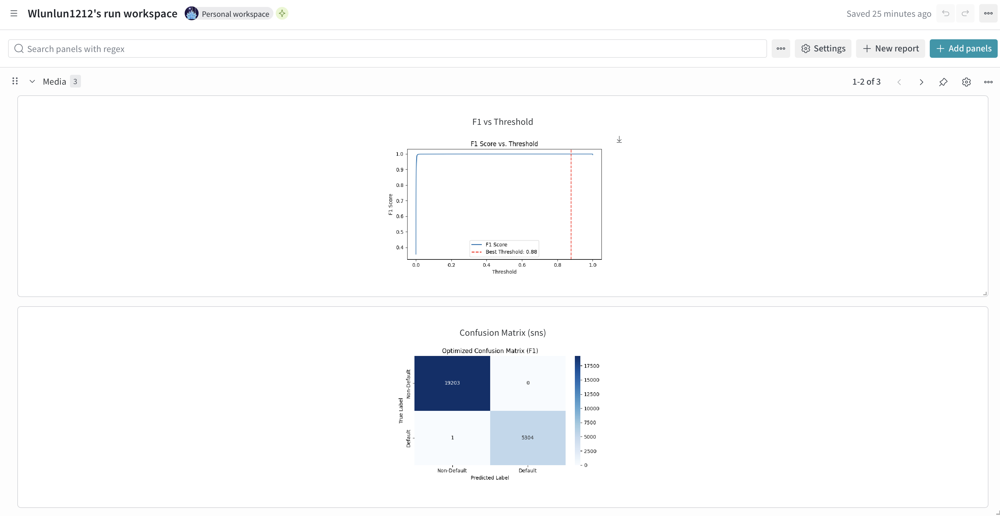

### 0.1 Post Loan Origination Features Removal

From the image, we have **overinflated metrics**. Focusing on the Default Class, we have Precision and Recall score which do way better than industry standard. However, since our metrics are all nearly perfect, it signals to us that our dataset has features which leak data (model peeks into future answers). This makes absolute sense as well, given that we have not dropped post loan origination features, and haven't done outlier handling, and feature engineering etc. For example, a Recall of 0.996 means that out of all actual defaulted loans, the Logistic Regression model predicted 99% of them correctly. This is unrealistic and signals high data leakage.

As such, we will be dropping post-loan origination features to ensure our model only uses data available at the time of origination to predict future defaults. Before that, let's look into outlier / skewness detection & treatment.

In credit risk modeling, there are normally features in the dataset, which 'tells our model' the answer, when it should not. Put simply, these are features that hint to the model that the borrower has defaulted in the corresponding record. This is termed as 'data leak' in the data realm and should not happen, since machine learning models are meant to predict the future, using past data. Similarly, we are trying to utilise features known at the time of loan origination, to predict a borrower's / loan's probability of default. As such, let's drop such features right from the start which aren't useful for PD Modeling. An example is `tot_coll_amt`, where the total collection amount (when borrower defaults) is recorded.


In [9]:
# == Removing Post Loan Origination Feature for PD Modeling ==

post_loan_origination_features = [
    "out_prncp",
    "total_pymnt",
    "total_rec_prncp",
    "total_rec_int",
    "total_rec_late_fee",
    "recoveries",
    "collection_recovery_fee",
    "last_pymnt_amnt",
    "tot_coll_amt",
    "last_fico_range_high",
    "last_fico_range_low",
]


# == total_pymnt_inv, total_rec_prncp_inv, total_rec_int_inv, out_prncp_inv removed prvsly ==


df = df.drop(*post_loan_origination_features)
print("✅ Post Loan Origination Features Dropped ...")

# == Assert none of these columns are in df.columns ==
assert not any(
    col in df.columns for col in post_loan_origination_features
), f"Some post-loan origination features are still present in df: {set(df.columns) & set(post_loan_origination_features)}"

# == Resample due to changes in original df ==
train_pdf, test_pdf = sample_split_order(
    initial_df=df, sample_frac=0.1, cut_off_date=CUT_DATE, date_col="issue_d"
)

# == Check model performance after dropping post loan origination features ==
run_model_checkpoint(
    train_pdf,
    test_pdf,
    "log_reg_post_loan_done",
    "Logistic Regression",
    NOTEBOOK_RUN_NAME,
)

✅ Post Loan Origination Features Dropped ...


train_pdf has 109472 rows, 64 columns
test_pdf has 24508 rows, 64 columns



✅ Best F1 Score = 0.4480 at threshold = 0.48

📄 Classification Report (Optimized Threshold):
              precision    recall  f1-score   support

 Non-Default     0.8810    0.5914    0.7078     19175
     Default     0.3267    0.7127    0.4480      5333

    accuracy                         0.6178     24508
   macro avg     0.6038    0.6521    0.5779     24508
weighted avg     0.7604    0.6178    0.6512     24508



Accuracy,▁
Best Threshold,▁
F1 Score,▁
Gini,▁
Precision,▁
Recall,▁
Accuracy,0.61784
Best Threshold,0.48051
F1 Score,0.44802
Gini,0.41055
Model Type,Logistic Regression


### 0.2 Skewness & Outlier Treatment

Before feature engineering, we will be dealing with outliers and skewed distributions, which can distort credit risk models. They can dominate learning, causing bias or overfitting in our PD Model. Let's first identify features which are highly skewed.


In [10]:
# == 1. Find outliers % per column, without sampling (may risk missing absurd placeholders) ==

numeric_df5 = df.select(
    [feature.name for feature in df.schema if isinstance(feature.dataType, NumericType)]
)

outliers_dict = {}

for feature in numeric_df5.schema.fields:
    col_name = feature.name
    data_type = feature.dataType

    if isinstance(data_type, NumericType):
        outlier_pct = compute_outlier_pct(numeric_df5, col_name)
        if outlier_pct > 0:
            outliers_dict[col_name] = outlier_pct


print("❌ Outlier Percentage by Feature (sorted):")
for k, v in sorted(outliers_dict.items(), key=lambda item: item[1], reverse=True):
    print(f"{k}: {round(v, 2)}%")

❌ Outlier Percentage by Feature (sorted):
num_accts_ever_120_pd: 22.51%
default_status: 19.94%
delinq_2yrs: 19.28%
pub_rec: 16.99%
pub_rec_bankruptcies: 12.51%
mths_since_recent_bc: 9.51%
bc_open_to_buy: 9.17%
mo_sin_old_il_acct: 8.49%
mo_sin_rcnt_rev_tl_op: 8.39%
pct_tl_nvr_dlq: 6.93%
total_rev_hi_lim: 6.57%
total_bc_limit: 6.48%
total_bal_ex_mort: 6.12%
revol_bal: 5.97%
avg_cur_bal: 5.83%
num_il_tl: 5.82%
total_il_high_credit_limit: 5.71%
mo_sin_rcnt_tl: 5.64%
num_tl_90g_dpd_24m: 5.45%
inq_last_6mths: 5.32%
num_actv_rev_tl: 5.32%
num_rev_tl_bal_gt_0: 4.98%
acc_open_past_24mths: 4.89%
annual_inc: 4.37%
num_bc_tl: 4.36%
num_bc_sats: 4.27%
tot_hi_cred_lim: 4.07%
tot_cur_bal: 4.03%
num_op_rev_tl: 4.02%
mths_since_recent_inq: 3.77%
mo_sin_old_rev_tl_op: 3.45%
open_acc: 3.44%
num_sats: 3.35%
tax_liens: 3.22%
installment: 3.11%
credit_history_years: 2.86%
num_tl_op_past_12m: 2.58%
num_rev_accts: 2.39%
fico_score: 2.31%
num_actv_bc_tl: 1.99%
int_rate: 1.84%
total_acc: 1.69%
collections_12_mt

To ensure that our WoE & IV Feature Selection produce better binning (more balanced bins) and smoother WoE (if a feature separates good and bad outcomes properly), we should visualise our distributions to understand our dataset better.


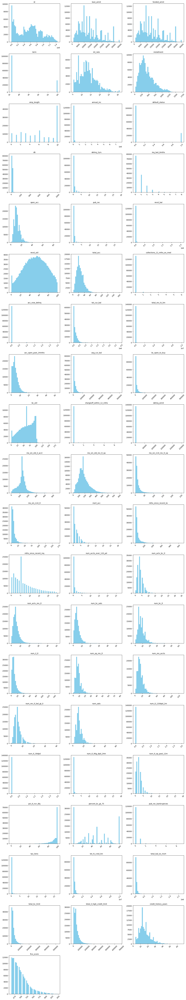

In [11]:
display_distributions(df)

In [12]:
# == Check Outlier Values ==
outlier_columns = list(outliers_dict.keys())
inspect_outliers_iqr(df, outlier_columns)


📊 Inspecting Outliers for Column: `loan_amnt`
Q1 = 8000.0, Q3 = 20000.0, IQR = 12000.0
Lower Bound = -10000.0, Upper Bound = 38000.0
Outlier Count: 7120 (0.53%)
🔼 Top Outliers (>38000.0):
+---------+
|loan_amnt|
+---------+
|  40000.0|
|  40000.0|
|  40000.0|
|  40000.0|
|  40000.0|
+---------+
only showing top 5 rows
🔽 Bottom Outliers (<-10000.0):
+---------+
|loan_amnt|
+---------+
+---------+


📊 Inspecting Outliers for Column: `funded_amnt`
Q1 = 8000.0, Q3 = 20000.0, IQR = 12000.0
Lower Bound = -10000.0, Upper Bound = 38000.0
Outlier Count: 7120 (0.53%)
🔼 Top Outliers (>38000.0):
+-----------+
|funded_amnt|
+-----------+
|    40000.0|
|    40000.0|
|    40000.0|
|    40000.0|
|    40000.0|
+-----------+
only showing top 5 rows
🔽 Bottom Outliers (<-10000.0):
+-----------+
|funded_amnt|
+-----------+
+-----------+


📊 Inspecting Outliers for Column: `int_rate`
Q1 = 9.67, Q3 = 15.99, IQR = 6.32
Lower Bound = 0.1899999999999995, Upper Bound = 25.47
Outlier Count: 24609 (1.84%)
🔼 Top O

From the original distribution of our cleaned dataset, we can observe that we have many skewed features, which is common is credit risk datasets. Before dealing with skewness, it is important to handle outliers first. Skewness measures the symmetry of a feature, and a few outliers can over-inflate the skewness of a feature, rendering the skewness value inaccurate. This can lead to us blindly applying transformations to a feature, when it does harm to our PD Model.

As such, based on the nature of an outlier, they will be dealt in different ways.

- **Clear Data Error**: Trim
- **Real Outlier but Rare (Domain Knowledge Based)**: Winsorise till IQR Bounds
- **Outlier is Real & Meaningful** : Let WoE binning handle this outlier


In [13]:
# == DTI Outlier Handling ==
df = retain_rows(df, "dti", 120, "<=")  # Drop rows where dti > 120
df = winsorise_col(df, "dti", ">", 100, 100)  # Winsorise dti > 100 to 100


# == Only allow fico_scores between 300 and 850 ==
df = df.filter(
    (col("last_fico_range_high") <= 850) & (col("last_fico_range_high") >= 300)
)
df = df.filter(
    (col("last_fico_range_low") <= 850) & (col("last_fico_range_low") >= 300)
)

# == total_rev_hi_lim ==
df = df.filter(
    col("total_rev_hi_lim") < 9_999_999.0
)  # likely placeholders / data error

# == months since oldest installment account opened ==
df = df.filter(col("mo_sin_old_il_acct") < 999)  # Drop likely placeholders
df = df.filter(col("mo_sin_old_rev_tl_op") < 999)  # Drop likely placeholders

# == high credit limit ==
df = df.filter(col("tot_hi_cred_lim") < 9_999_999.0)

✅ Winsorising column: dti ...


In [14]:
# == Inspect Columns == 
sorted(df.columns)

['acc_now_delinq',
 'acc_open_past_24mths',
 'annual_inc',
 'application_type',
 'avg_cur_bal',
 'bc_open_to_buy',
 'bc_util',
 'chargeoff_within_12_mths',
 'collections_12_mths_ex_med',
 'credit_history_years',
 'default_status',
 'delinq_2yrs',
 'delinq_amnt',
 'dti',
 'emp_length',
 'fico_score',
 'funded_amnt',
 'grade',
 'home_ownership',
 'id',
 'initial_list_status',
 'inq_last_6mths',
 'installment',
 'int_rate',
 'issue_d',
 'loan_amnt',
 'mo_sin_old_il_acct',
 'mo_sin_old_rev_tl_op',
 'mo_sin_rcnt_rev_tl_op',
 'mo_sin_rcnt_tl',
 'mort_acc',
 'mths_since_recent_bc',
 'mths_since_recent_inq',
 'num_accts_ever_120_pd',
 'num_actv_bc_tl',
 'num_actv_rev_tl',
 'num_bc_sats',
 'num_bc_tl',
 'num_il_tl',
 'num_op_rev_tl',
 'num_rev_accts',
 'num_rev_tl_bal_gt_0',
 'num_sats',
 'num_tl_120dpd_2m',
 'num_tl_30dpd',
 'num_tl_90g_dpd_24m',
 'num_tl_op_past_12m',
 'open_acc',
 'pct_tl_nvr_dlq',
 'percent_bc_gt_75',
 'pub_rec',
 'pub_rec_bankruptcies',
 'revol_bal',
 'revol_util',
 'tax_l

WoE binning is robust against outliers. There will be no skewness treatment for our Logistic Regression Model.


In [15]:
train_pdf, test_pdf = sample_split_order(df, 0.1, CUT_DATE, "issue_d")

run_model_checkpoint(
    train_pdf,
    test_pdf,
    "log_reg_outlier_done",
    "Logistic Regression",
    NOTEBOOK_RUN_NAME,
)

train_pdf has 106715 rows, 64 columns
test_pdf has 23740 rows, 64 columns



✅ Best F1 Score = 0.4114 at threshold = 0.51

📄 Classification Report (Optimized Threshold):
              precision    recall  f1-score   support

 Non-Default     0.8822    0.6545    0.7515     19166
     Default     0.3045    0.6338    0.4114      4574

    accuracy                         0.6505     23740
   macro avg     0.5934    0.6442    0.5814     23740
weighted avg     0.7709    0.6505    0.6860     23740



Accuracy,▁
Best Threshold,▁
F1 Score,▁
Gini,▁
Precision,▁
Recall,▁
Accuracy,0.65055
Best Threshold,0.5133
F1 Score,0.41138
Gini,0.39355
Model Type,Logistic Regression


# 1. Feature Engineering

Now, I will be creating interaction feature from base columns based on domain logic. Interaction features capture the joint effect of features, e.g. When a borrower has high `loan_amnt`, it seems OK. When he has a low `income`, he might have a higher risk. But when he has both a high `loan_amnt` and a low `income`, this may be a huge red flag. As such, combining features is extremely important for credit risk modeling, since I want my model to capture such nuances.


We can categorise the above features into the 5 Cs in credit risk. The following categories are often assessed by credit risk modelers to check if they are eligible for a loan.

| **C**                                                                                                                            | **Relevant variables**                                                                                                                                                                                                                                                                                                                                                                                          | **Why this mapping matters**                                                                                                                                                                    |
| -------------------------------------------------------------------------------------------------------------------------------- | --------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------- | ----------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------- |
| **Character**<br><span style="font-size:0.85em; font-weight:400">Willing-to-pay: past behaviour & credit‐seeking patterns</span> | `fico_score`, `delinq_2yrs`, `pub_rec`, `acc_now_delinq`, `collections_12_mths_ex_med`, `chargeoff_within_12_mths`, `inq_last_6mths`, `mths_since_recent_inq`, `mo_sin_rcnt_tl`, `mo_sin_rcnt_rev_tl_op`, `mo_sin_old_il_acct`, `earliest_cr_line`, `credit_history_years`, `num_accts_ever_120_pd`, `num_tl_120dpd_2m`, `num_tl_90g_dpd_24m`, `num_tl_op_past_12m`, `num_bc_tl`, `num_il_tl`, `pct_tl_nvr_dlq` | Records of delinquencies, recency of new accounts and enquiries, and depth of credit history reveal a borrower’s **intent** and reliability.                                                    |
| **Capacity**<br><span style="font-size:0.85em; font-weight:400">Ability-to-pay: income, leverage & utilisation</span>            | `annual_inc`, `dti`, `revol_util`, `loan_amnt`, `total_bal_ex_mort`, `proportion_satisfac_accounts`, `proportion_satisfac_bc_tl`, `acc_open_past_24mths`, `bc_open_to_buy`, `total_acc`                                                                                                                                                                                                                         | These features quantify **cash-flow pressure**: debt service vs income and how heavily existing lines are used.                                                                                 |
| **Capital**<br><span style="font-size:0.85em; font-weight:400">Net worth / borrower’s own stake</span>                           | `total_rev_hi_lim`, `tot_hi_cred_lim`, `num_bc_tl`, `revol_bal`                                                                                                                                                                                                                                                                                                                                                 | Higher total limits and more bank-card trades can proxy unencumbered liquidity or long-standing credit lines acting as “soft” capital reserves.                                                 |
| **Collateral**<br><span style="font-size:0.85em; font-weight:400">Assets pledged (or proxies) for debt obligations</span>        | `home_ownership`, `mort_acc`                                                                                                                                                                                                                                                                                                                                                                                    | Availability of collateral lowers borrower’s risk in defaulting.                                                                                                                                |
| **Conditions**<br><span style="font-size:0.85em; font-weight:400">External & loan-specific terms</span>                          | `term`, `grade`, `verification_status`, `issue_d`, `initial_list_status`, `application_type`, `installment`, `int_rate`, `pymnt_plan`                                                                                                                                                                                                                                                                           | Economic cycle at origination (`issue_d`), lender-set terms (`grade`, `term`), document quality (`verification_status`) and channel flags influence default **independent** of borrower traits. |

### 1.1 Within 'C' Interaction


In [16]:
# ============================ Within 'C' Interaction Features ============================

# =======================
#       DIVISION
# =======================

within_c_feature_eng_list = [
    # == A. Character ==
    ("fico_score", "delinq_2yrs", "fico_score/delinq_2yrs"),
    ("fico_score", "acc_now_delinq", "fico_score/acc_now_delinq"),
    ("fico_score", "inq_last_6mths", "fico_score/inq_last_6mths"),
    ("delinq_2yrs", "credit_history_years", "delinq_2yrs/credit_history"),
    ("num_accts_ever_120_pd", "credit_history_years", "late_pymt_hist"),
    # == B. Capacity ==
    ("loan_amnt", "annual_inc", "loan_amnt/annual_inc"),
    ("revol_util", "annual_inc", "revol_util/annual_inc"),
    ("acc_open_past_24mths", "total_acc", "acc_op_past_24mths/total_acc"),
    # == C. Capital ==
    ("bc_open_to_buy", "annual_inc", "bc_open_to_buy/annual_inc"),
]

for num, den, ratio in within_c_feature_eng_list:
    df = add_ratio_with_flag(
        df,
        numerator=num,
        denominator=den,
        ratio_col=ratio,
        flag_col=f"{ratio}_invalid",  # e.g., "loan_amnt/annual_inc_invalid"
    )

# =======================
#       PRODUCT
# =======================

# == A. Character ==
df = df.withColumn(
    "inq_last6mths_x_tl_op_past_12m", col("inq_last_6mths") * col("num_tl_op_past_12m")
)

# == B. Capacity ==
df = df.withColumn("dti_x_revol_util", col("dti") * col("revol_util"))

# =======================
#       REST
# =======================
df = df.withColumn("avail_ratio", lit(1) - col("bc_util"))

df = (
    df.withColumn("delinq2yrs_flag", (F.col("delinq_2yrs") > 0).cast("int"))
    .withColumn("pubrec_flag", (F.col("pub_rec") > 0).cast("int"))
    .withColumn("acc_now_delinq_flag", (F.col("acc_now_delinq") > 0).cast("int"))
)

Explanation for creation of the above features are explained below (Within 'C'):

- **Character**

  - `fico_score/delinq_2yrs`: High credit score relative to few past delinquencies signals strong repayment character.
  - `fico_score/acc_now_delinq`: Low fico scores with high number of accounts currently delinquent signals high risk
  - `fico_score/inq_last_6mths`: Low fico score with high credit inquries signal financial desperation
  - `delinq_2yrs/credit_hist`: High number of recent delinquencies, with short credit history has higher risk
  - `inq_last6mths_x_tl_op_past_12m`: Shows aggressive credit seeking
  - `late_pymt_hist`: Checks chronic late payments

- **Capacity**

  - `dti_x_revol_util`: High dti and high utilisation rates of current tradelines signal higher risk
  - `loan_amnt/annual_inc`: Measures how much loan amount is relative to income levels
  - `revol_util/annual_inc`: Low income and high credit utilisation is risky
  - `acc_op_past_24mths/total_acc`: Recent credit expansion / seeking behaviour may indicate risk

- **Capital**

  - `bc_open_to_buy/annual_inc`: Checks buffer capacity to repay existing loans

- **Rest**
  - `avail_ratio`: Signifies remaining credit proportion borrower can use
  - **Flags**: Any of the following records in one's credit history signfifies a red flag


### 1.2 Across 'C' Interaction Features


In [17]:
# ========================= Across 'C' Interaction Features ==================================

# =======================
#       PRODUCT
# =======================

# == A. Character x Capacity ==
df = df.withColumn(
    "tl_op12m_x_inq6m", col("num_tl_op_past_12m") * col("inq_last_6mths")
)
df = df.withColumn("dti_x_inq", col("dti") * col("inq_last_6mths"))

# == B. Capacity x Condition ==
df = df.withColumn("dti_x_term", col("dti") * col("term"))
df = df.withColumn("term_x_revol_util", col("term") * col("revol_util"))


# =======================
#       DIVISION
# =======================

across_c_feature_eng_list = [
    # Character × Capacity
    ("dti", "fico_score", "dti/fico_ratio"),
    # Capacity × Capital
    ("loan_amnt", "tot_hi_cred_lim", "loan_amnt/tot_hi_cred_lim"),
    ("bc_open_to_buy", "total_rev_hi_lim", "bc_open_to_buy/total_rev_hi_lim"),
    # Capacity × Condition
    ("fico_score", "int_rate", "fico_score/int_rate"),
]


for num, den, ratio in across_c_feature_eng_list:
    df = add_ratio_with_flag(
        df,
        numerator=num,
        denominator=den,
        ratio_col=ratio,
        flag_col=f"{ratio}_invalid",  # e.g., "loan_amnt/annual_inc_invalid"
    )


# == Safe Division not required (Capacity x Condition) ==
df = df.withColumn(
    "installment/annual_inc/12", col("installment") / (col("annual_inc") / 12)
)
df = df.withColumn(
    "installment/annual_inc/12_x_term",
    col("installment") / (col("annual_inc") / lit(12)) * col("term"),
)

Explanation for creation of the above features are explained below (Within 'C'):

- **Character × Capacity**

  - `tl_op12m_x_inq6m`: Lots of new tradelines and recent inquiries signal aggressive borrowing and potential financial stress.
  - `dti_x_inq` : High debt-to-income plus many recent inquiries combines weak capacity with urgent credit need.
  - `dti/fico_ratio` : High DTI when FICO is low flags heavy leverage on a weaker credit profile → higher default risk.

- **Capacity × Capital**

  - `loan_amnt/tot_hi_cred_lim` : Large requested loan relative to total credit limit indicates stretching beyond capacity, reducing repayment ability.
  - `bc_open_to_buy/total_rev_hi_lim`: Percentage of remaining revolving credit available to use

- **Capacity × Condition**
  - `dti_x_term` : High debt burden locked into a longer term increases exposure to shocks over time.
  - `term_x_revol_util` : High revolving utilization sustained over a long term suggests prolonged reliance on credit and less buffer.
  - `installment/annual_inc` : Payment-to-Income (PTI) shows affordability; higher PTI leaves less room for essentials and emergencies.
  - `installment/annual_inc_x_term` : PTI extended over a longer term compounds financial strain.
  - `fico_score/int_rate` : Combines borrower quality and risk-based pricing; lower FICO and/or higher rate signals elevated risk.


In [18]:
# == Check intermediate model performance ==
train_pdf, test_pdf = sample_split_order(df, 0.2, CUT_DATE, "issue_d")
run_model_checkpoint(
    train_pdf,
    test_pdf,
    "log_reg_feat_eng",
    model_type="Logistic Regression",
    run_group=NOTEBOOK_RUN_NAME,
)

train_pdf has 213974 rows, 102 columns
test_pdf has 47220 rows, 102 columns



✅ Best F1 Score = 0.4101 at threshold = 0.50

📄 Classification Report (Optimized Threshold):
              precision    recall  f1-score   support

 Non-Default     0.8819    0.6506    0.7488     38118
     Default     0.3027    0.6352    0.4100      9102

    accuracy                         0.6476     47220
   macro avg     0.5923    0.6429    0.5794     47220
weighted avg     0.7703    0.6476    0.6835     47220



Accuracy,▁
Best Threshold,▁
F1 Score,▁
Gini,▁
Precision,▁
Recall,▁
Accuracy,0.64765
Best Threshold,0.50366
F1 Score,0.41004
Gini,0.39376
Model Type,Logistic Regression


In [19]:
def compute_outlier_pct(df, col_name, lower_pct=0.25, upper_pct=0.75):
    """Computes pct of outliers per column based on IQR method"""

    # 1. Compute percentile bounds
    quantiles = df.approxQuantile(col_name, [lower_pct, upper_pct], 0.01)
    q1, q3 = quantiles[0], quantiles[1]
    iqr = q3 - q1

    # 2. Obtain lower and upper bound, any data points outside of this are seen as outliers
    lower_bound = q1 - 1.5 * iqr
    upper_bound = q3 + 1.5 * iqr
    total_rows = df.count()

    return round(
        df.filter((col(col_name) < lower_bound) | (col(col_name) > upper_bound)).count()
        / total_rows
        * 100,
        2,
    )


def display_distributions(df):
    """Takes in Spark Dataframe. Samples it and display distribution for skewness checking"""
    # 1. Select numerical columns
    numeric_cols = [
        field.name for field in df.schema if isinstance(field.dataType, NumericType)
    ]

    # 2. Sample small portion of data (e.g., 5%) and convert to pandas
    sample_df = df.select(numeric_cols).sample(fraction=0.1, seed=42)
    sample_pdf = sample_df.toPandas()

    # 3. Plot histograms as subplots
    n_cols = 3  # Number of plots per row
    n_rows = (len(numeric_cols) + n_cols - 1) // n_cols

    fig, axes = plt.subplots(n_rows, n_cols, figsize=(15, 4 * n_rows))
    axes = axes.flatten()

    for i, col_name in enumerate(numeric_cols):
        axes[i].hist(sample_pdf[col_name].dropna(), bins=50, color="skyblue")
        axes[i].set_title(col_name, fontsize=10)
        axes[i].tick_params(axis="x", rotation=45)

    # Hide any unused subplots
    for j in range(i + 1, len(axes)):
        axes[j].axis("off")

    plt.tight_layout()
    plt.show()


def inspect_outliers_iqr(df: DataFrame, columns: list, sample_size: int = 5):
    for col_name in columns:
        try:
            print(f"\n📊 Inspecting Outliers for Column: `{col_name}`")

            # Step 1: Calculate Q1, Q3, and IQR
            q1, q3 = df.approxQuantile(col_name, [0.25, 0.75], 0.01)
            iqr = q3 - q1
            lower = q1 - 1.5 * iqr
            upper = q3 + 1.5 * iqr

            print(f"Q1 = {q1}, Q3 = {q3}, IQR = {iqr}")
            print(f"Lower Bound = {lower}, Upper Bound = {upper}")

            # Step 2: Count outliers
            outlier_count = df.filter(
                (col(col_name) < lower) | (col(col_name) > upper)
            ).count()
            total_count = df.count()
            outlier_pct = round(outlier_count / total_count * 100, 2)
            print(f"Outlier Count: {outlier_count} ({outlier_pct}%)")

            # Step 3: Sample outlier values (top and bottom)
            print(f"🔼 Top Outliers (>{upper}):")
            df.filter(col(col_name) > upper).select(col_name).orderBy(
                col(col_name).desc()
            ).show(sample_size)

            print(f"🔽 Bottom Outliers (<{lower}):")
            df.filter(col(col_name) < lower).select(col_name).orderBy(
                col(col_name)
            ).show(sample_size)

        except Exception as e:
            print(f"❌ Could not process column `{col_name}`: {str(e)}")


def winsorise_col(df, col_name, operator: str, condition_val, final_val):
    """
    Winsorises a column by replacing values above a certain condition with a final value.

    Args:
        df (DataFrame): The input DataFrame.
        col_name (str): The name of the column to winsorise.
        condition_val (float): The value above which to replace with final_val (cut-off)
        final_val (float): The value to replace with.

    Returns:
        DataFrame: The DataFrame with the winsorised column.
    """
    print("✅ Winsorising column:", col_name, "...")

    if operator == "<":
        return df.withColumn(
            col_name,
            when(col(col_name) < condition_val, final_val).otherwise(col(col_name)),
        )

    elif operator == ">":
        return df.withColumn(
            col_name,
            when(col(col_name) > condition_val, final_val).otherwise(col(col_name)),
        )


def retain_rows(
    df: DataFrame, col_name: str, condition_val: float, operator: str
) -> DataFrame:
    """
    Retains rows in the DataFrame where the specified column meets a condition.

    Returns:
        DataFrame: The DataFrame with the specified rows dropped.
    """

    if operator == "<=":
        return df.filter(col(col_name) <= condition_val)

    elif operator == "<":
        return df.filter(col(col_name) < condition_val)

    elif operator == ">":
        return df.filter(col(col_name) > condition_val)

    elif operator == ">=":
        return df.filter(col(col_name) >= condition_val)

    else:
        raise ValueError("Operator must be '>=' or '<='")


# == PD Outlier Treatment ==

# == 1. Find outliers % per column, without sampling (may risk missing absurd placeholders) ==

numeric_df5 = df.select(
    [feature.name for feature in df.schema if isinstance(feature.dataType, NumericType)]
)

outliers_dict = {}

for feature in numeric_df5.schema.fields:
    col_name = feature.name
    data_type = feature.dataType

    if isinstance(data_type, NumericType):
        outlier_pct = compute_outlier_pct(numeric_df5, col_name)
        if outlier_pct > 0:
            outliers_dict[col_name] = outlier_pct


print("❌ Outlier Percentage by Feature (sorted):")
for k, v in sorted(outliers_dict.items(), key=lambda item: item[1], reverse=True):
    print(f"{k}: {round(v, 2)}%")

❌ Outlier Percentage by Feature (sorted):
term: 23.93%
num_accts_ever_120_pd: 22.54%
late_pymt_hist: 22.54%
delinq_2yrs: 19.39%
fico_score/delinq_2yrs_invalid: 19.39%
fico_score/delinq_2yrs: 19.39%
delinq_2yrs/credit_history: 19.39%
delinq2yrs_flag: 19.39%
default_status: 18.11%
pub_rec: 16.86%
pubrec_flag: 16.86%
pub_rec_bankruptcies: 12.41%
inq_last6mths_x_tl_op_past_12m: 11.29%
tl_op12m_x_inq6m: 11.29%
mths_since_recent_bc: 9.63%
bc_open_to_buy: 9.14%
bc_open_to_buy/annual_inc: 8.72%
mo_sin_rcnt_rev_tl_op: 8.49%
mo_sin_old_il_acct: 7.73%
pct_tl_nvr_dlq: 6.93%
loan_amnt/tot_hi_cred_lim: 6.79%
total_rev_hi_lim: 6.56%
total_bc_limit: 6.48%
total_bal_ex_mort: 6.25%
revol_bal: 6.1%
dti_x_inq: 5.96%
num_il_tl: 5.89%
avg_cur_bal: 5.76%
mo_sin_rcnt_tl: 5.68%
total_il_high_credit_limit: 5.62%
num_tl_90g_dpd_24m: 5.47%
num_actv_rev_tl: 5.29%
inq_last_6mths: 5.26%
acc_open_past_24mths: 4.84%
annual_inc: 4.45%
num_bc_tl: 4.41%
num_bc_sats: 4.27%
fico_score/int_rate: 4.11%
num_op_rev_tl: 4.05%
r

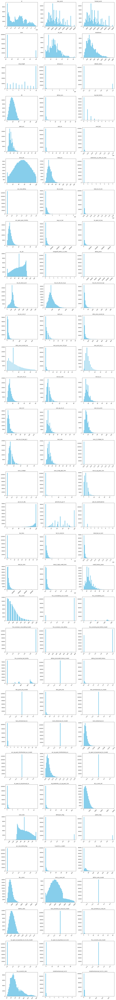

In [20]:
display_distributions(df)

From the original distribution of our cleaned dataset, we can observe that we have many skewed features, which is common is credit risk datasets. Before dealing with skewness, it is important to handle outliers first. Skewness measures the symmetry of a feature, and a few outliers can over-inflate the skewness of a feature, rendering the skewness value inaccurate. This can lead to us blindly applying transformations to a feature, when it does harm to our PD Model.

As such, based on the nature of an outlier, they will be dealt in different ways.

- **Clear Data Error**: Trim
- **Real Outlier but Rare (Domain Knowledge Based)**: Winsorise till IQR Bounds
- **Outlier is Real & Meaningful** : Let WoE binning handle this outlier


In [21]:
# == Check Outlier Values ==
outlier_columns = list(outliers_dict.keys())
inspect_outliers_iqr(df, outlier_columns)


📊 Inspecting Outliers for Column: `loan_amnt`
Q1 = 8000.0, Q3 = 20000.0, IQR = 12000.0
Lower Bound = -10000.0, Upper Bound = 38000.0
Outlier Count: 6974 (0.54%)
🔼 Top Outliers (>38000.0):
+---------+
|loan_amnt|
+---------+
|  40000.0|
|  40000.0|
|  40000.0|
|  40000.0|
|  40000.0|
+---------+
only showing top 5 rows
🔽 Bottom Outliers (<-10000.0):
+---------+
|loan_amnt|
+---------+
+---------+


📊 Inspecting Outliers for Column: `funded_amnt`
Q1 = 8000.0, Q3 = 20000.0, IQR = 12000.0
Lower Bound = -10000.0, Upper Bound = 38000.0
Outlier Count: 6974 (0.54%)
🔼 Top Outliers (>38000.0):
+-----------+
|funded_amnt|
+-----------+
|    40000.0|
|    40000.0|
|    40000.0|
|    40000.0|
|    40000.0|
+-----------+
only showing top 5 rows
🔽 Bottom Outliers (<-10000.0):
+-----------+
|funded_amnt|
+-----------+
+-----------+


📊 Inspecting Outliers for Column: `term`
Q1 = 36.0, Q3 = 36.0, IQR = 0.0
Lower Bound = 36.0, Upper Bound = 36.0
Outlier Count: 311812 (23.93%)
🔼 Top Outliers (>36.0):
+-

In [22]:
# == DTI Outlier Handling ==
df = retain_rows(df, "dti", 120, "<=")  # Drop rows where dti > 120
df = winsorise_col(df, "dti", ">", 100, 100)  # Winsorise dti > 100 to 100


# == Only allow fico_scores between 300 and 850 ==
df = df.filter(
    (col("last_fico_range_high") <= 850) & (col("last_fico_range_high") >= 300)
)
df = df.filter(
    (col("last_fico_range_low") <= 850) & (col("last_fico_range_low") >= 300)
)

# == total_rev_hi_lim ==
df = df.filter(
    col("total_rev_hi_lim") < 9_999_999.0
)  # likely placeholders / data error

# == months since oldest installment account opened ==
df = df.filter(col("mo_sin_old_il_acct") < 999)  # Drop likely placeholders
df = df.filter(col("mo_sin_old_rev_tl_op") < 999)  # Drop likely placeholders

# == high credit limit ==
df = df.filter(col("tot_hi_cred_lim") < 9_999_999.0)

✅ Winsorising column: dti ...


In [23]:
df1 = df

# 2. Feature Importance Inspection (WoE & IV)

After creating the interaction features, I will now be selecting features which are the most relevant (i.e. separates non-defaulters and defaulters well) and useful for our PD Model. We will be the utilising the `optbinning` library to observe monotonic trends of WoE, observe IV and WoE binning of variables. I will be following this guideline to determine strength of different variables.

![Feature Selection](https://media.licdn.com/dms/image/v2/D5612AQEnsMrGYt9wxw/article-inline_image-shrink_1500_2232/article-inline_image-shrink_1500_2232/0/1659097050621?e=1757548800&v=beta&t=4GwB73k9LWlDDgdydkU2boqr8GAnIr-Qc73Yem58PwI)

### 2.1 Numerical Features IV Inspection

To inspect the respective IV scores, we shall conduct train-test split first and observe IV on the training data. This is because the test dataset should use the same WoE binning methodology learnt from the training dataset to prevent data leakage.


train_pdf has 106659 rows, 102 columns
test_pdf has 23740 rows, 102 columns

🔍 Feature: loan_amnt
✅ Total IV for loan_amnt: 0.0466
╒══════════════════════╤═════════╤════════════════════╤══════════════════════╤═════════════╕
│ Bin                  │   Count │   Default Rate (%) │ WOE                  │          IV │
╞══════════════════════╪═════════╪════════════════════╪══════════════════════╪═════════════╡
│ (-inf, 7512.50)      │   25133 │             0.1377 │ 0.32177485291975816  │ 0.0219519   │
├──────────────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [7512.50, 10012.50)  │   17985 │             0.1571 │ 0.1671282113989474   │ 0.0044613   │
├──────────────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [10012.50, 16062.50) │   26824 │             0.188  │ -0.04974269232910755 │ 0.000632196 │
├──────────────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [16062.50, 28062.50) │   27781

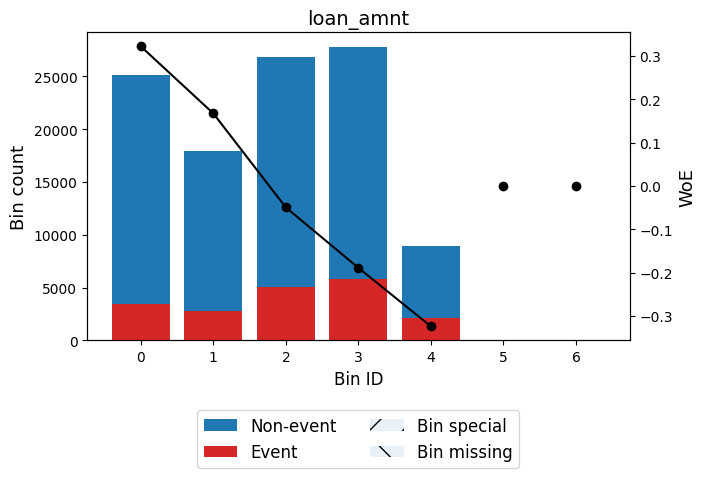


🔍 Feature: funded_amnt
✅ Total IV for funded_amnt: 0.0466
╒══════════════════════╤═════════╤════════════════════╤══════════════════════╤═════════════╕
│ Bin                  │   Count │   Default Rate (%) │ WOE                  │          IV │
╞══════════════════════╪═════════╪════════════════════╪══════════════════════╪═════════════╡
│ (-inf, 7512.50)      │   25153 │             0.1376 │ 0.32202716700060763  │ 0.0220019   │
├──────────────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [7512.50, 10012.50)  │   17999 │             0.1572 │ 0.16595335573751502  │ 0.00440392  │
├──────────────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [10012.50, 16062.50) │   26832 │             0.188  │ -0.04986386279811916 │ 0.000635493 │
├──────────────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [16062.50, 28062.50) │   27757 │             0.2102 │ -0.18919036163337544 │ 0.00988272  │
├──────────

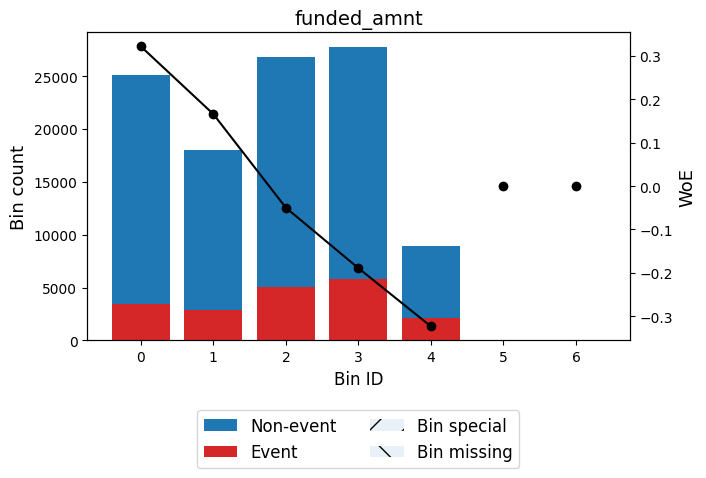


🔍 Feature: term
✅ Total IV for term: 0.2107
╒═══════════════╤═════════╤════════════════════╤════════════════════╤═══════════╕
│ Bin           │   Count │   Default Rate (%) │ WOE                │        IV │
╞═══════════════╪═════════╪════════════════════╪════════════════════╪═══════════╡
│ (-inf, 48.00) │   81050 │             0.1399 │ 0.3029836769818275 │ 0.0631612 │
├───────────────┼─────────┼────────────────────┼────────────────────┼───────────┤
│ [48.00, inf)  │   25609 │             0.3089 │ -0.707826361410975 │ 0.147556  │
├───────────────┼─────────┼────────────────────┼────────────────────┼───────────┤
│ Special       │       0 │             0      │ 0.0                │ 0         │
├───────────────┼─────────┼────────────────────┼────────────────────┼───────────┤
│ Missing       │       0 │             0      │ 0.0                │ 0         │
├───────────────┼─────────┼────────────────────┼────────────────────┼───────────┤
│               │  106659 │             0.1805 │     

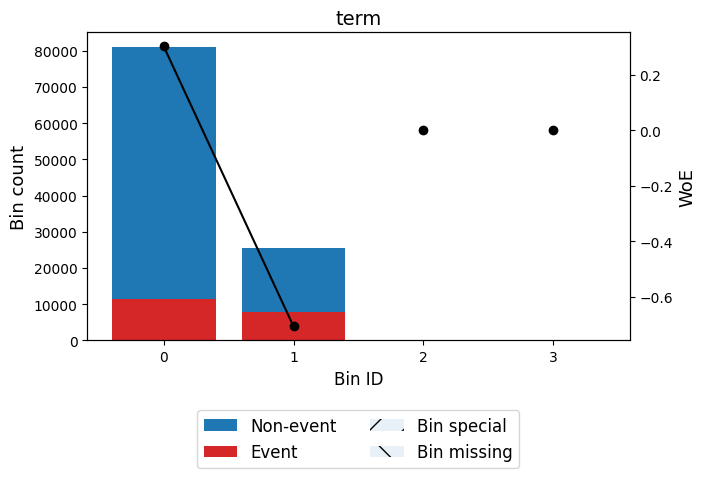


🔍 Feature: int_rate
✅ Total IV for int_rate: 0.4327
╒════════════════╤═════════╤════════════════════╤═════════════════════╤═══════════╕
│ Bin            │   Count │   Default Rate (%) │ WOE                 │        IV │
╞════════════════╪═════════╪════════════════════╪═════════════════════╪═══════════╡
│ (-inf, 6.91)   │    7282 │             0.0375 │ 1.732454717098491   │ 0.114353  │
├────────────────┼─────────┼────────────────────┼─────────────────────┼───────────┤
│ [6.91, 8.92)   │   14939 │             0.0742 │ 1.011332057100605   │ 0.10182   │
├────────────────┼─────────┼────────────────────┼─────────────────────┼───────────┤
│ [8.92, 12.57)  │   29442 │             0.1289 │ 0.3980209201375007  │ 0.0383485 │
├────────────────┼─────────┼────────────────────┼─────────────────────┼───────────┤
│ [12.57, 17.78) │   38587 │             0.2156 │ -0.2213215590589177 │ 0.0189863 │
├────────────────┼─────────┼────────────────────┼─────────────────────┼───────────┤
│ [17.78, inf)   │   16

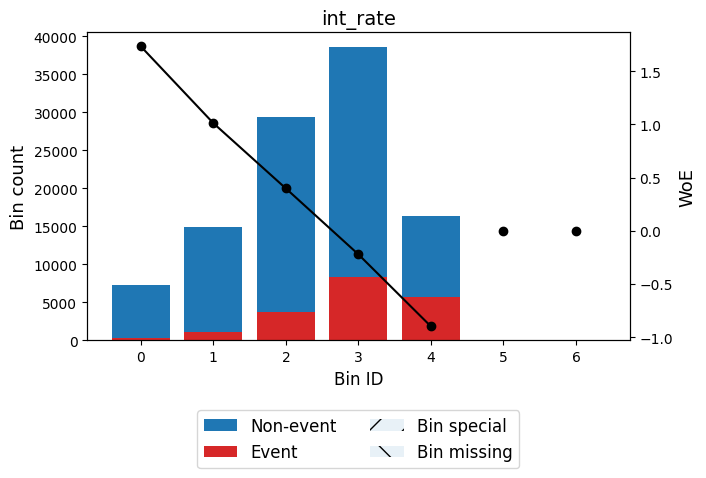


🔍 Feature: installment
✅ Total IV for installment: 0.0370
╒══════════════════╤═════════╤════════════════════╤══════════════════════╤═════════════╕
│ Bin              │   Count │   Default Rate (%) │ WOE                  │          IV │
╞══════════════════╪═════════╪════════════════════╪══════════════════════╪═════════════╡
│ (-inf, 203.43)   │   18599 │             0.1308 │ 0.38076140329339303  │ 0.0222996   │
├──────────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [203.43, 251.38) │    7929 │             0.1517 │ 0.20813837210866204  │ 0.00300952  │
├──────────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [251.38, 334.50) │   18073 │             0.1743 │ 0.04247738989491512  │ 0.000301599 │
├──────────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [334.50, 496.95) │   26036 │             0.1941 │ -0.08929334445408754 │ 0.00200211  │
├──────────────────┼─────────┼────────────────────┼

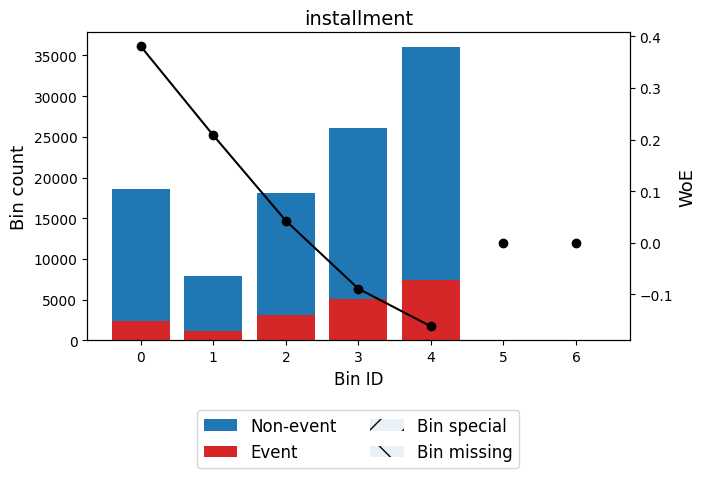


🔍 Feature: emp_length
✅ Total IV for emp_length: 0.0015
╒══════════════╤═════════╤════════════════════╤═══════════════════════╤═════════════╕
│ Bin          │   Count │   Default Rate (%) │ WOE                   │          IV │
╞══════════════╪═════════╪════════════════════╪═══════════════════════╪═════════════╡
│ (-inf, 1.50) │   15333 │             0.187  │ -0.04328505273144767  │ 0.000273077 │
├──────────────┼─────────┼────────────────────┼───────────────────────┼─────────────┤
│ [1.50, 9.50) │   56114 │             0.1838 │ -0.021885499594309632 │ 0.000253756 │
├──────────────┼─────────┼────────────────────┼───────────────────────┼─────────────┤
│ [9.50, inf)  │   35212 │             0.1725 │ 0.055200961955991     │ 0.000988292 │
├──────────────┼─────────┼────────────────────┼───────────────────────┼─────────────┤
│ Special      │       0 │             0      │ 0.0                   │ 0           │
├──────────────┼─────────┼────────────────────┼───────────────────────┼────────────

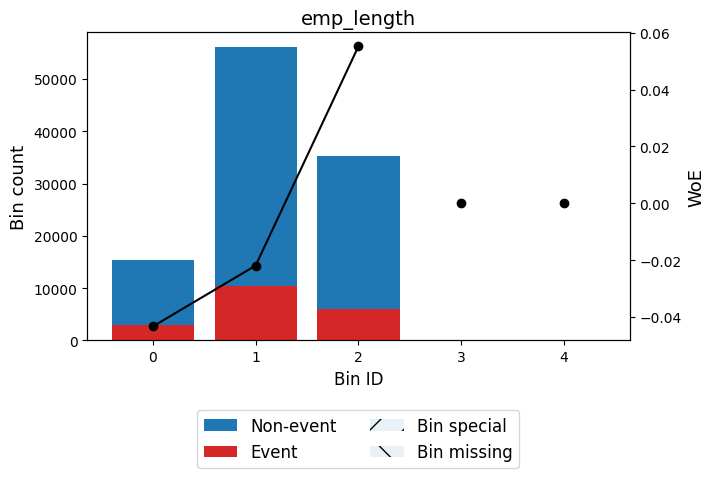


🔍 Feature: annual_inc
✅ Total IV for annual_inc: 0.0229
╒═══════════════════════╤═════════╤════════════════════╤══════════════════════╤═════════════╕
│ Bin                   │   Count │   Default Rate (%) │ WOE                  │          IV │
╞═══════════════════════╪═════════╪════════════════════╪══════════════════════╪═════════════╡
│ (-inf, 49599.50)      │   30612 │             0.2049 │ -0.15679746442798037 │ 0.00741239  │
├───────────────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [49599.50, 66110.50)  │   25661 │             0.1907 │ -0.06741607600218114 │ 0.0011171   │
├───────────────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [66110.50, 87082.50)  │   21081 │             0.1773 │ 0.021939670537014733 │ 9.44719e-05 │
├───────────────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [87082.50, 101406.00) │    9940 │             0.1554 │ 0.17958857596292144  │ 0.00283539  │
├──

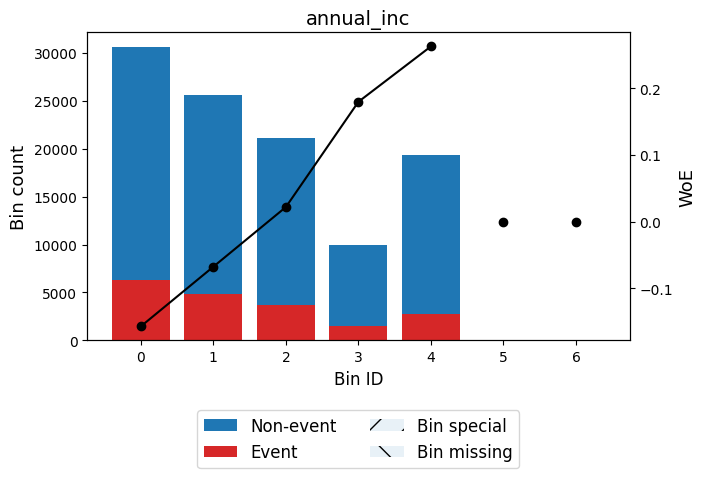


🔍 Feature: dti
✅ Total IV for dti: 0.0899
╒════════════════╤═════════╤════════════════════╤══════════════════════╤════════════╕
│ Bin            │   Count │   Default Rate (%) │ WOE                  │         IV │
╞════════════════╪═════════╪════════════════════╪══════════════════════╪════════════╡
│ (-inf, 10.98)  │   22879 │             0.1247 │ 0.43603705635436296  │ 0.0353071  │
├────────────────┼─────────┼────────────────────┼──────────────────────┼────────────┤
│ [10.98, 18.81) │   35629 │             0.1597 │ 0.14763708900609784  │ 0.00694108 │
├────────────────┼─────────┼────────────────────┼──────────────────────┼────────────┤
│ [18.81, 24.16) │   21796 │             0.1942 │ -0.08984714607340116 │ 0.00169722 │
├────────────────┼─────────┼────────────────────┼──────────────────────┼────────────┤
│ [24.16, 29.88) │   16125 │             0.23   │ -0.3044499504857776  │ 0.0153916  │
├────────────────┼─────────┼────────────────────┼──────────────────────┼────────────┤
│ [29.88, i

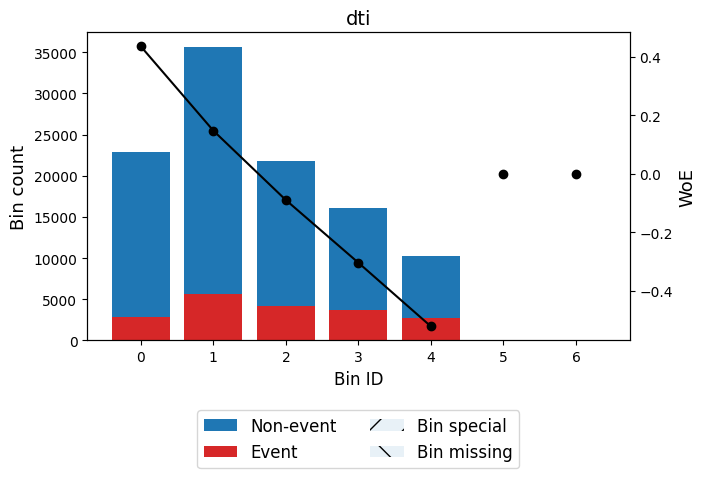


🔍 Feature: delinq_2yrs
✅ Total IV for delinq_2yrs: 0.0040
╒══════════════╤═════════╤════════════════════╤══════════════════════╤═════════════╕
│ Bin          │   Count │   Default Rate (%) │ WOE                  │          IV │
╞══════════════╪═════════╪════════════════════╪══════════════════════╪═════════════╡
│ (-inf, 0.50) │   85768 │             0.1761 │ 0.029952835822812274 │ 0.000714554 │
├──────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [0.50, 1.50) │   13813 │             0.193  │ -0.08243262256590445 │ 0.000903292 │
├──────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [1.50, inf)  │    7078 │             0.2092 │ -0.18351059959331306 │ 0.00236692  │
├──────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ Special      │       0 │             0      │ 0.0                  │ 0           │
├──────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ Miss

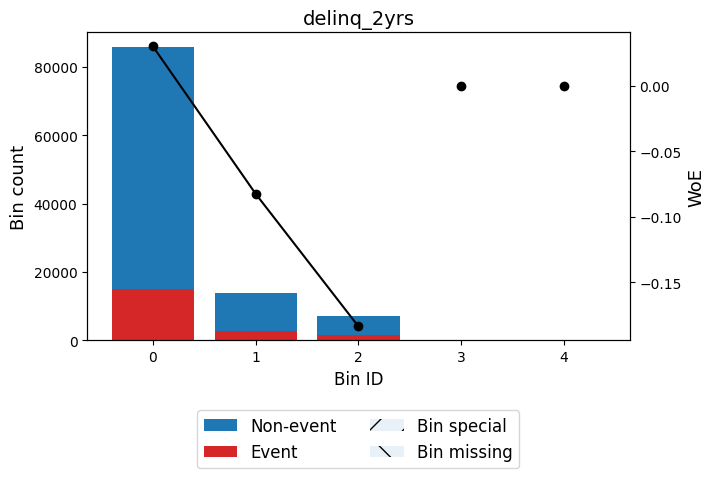


🔍 Feature: inq_last_6mths
✅ Total IV for inq_last_6mths: 0.0275
╒══════════════╤═════════╤════════════════════╤══════════════════════╤════════════╕
│ Bin          │   Count │   Default Rate (%) │ WOE                  │         IV │
╞══════════════╪═════════╪════════════════════╪══════════════════════╪════════════╡
│ (-inf, 0.50) │   60550 │             0.1612 │ 0.13601688186281402  │ 0.0100505  │
├──────────────┼─────────┼────────────────────┼──────────────────────┼────────────┤
│ [0.50, 1.50) │   29129 │             0.1933 │ -0.08461566964614708 │ 0.00200848 │
├──────────────┼─────────┼────────────────────┼──────────────────────┼────────────┤
│ [1.50, 2.50) │   10917 │             0.217  │ -0.2297943919366212  │ 0.00580559 │
├──────────────┼─────────┼────────────────────┼──────────────────────┼────────────┤
│ [2.50, inf)  │    6063 │             0.2453 │ -0.38895921761739527 │ 0.00968141 │
├──────────────┼─────────┼────────────────────┼──────────────────────┼────────────┤
│ Special  

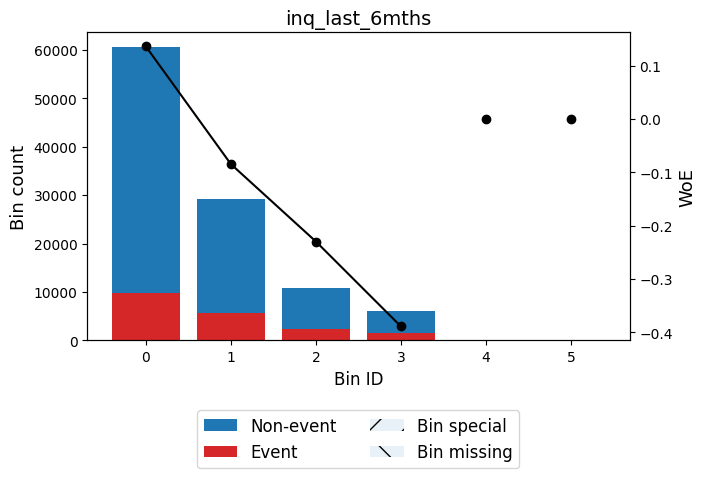


🔍 Feature: open_acc
✅ Total IV for open_acc: 0.0162
╒════════════════╤═════════╤════════════════════╤═══════════════════════╤═════════════╕
│ Bin            │   Count │   Default Rate (%) │ WOE                   │          IV │
╞════════════════╪═════════╪════════════════════╪═══════════════════════╪═════════════╡
│ (-inf, 6.50)   │   15528 │             0.1509 │ 0.2146238560627174    │ 0.00625336  │
├────────────────┼─────────┼────────────────────┼───────────────────────┼─────────────┤
│ [6.50, 10.50)  │   36377 │             0.1706 │ 0.06834082788739049   │ 0.00155827  │
├────────────────┼─────────┼────────────────────┼───────────────────────┼─────────────┤
│ [10.50, 13.50) │   22962 │             0.1844 │ -0.026151246740937717 │ 0.000148462 │
├────────────────┼─────────┼────────────────────┼───────────────────────┼─────────────┤
│ [13.50, 20.50) │   24755 │             0.1976 │ -0.11151153756822874  │ 0.00298947  │
├────────────────┼─────────┼────────────────────┼──────────────────

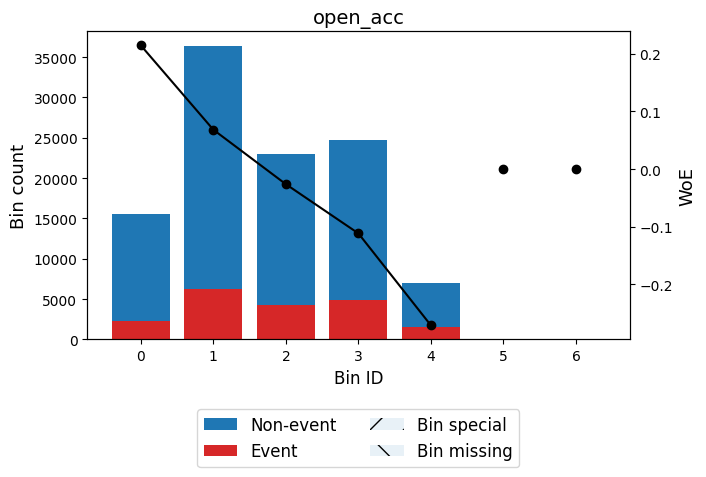


🔍 Feature: pub_rec
✅ Total IV for pub_rec: 0.0068
╒══════════════╤═════════╤════════════════════╤══════════════════════╤════════════╕
│ Bin          │   Count │   Default Rate (%) │ WOE                  │         IV │
╞══════════════╪═════════╪════════════════════╪══════════════════════╪════════════╡
│ (-inf, 0.50) │   89073 │             0.1749 │ 0.03802274361617042  │ 0.00119272 │
├──────────────┼─────────┼────────────────────┼──────────────────────┼────────────┤
│ [0.50, inf)  │   17586 │             0.2086 │ -0.17983183515230272 │ 0.00564108 │
├──────────────┼─────────┼────────────────────┼──────────────────────┼────────────┤
│ Special      │       0 │             0      │ 0.0                  │ 0          │
├──────────────┼─────────┼────────────────────┼──────────────────────┼────────────┤
│ Missing      │       0 │             0      │ 0.0                  │ 0          │
├──────────────┼─────────┼────────────────────┼──────────────────────┼────────────┤
│              │  106659 

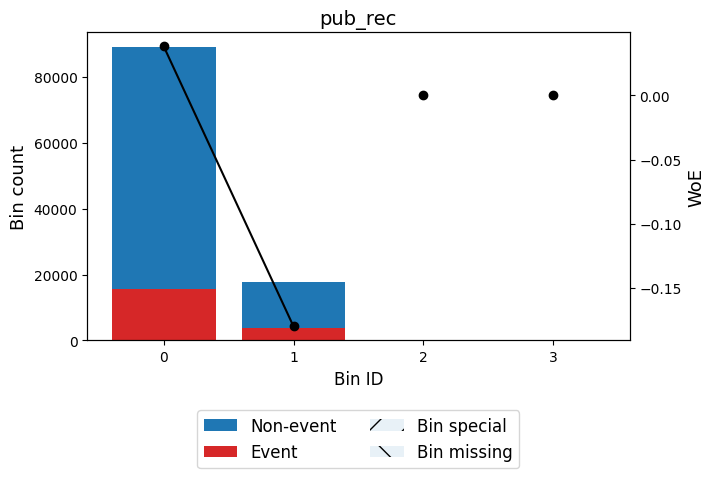


🔍 Feature: revol_bal
✅ Total IV for revol_bal: 0.0035
╒══════════════════════╤═════════╤════════════════════╤═══════════════════════╤═════════════╕
│ Bin                  │   Count │   Default Rate (%) │ WOE                   │          IV │
╞══════════════════════╪═════════╪════════════════════╪═══════════════════════╪═════════════╡
│ (-inf, 7119.50)      │   32056 │             0.1756 │ 0.033215127623552165  │ 0.000328065 │
├──────────────────────┼─────────┼────────────────────┼───────────────────────┼─────────────┤
│ [7119.50, 17927.50)  │   42876 │             0.1861 │ -0.037282036724050505 │ 0.000565418 │
├──────────────────────┼─────────┼────────────────────┼───────────────────────┼─────────────┤
│ [17927.50, 22657.50) │    9583 │             0.1948 │ -0.09406057373297672  │ 0.00081892  │
├──────────────────────┼─────────┼────────────────────┼───────────────────────┼─────────────┤
│ [22657.50, 36962.00) │   14091 │             0.1774 │ 0.020914398815578883  │ 5.7402e-05  │
├────

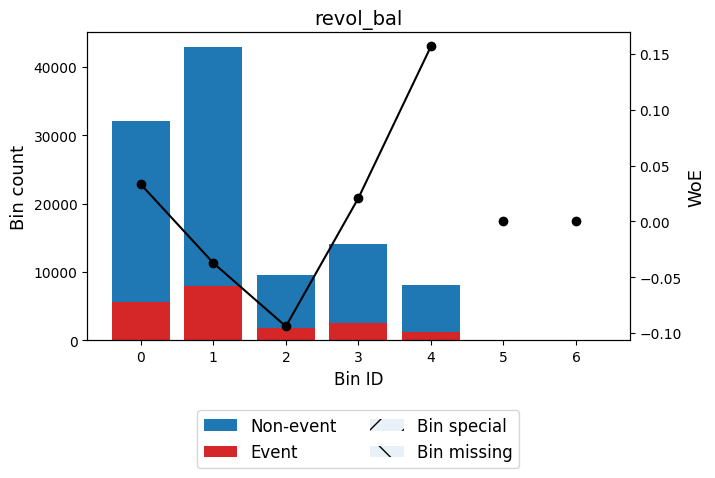


🔍 Feature: revol_util
✅ Total IV for revol_util: 0.0219
╒════════════════╤═════════╤════════════════════╤══════════════════════╤═════════════╕
│ Bin            │   Count │   Default Rate (%) │ WOE                  │          IV │
╞════════════════╪═════════╪════════════════════╪══════════════════════╪═════════════╡
│ (-inf, 21.75)  │   11869 │             0.1351 │ 0.3432157368097002   │ 0.0117096   │
├────────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [21.75, 37.75) │   17882 │             0.162  │ 0.13076215320177487  │ 0.00274798  │
├────────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [37.75, 47.95) │   14649 │             0.1734 │ 0.04876109252491001  │ 0.000321483 │
├────────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [47.95, 61.65) │   21364 │             0.188  │ -0.05013957881474718 │ 0.000511644 │
├────────────────┼─────────┼────────────────────┼──────────────────────┼─

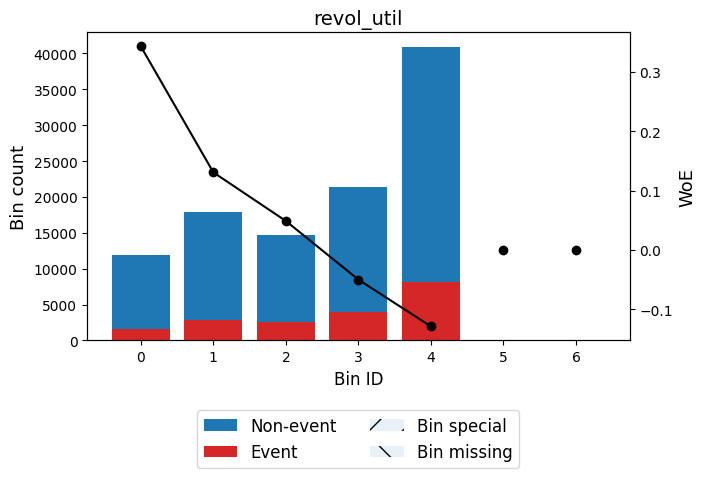


🔍 Feature: total_acc
✅ Total IV for total_acc: 0.0042
╒════════════════╤═════════╤════════════════════╤═══════════════════════╤═════════════╕
│ Bin            │   Count │   Default Rate (%) │ WOE                   │          IV │
╞════════════════╪═════════╪════════════════════╪═══════════════════════╪═════════════╡
│ (-inf, 9.50)   │    5936 │             0.1526 │ 0.20111215283393147   │ 0.00210841  │
├────────────────┼─────────┼────────────────────┼───────────────────────┼─────────────┤
│ [9.50, 18.50)  │   27660 │             0.1777 │ 0.019277227446391265  │ 9.57775e-05 │
├────────────────┼─────────┼────────────────────┼───────────────────────┼─────────────┤
│ [18.50, 33.50) │   49612 │             0.1796 │ 0.005805605046747209  │ 1.56487e-05 │
├────────────────┼─────────┼────────────────────┼───────────────────────┼─────────────┤
│ [33.50, 44.50) │   16076 │             0.1877 │ -0.047809213155527885 │ 0.000349788 │
├────────────────┼─────────┼────────────────────┼────────────────

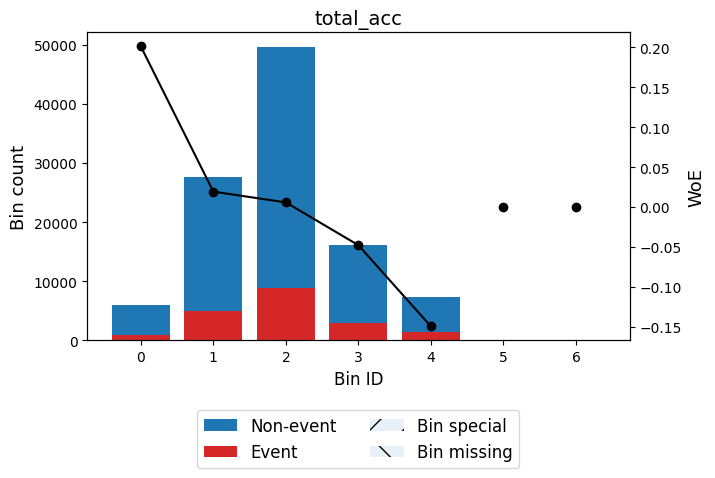


🔍 Feature: collections_12_mths_ex_med
✅ Total IV for collections_12_mths_ex_med: 0.0000
╒═════════════╤═════════╤════════════════════╤════════════════════════╤══════╕
│ Bin         │   Count │   Default Rate (%) │ WOE                    │   IV │
╞═════════════╪═════════╪════════════════════╪════════════════════════╪══════╡
│ (-inf, inf) │  106659 │             0.1805 │ -2.220446049250313e-16 │    0 │
├─────────────┼─────────┼────────────────────┼────────────────────────┼──────┤
│ Special     │       0 │             0      │ 0.0                    │    0 │
├─────────────┼─────────┼────────────────────┼────────────────────────┼──────┤
│ Missing     │       0 │             0      │ 0.0                    │    0 │
├─────────────┼─────────┼────────────────────┼────────────────────────┼──────┤
│             │  106659 │             0.1805 │                        │    0 │
╘═════════════╧═════════╧════════════════════╧════════════════════════╧══════╛


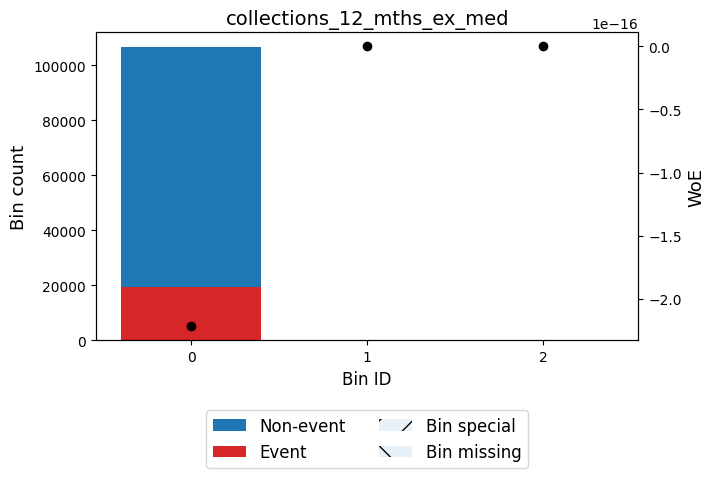


🔍 Feature: acc_now_delinq
✅ Total IV for acc_now_delinq: 0.0000
╒═════════════╤═════════╤════════════════════╤════════════════════════╤══════╕
│ Bin         │   Count │   Default Rate (%) │ WOE                    │   IV │
╞═════════════╪═════════╪════════════════════╪════════════════════════╪══════╡
│ (-inf, inf) │  106659 │             0.1805 │ -2.220446049250313e-16 │    0 │
├─────────────┼─────────┼────────────────────┼────────────────────────┼──────┤
│ Special     │       0 │             0      │ 0.0                    │    0 │
├─────────────┼─────────┼────────────────────┼────────────────────────┼──────┤
│ Missing     │       0 │             0      │ 0.0                    │    0 │
├─────────────┼─────────┼────────────────────┼────────────────────────┼──────┤
│             │  106659 │             0.1805 │                        │    0 │
╘═════════════╧═════════╧════════════════════╧════════════════════════╧══════╛


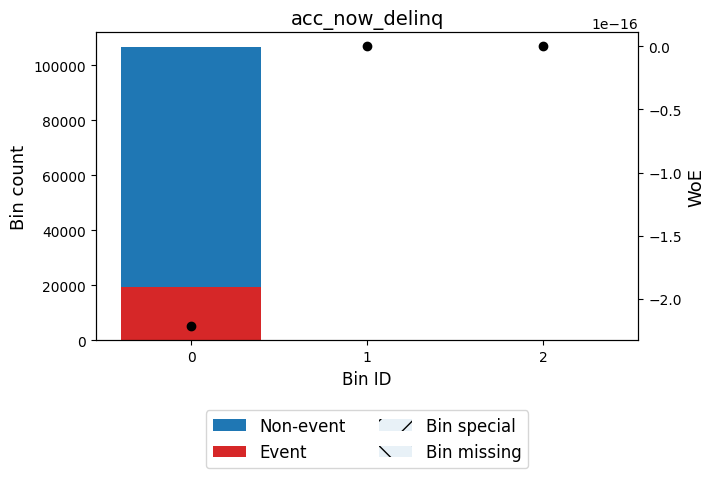


🔍 Feature: tot_cur_bal
✅ Total IV for tot_cur_bal: 0.0290
╒═══════════════════════╤═════════╤════════════════════╤══════════════════════╤═════════════╕
│ Bin                   │   Count │   Default Rate (%) │ WOE                  │          IV │
╞═══════════════════════╪═════════╪════════════════════╪══════════════════════╪═════════════╡
│ (-inf, 13577.50)      │    9035 │             0.1604 │ 0.14240697571128802  │ 0.00164047  │
├───────────────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [13577.50, 37020.50)  │   21990 │             0.1996 │ -0.12445412925984778 │ 0.00332112  │
├───────────────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [37020.50, 76421.00)  │   17892 │             0.2202 │ -0.24858166036009277 │ 0.0111975   │
├───────────────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [76421.00, 240385.00) │   37454 │             0.1746 │ 0.040248186044145484 │ 0.000561547 │
├

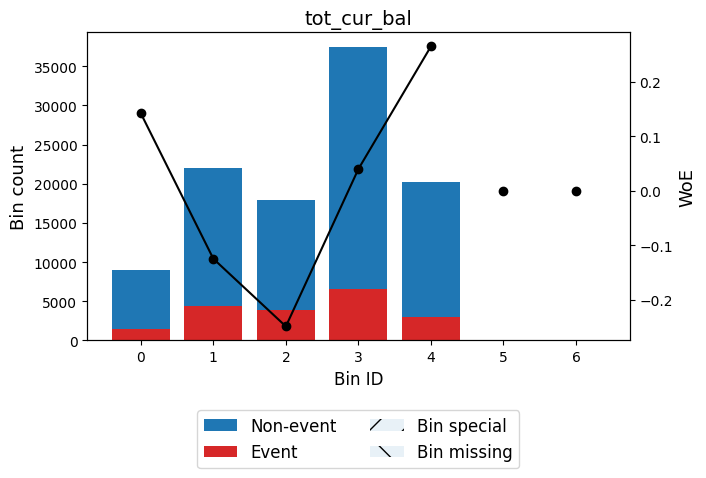


🔍 Feature: total_rev_hi_lim
✅ Total IV for total_rev_hi_lim: 0.0212
╒══════════════════════╤═════════╤════════════════════╤══════════════════════╤═════════════╕
│ Bin                  │   Count │   Default Rate (%) │ WOE                  │          IV │
╞══════════════════════╪═════════╪════════════════════╪══════════════════════╪═════════════╡
│ (-inf, 19369.50)     │   39675 │             0.1973 │ -0.10978766769159454 │ 0.00464176  │
├──────────────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [19369.50, 23955.50) │   10635 │             0.1912 │ -0.07054160450153901 │ 0.000507396 │
├──────────────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [23955.50, 53290.00) │   41637 │             0.1778 │ 0.018638791587159753 │ 0.000134811 │
├──────────────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [53290.00, 79556.50) │    8926 │             0.1453 │ 0.2588790655569113   │ 0.00515356  │
├

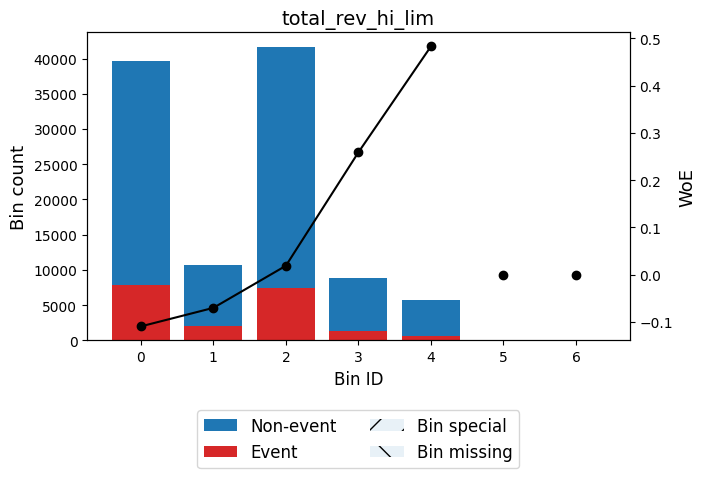


🔍 Feature: acc_open_past_24mths
✅ Total IV for acc_open_past_24mths: 0.0863
╒══════════════╤═════════╤════════════════════╤═════════════════════╤════════════╕
│ Bin          │   Count │   Default Rate (%) │ WOE                 │         IV │
╞══════════════╪═════════╪════════════════════╪═════════════════════╪════════════╡
│ (-inf, 2.50) │   27027 │             0.1299 │ 0.3890837221800465  │ 0.0337415  │
├──────────────┼─────────┼────────────────────┼─────────────────────┼────────────┤
│ [2.50, 4.50) │   34512 │             0.1644 │ 0.1125649172303238  │ 0.00395359 │
├──────────────┼─────────┼────────────────────┼─────────────────────┼────────────┤
│ [4.50, 7.50) │   29338 │             0.201  │ -0.132768673802921  │ 0.00505573 │
├──────────────┼─────────┼────────────────────┼─────────────────────┼────────────┤
│ [7.50, 9.50) │    8610 │             0.2424 │ -0.3734170394979788 │ 0.0126151  │
├──────────────┼─────────┼────────────────────┼─────────────────────┼────────────┤
│ [9.50, i

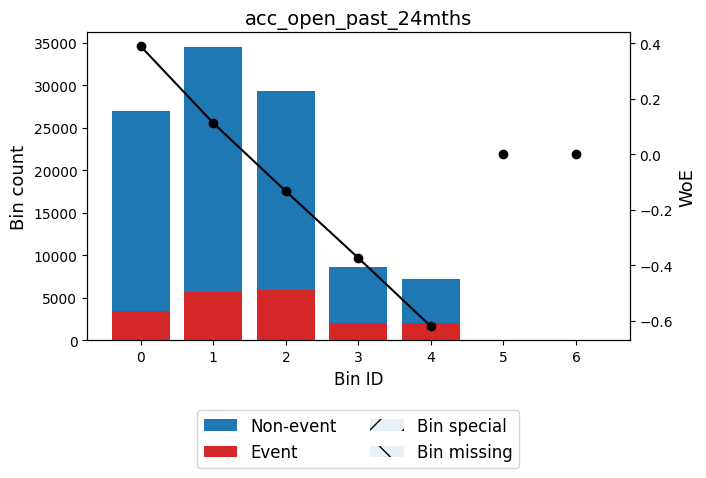


🔍 Feature: avg_cur_bal
✅ Total IV for avg_cur_bal: 0.0388
╒══════════════════════╤═════════╤════════════════════╤══════════════════════╤═════════════╕
│ Bin                  │   Count │   Default Rate (%) │ WOE                  │          IV │
╞══════════════════════╪═════════╪════════════════════╪══════════════════════╪═════════════╡
│ (-inf, 1307.50)      │    6403 │             0.1696 │ 0.07538420879358365  │ 0.000332973 │
├──────────────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [1307.50, 7209.50)   │   43045 │             0.2099 │ -0.18761520735253723 │ 0.0150645   │
├──────────────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [7209.50, 24189.50)  │   40387 │             0.1718 │ 0.06015857795419932  │ 0.00134413  │
├──────────────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [24189.50, 41144.00) │   11480 │             0.138  │ 0.3191535374810788   │ 0.00987293  │
├──────────

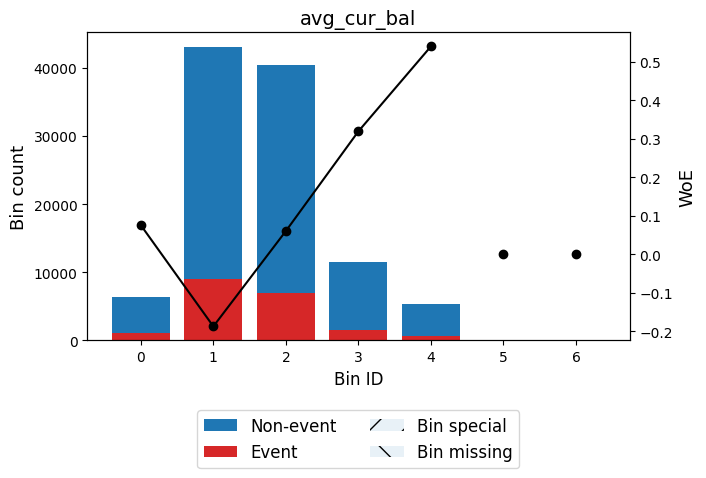


🔍 Feature: bc_open_to_buy
✅ Total IV for bc_open_to_buy: 0.0519
╒══════════════════════╤═════════╤════════════════════╤══════════════════════╤═════════════╕
│ Bin                  │   Count │   Default Rate (%) │ WOE                  │          IV │
╞══════════════════════╪═════════╪════════════════════╪══════════════════════╪═════════════╡
│ (-inf, 344.50)       │   10038 │             0.2315 │ -0.3132767834205026  │ 0.0101715   │
├──────────────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [344.50, 2675.50)    │   28491 │             0.2049 │ -0.15690433366000622 │ 0.00690845  │
├──────────────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [2675.50, 14317.50)  │   47764 │             0.1778 │ 0.01822023398229833  │ 0.000147801 │
├──────────────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [14317.50, 29655.00) │   12768 │             0.1441 │ 0.26853892699066617  │ 0.00790671  │
├────

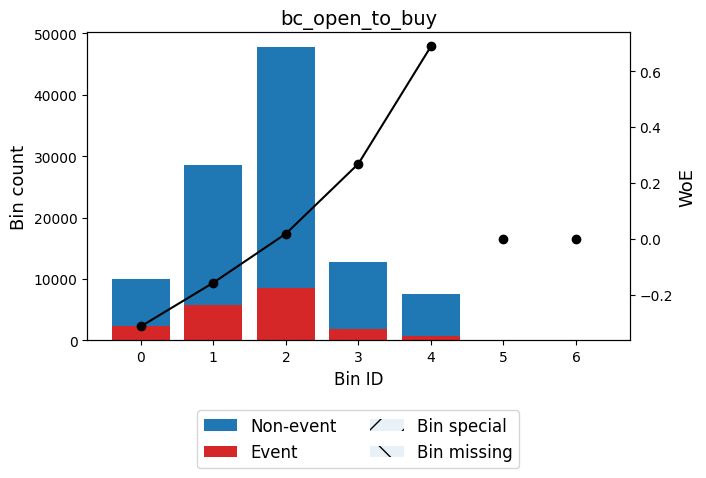


🔍 Feature: bc_util
✅ Total IV for bc_util: 0.0268
╒════════════════╤═════════╤════════════════════╤══════════════════════╤═════════════╕
│ Bin            │   Count │   Default Rate (%) │ WOE                  │          IV │
╞════════════════╪═════════╪════════════════════╪══════════════════════╪═════════════╡
│ (-inf, 31.75)  │   17422 │             0.1454 │ 0.25819451003700133  │ 0.010008    │
├────────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [31.75, 42.95) │    9757 │             0.1596 │ 0.1483494572014723   │ 0.00191875  │
├────────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [42.95, 73.75) │   39001 │             0.1745 │ 0.041160780911184025 │ 0.000611379 │
├────────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [73.75, 94.95) │   29329 │             0.1973 │ -0.11006703117266547 │ 0.00344912  │
├────────────────┼─────────┼────────────────────┼──────────────────────┼───────

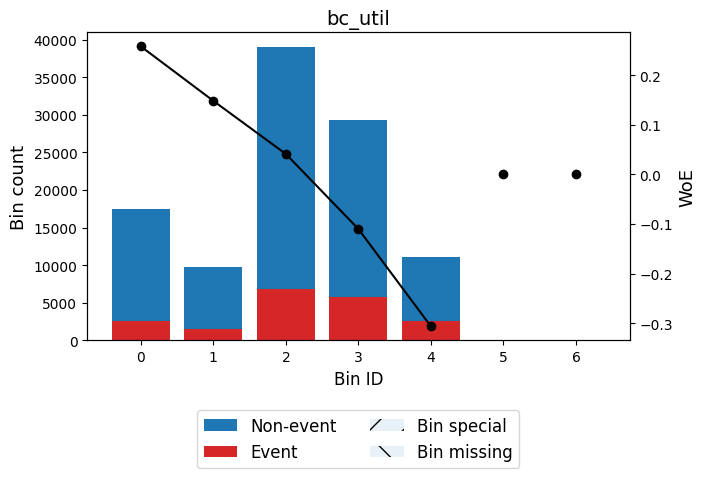


🔍 Feature: chargeoff_within_12_mths
✅ Total IV for chargeoff_within_12_mths: 0.0000
╒═════════════╤═════════╤════════════════════╤════════════════════════╤══════╕
│ Bin         │   Count │   Default Rate (%) │ WOE                    │   IV │
╞═════════════╪═════════╪════════════════════╪════════════════════════╪══════╡
│ (-inf, inf) │  106659 │             0.1805 │ -2.220446049250313e-16 │    0 │
├─────────────┼─────────┼────────────────────┼────────────────────────┼──────┤
│ Special     │       0 │             0      │ 0.0                    │    0 │
├─────────────┼─────────┼────────────────────┼────────────────────────┼──────┤
│ Missing     │       0 │             0      │ 0.0                    │    0 │
├─────────────┼─────────┼────────────────────┼────────────────────────┼──────┤
│             │  106659 │             0.1805 │                        │    0 │
╘═════════════╧═════════╧════════════════════╧════════════════════════╧══════╛


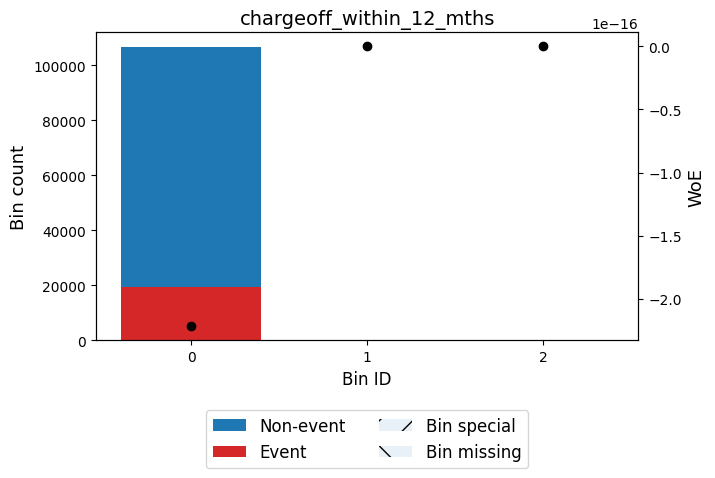


🔍 Feature: delinq_amnt
✅ Total IV for delinq_amnt: 0.0000
╒═════════════╤═════════╤════════════════════╤════════════════════════╤══════╕
│ Bin         │   Count │   Default Rate (%) │ WOE                    │   IV │
╞═════════════╪═════════╪════════════════════╪════════════════════════╪══════╡
│ (-inf, inf) │  106659 │             0.1805 │ -2.220446049250313e-16 │    0 │
├─────────────┼─────────┼────────────────────┼────────────────────────┼──────┤
│ Special     │       0 │             0      │ 0.0                    │    0 │
├─────────────┼─────────┼────────────────────┼────────────────────────┼──────┤
│ Missing     │       0 │             0      │ 0.0                    │    0 │
├─────────────┼─────────┼────────────────────┼────────────────────────┼──────┤
│             │  106659 │             0.1805 │                        │    0 │
╘═════════════╧═════════╧════════════════════╧════════════════════════╧══════╛


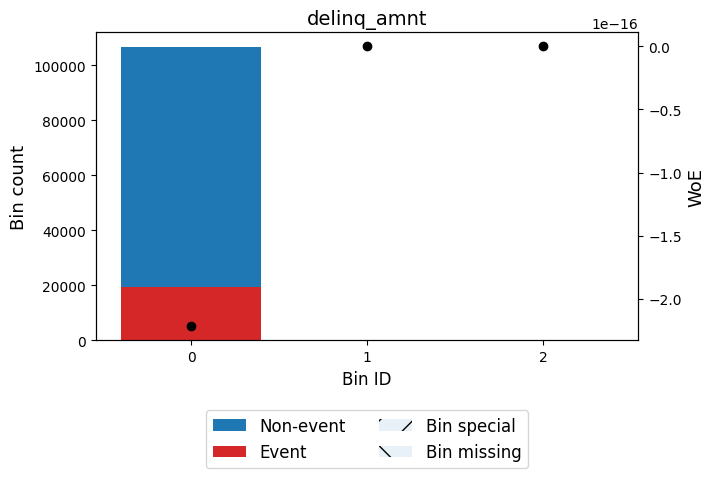


🔍 Feature: mo_sin_old_il_acct
✅ Total IV for mo_sin_old_il_acct: 0.0079
╒══════════════════╤═════════╤════════════════════╤═══════════════════════╤═════════════╕
│ Bin              │   Count │   Default Rate (%) │ WOE                   │          IV │
╞══════════════════╪═════════╪════════════════════╪═══════════════════════╪═════════════╡
│ (-inf, 53.50)    │    9080 │             0.209  │ -0.18224660860071906  │ 0.00299356  │
├──────────────────┼─────────┼────────────────────┼───────────────────────┼─────────────┤
│ [53.50, 128.50)  │   38101 │             0.1868 │ -0.04221192433570131  │ 0.000645121 │
├──────────────────┼─────────┼────────────────────┼───────────────────────┼─────────────┤
│ [128.50, 129.50) │   10560 │             0.1534 │ 0.19508563572425608   │ 0.00353641  │
├──────────────────┼─────────┼────────────────────┼───────────────────────┼─────────────┤
│ [129.50, 208.50) │   43483 │             0.1747 │ 0.03972951575548622   │ 0.000635351 │
├──────────────────┼───────

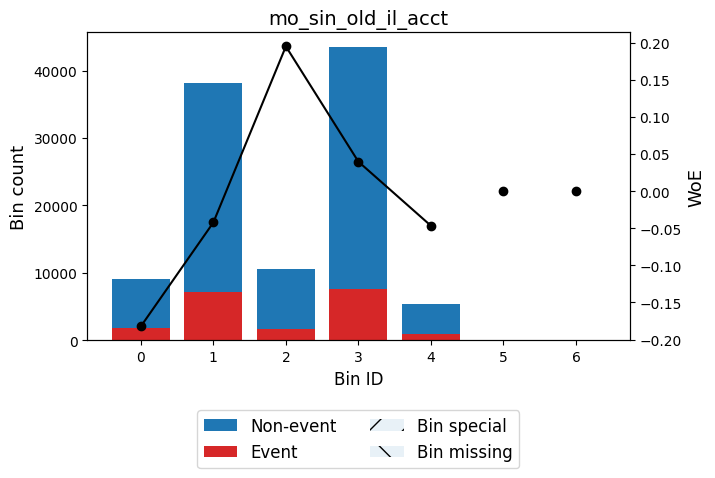


🔍 Feature: mo_sin_old_rev_tl_op
✅ Total IV for mo_sin_old_rev_tl_op: 0.0136
╒══════════════════╤═════════╤════════════════════╤══════════════════════╤═════════════╕
│ Bin              │   Count │   Default Rate (%) │ WOE                  │          IV │
╞══════════════════╪═════════╪════════════════════╪══════════════════════╪═════════════╡
│ (-inf, 75.50)    │    8584 │             0.2203 │ -0.24906738977468934 │ 0.00539398  │
├──────────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [75.50, 145.50)  │   31043 │             0.1945 │ -0.09202083063065403 │ 0.00253737  │
├──────────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [145.50, 159.50) │    7147 │             0.1854 │ -0.03279241833162816 │ 7.28129e-05 │
├──────────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [159.50, 165.50) │    9546 │             0.1552 │ 0.18099338023824374  │ 0.00276449  │
├──────────────────┼─────────┼───

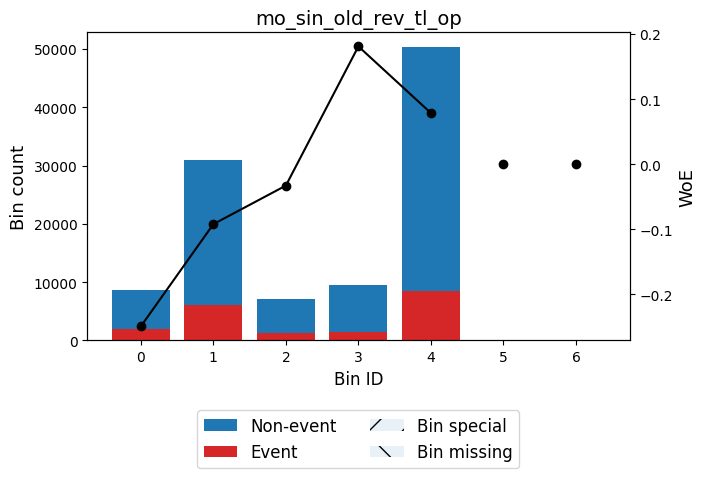


🔍 Feature: mo_sin_rcnt_rev_tl_op
✅ Total IV for mo_sin_rcnt_rev_tl_op: 0.0273
╒════════════════╤═════════╤════════════════════╤══════════════════════╤═════════════╕
│ Bin            │   Count │   Default Rate (%) │ WOE                  │          IV │
╞════════════════╪═════════╪════════════════════╪══════════════════════╪═════════════╡
│ (-inf, 2.50)   │   16453 │             0.2151 │ -0.21855601137592506 │ 0.00788784  │
├────────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [2.50, 7.50)   │   31836 │             0.1933 │ -0.08433572370764186 │ 0.00218043  │
├────────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [7.50, 17.50)  │   36410 │             0.1767 │ 0.02596562431056615  │ 0.000228249 │
├────────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [17.50, 30.50) │   12632 │             0.1529 │ 0.19866420146066033  │ 0.00438174  │
├────────────────┼─────────┼────────────────────┼──

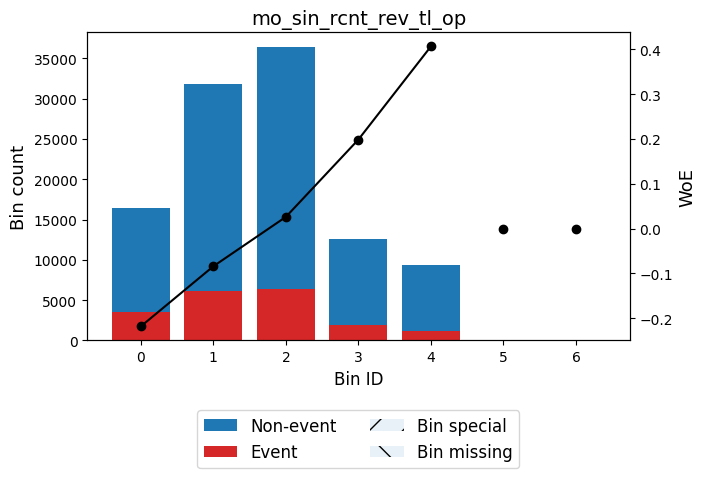


🔍 Feature: mo_sin_rcnt_tl
✅ Total IV for mo_sin_rcnt_tl: 0.0377
╒═══════════════╤═════════╤════════════════════╤══════════════════════╤═════════════╕
│ Bin           │   Count │   Default Rate (%) │ WOE                  │          IV │
╞═══════════════╪═════════╪════════════════════╪══════════════════════╪═════════════╡
│ (-inf, 2.50)  │   21527 │             0.2188 │ -0.24032143270458728 │ 0.0125606   │
├───────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [2.50, 4.50)  │   20325 │             0.1975 │ -0.11128273498267638 │ 0.00244426  │
├───────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [4.50, 9.50)  │   38076 │             0.1765 │ 0.02711298679028129  │ 0.000260157 │
├───────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [9.50, 13.50) │   12149 │             0.1603 │ 0.14327024889379802  │ 0.00223206  │
├───────────────┼─────────┼────────────────────┼──────────────────────┼────

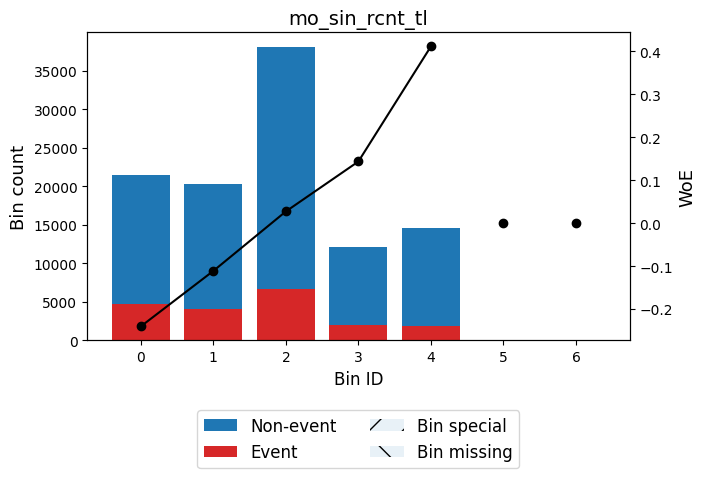


🔍 Feature: mort_acc
✅ Total IV for mort_acc: 0.0235
╒══════════════╤═════════╤════════════════════╤══════════════════════╤═════════════╕
│ Bin          │   Count │   Default Rate (%) │ WOE                  │          IV │
╞══════════════╪═════════╪════════════════════╪══════════════════════╪═════════════╡
│ (-inf, 0.50) │   40491 │             0.2066 │ -0.16741446752008682 │ 0.0112138   │
├──────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [0.50, 2.50) │   36657 │             0.1739 │ 0.04533547874682209  │ 0.000696172 │
├──────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [2.50, 3.50) │   11068 │             0.1647 │ 0.11057556492568832  │ 0.00122429  │
├──────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [3.50, 5.50) │   12665 │             0.1469 │ 0.2457786540533815   │ 0.00661979  │
├──────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [5.50, inf

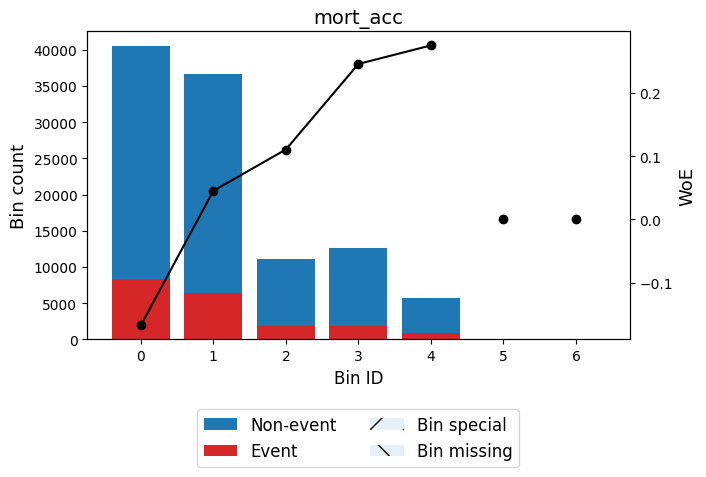


🔍 Feature: mths_since_recent_bc
✅ Total IV for mths_since_recent_bc: 0.0252
╒════════════════╤═════════╤════════════════════╤══════════════════════╤═════════════╕
│ Bin            │   Count │   Default Rate (%) │ WOE                  │          IV │
╞════════════════╪═════════╪════════════════════╪══════════════════════╪═════════════╡
│ (-inf, 2.50)   │    8895 │             0.2194 │ -0.2441443344366383  │ 0.00536269  │
├────────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [2.50, 11.50)  │   35886 │             0.1994 │ -0.12320763741004481 │ 0.00530974  │
├────────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [11.50, 29.50) │   37227 │             0.1747 │ 0.03938409414561117  │ 0.000534584 │
├────────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [29.50, 76.50) │   17886 │             0.154  │ 0.19073350224744567  │ 0.00573377  │
├────────────────┼─────────┼────────────────────┼────

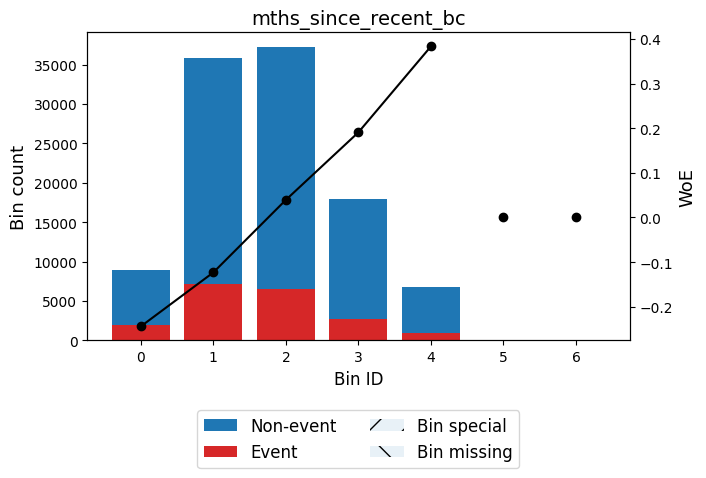


🔍 Feature: mths_since_recent_inq
✅ Total IV for mths_since_recent_inq: 0.0342
╒══════════════╤═════════╤════════════════════╤══════════════════════╤═════════════╕
│ Bin          │   Count │   Default Rate (%) │ WOE                  │          IV │
╞══════════════╪═════════╪════════════════════╪══════════════════════╪═════════════╡
│ (-inf, 1.50) │   18948 │             0.224  │ -0.2707140693846646  │ 0.0141575   │
├──────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [1.50, 3.50) │   16014 │             0.2068 │ -0.16881657935910432 │ 0.00451154  │
├──────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [3.50, 4.50) │    6822 │             0.1854 │ -0.03303753209857341 │ 7.05502e-05 │
├──────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [4.50, 5.50) │   20813 │             0.1444 │ 0.2663464223291441   │ 0.0126883   │
├──────────────┼─────────┼────────────────────┼──────────────────────┼─

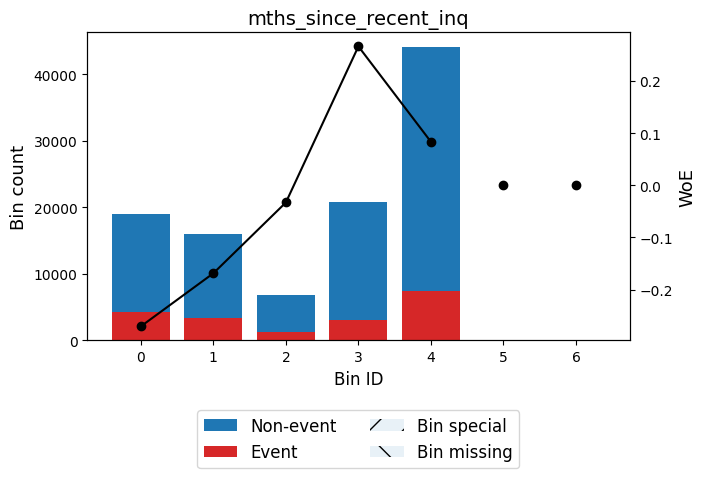


🔍 Feature: num_accts_ever_120_pd
✅ Total IV for num_accts_ever_120_pd: 0.0068
╒══════════════╤═════════╤════════════════════╤══════════════════════╤════════════╕
│ Bin          │   Count │   Default Rate (%) │ WOE                  │         IV │
╞══════════════╪═════════╪════════════════════╪══════════════════════╪════════════╡
│ (-inf, 0.50) │   82916 │             0.1739 │ 0.045387276574833324 │ 0.00157828 │
├──────────────┼─────────┼────────────────────┼──────────────────────┼────────────┤
│ [0.50, inf)  │   23743 │             0.2036 │ -0.14906008729908238 │ 0.00518334 │
├──────────────┼─────────┼────────────────────┼──────────────────────┼────────────┤
│ Special      │       0 │             0      │ 0.0                  │ 0          │
├──────────────┼─────────┼────────────────────┼──────────────────────┼────────────┤
│ Missing      │       0 │             0      │ 0.0                  │ 0          │
├──────────────┼─────────┼────────────────────┼──────────────────────┼───────────

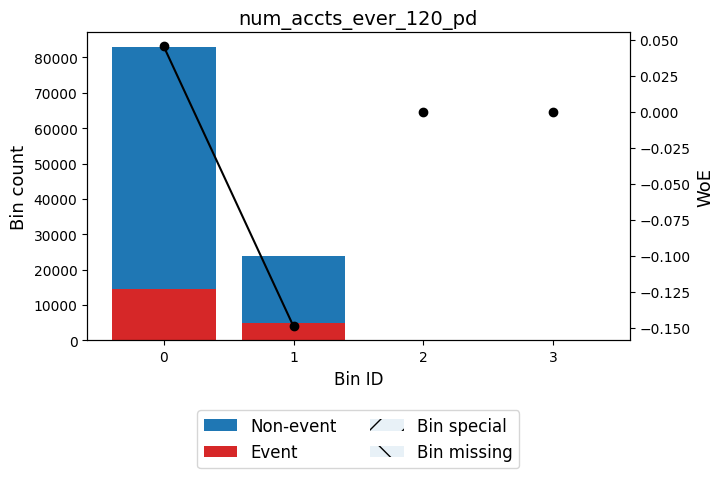


🔍 Feature: num_actv_bc_tl
✅ Total IV for num_actv_bc_tl: 0.0115
╒══════════════╤═════════╤════════════════════╤════════════════════════╤═════════════╕
│ Bin          │   Count │   Default Rate (%) │ WOE                    │          IV │
╞══════════════╪═════════╪════════════════════╪════════════════════════╪═════════════╡
│ (-inf, 3.50) │   60972 │             0.1692 │ 0.07845447376176651    │ 0.00343083  │
├──────────────┼─────────┼────────────────────┼────────────────────────┼─────────────┤
│ [3.50, 4.50) │   17233 │             0.1808 │ -0.0021941873233133347 │ 7.78422e-07 │
├──────────────┼─────────┼────────────────────┼────────────────────────┼─────────────┤
│ [4.50, 5.50) │   11408 │             0.1924 │ -0.0785903206172136    │ 0.000677276 │
├──────────────┼─────────┼────────────────────┼────────────────────────┼─────────────┤
│ [5.50, 7.50) │   11298 │             0.2074 │ -0.17224392822985757   │ 0.00331697  │
├──────────────┼─────────┼────────────────────┼──────────────────

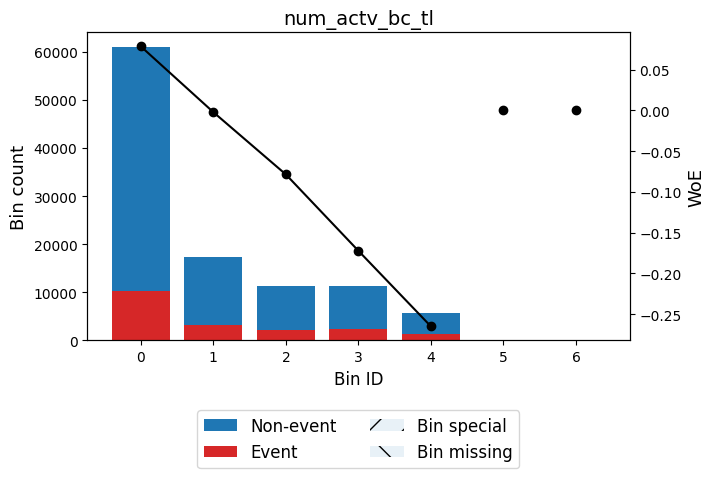


🔍 Feature: num_actv_rev_tl
✅ Total IV for num_actv_rev_tl: 0.0324
╒══════════════╤═════════╤════════════════════╤══════════════════════╤═════════════╕
│ Bin          │   Count │   Default Rate (%) │ WOE                  │          IV │
╞══════════════╪═════════╪════════════════════╪══════════════════════╪═════════════╡
│ (-inf, 2.50) │   11822 │             0.1461 │ 0.2526306483833851   │ 0.00651364  │
├──────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [2.50, 5.50) │   50375 │             0.1651 │ 0.10743620399852216  │ 0.00526572  │
├──────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [5.50, 7.50) │   21266 │             0.1879 │ -0.04934677284459377 │ 0.000493195 │
├──────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [7.50, 9.50) │   11792 │             0.2075 │ -0.17304514776988245 │ 0.00349514  │
├──────────────┼─────────┼────────────────────┼──────────────────────┼─────────────

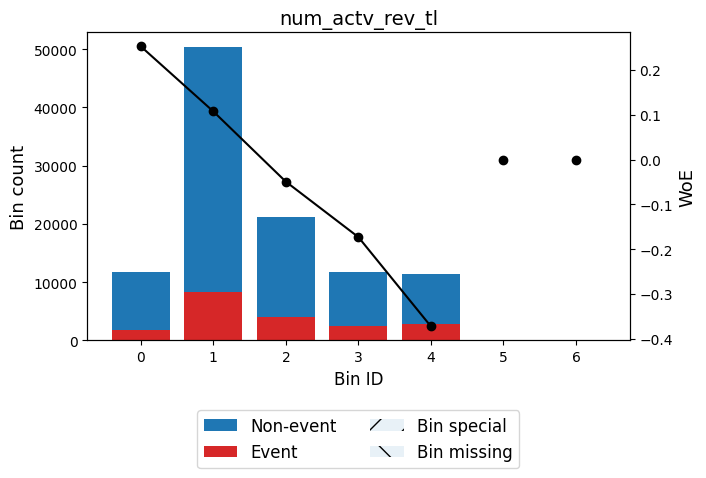


🔍 Feature: num_bc_sats
✅ Total IV for num_bc_sats: 0.0046
╒══════════════╤═════════╤════════════════════╤═══════════════════════╤═════════════╕
│ Bin          │   Count │   Default Rate (%) │ WOE                   │          IV │
╞══════════════╪═════════╪════════════════════╪═══════════════════════╪═════════════╡
│ (-inf, 2.50) │   20956 │             0.1819 │ -0.009208840193713597 │ 1.67108e-05 │
├──────────────┼─────────┼────────────────────┼───────────────────────┼─────────────┤
│ [2.50, 3.50) │   17743 │             0.172  │ 0.058414143749205394  │ 0.000557075 │
├──────────────┼─────────┼────────────────────┼───────────────────────┼─────────────┤
│ [3.50, 4.50) │   22612 │             0.1666 │ 0.096626399906804     │ 0.00191867  │
├──────────────┼─────────┼────────────────────┼───────────────────────┼─────────────┤
│ [4.50, 5.50) │   13880 │             0.1837 │ -0.02166308834729369  │ 6.14939e-05 │
├──────────────┼─────────┼────────────────────┼───────────────────────┼──────────

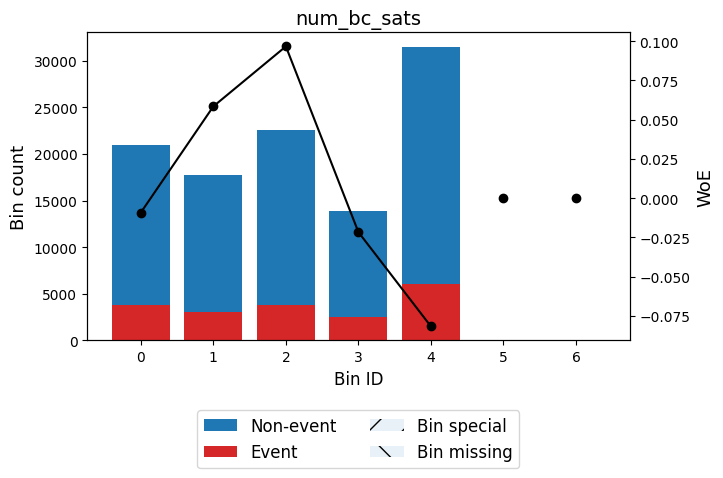


🔍 Feature: num_bc_tl
✅ Total IV for num_bc_tl: 0.0024
╒═══════════════╤═════════╤════════════════════╤═══════════════════════╤═════════════╕
│ Bin           │   Count │   Default Rate (%) │ WOE                   │          IV │
╞═══════════════╪═════════╪════════════════════╪═══════════════════════╪═════════════╡
│ (-inf, 2.50)  │    5970 │             0.1951 │ -0.09608784881228205  │ 0.000532735 │
├───────────────┼─────────┼────────────────────┼───────────────────────┼─────────────┤
│ [2.50, 6.50)  │   35628 │             0.1845 │ -0.026990112008209888 │ 0.000245436 │
├───────────────┼─────────┼────────────────────┼───────────────────────┼─────────────┤
│ [6.50, 7.50)  │   15831 │             0.1659 │ 0.10210996565161734   │ 0.0014974   │
├───────────────┼─────────┼────────────────────┼───────────────────────┼─────────────┤
│ [7.50, 16.50) │   43058 │             0.1798 │ 0.004967257172422634  │ 9.94489e-06 │
├───────────────┼─────────┼────────────────────┼───────────────────────┼───

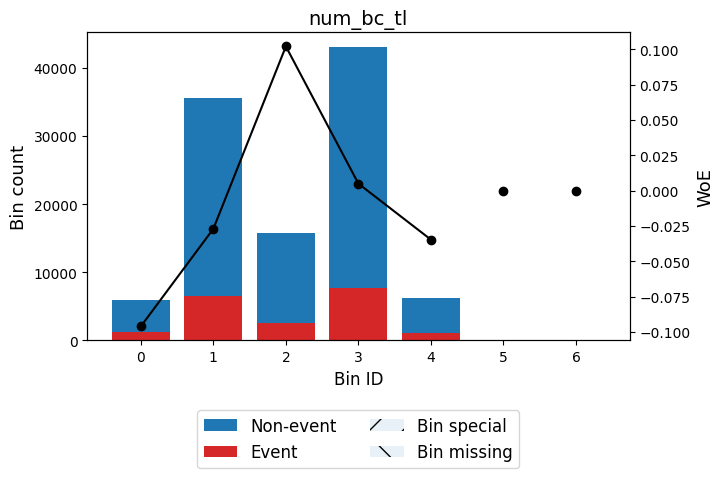


🔍 Feature: num_il_tl
✅ Total IV for num_il_tl: 0.0085
╒════════════════╤═════════╤════════════════════╤═══════════════════════╤═════════════╕
│ Bin            │   Count │   Default Rate (%) │ WOE                   │          IV │
╞════════════════╪═════════╪════════════════════╪═══════════════════════╪═════════════╡
│ (-inf, 1.50)   │    8651 │             0.1607 │ 0.14019000903863543   │ 0.00152333  │
├────────────────┼─────────┼────────────────────┼───────────────────────┼─────────────┤
│ [1.50, 7.50)   │   53606 │             0.1742 │ 0.042886831562227945  │ 0.000911775 │
├────────────────┼─────────┼────────────────────┼───────────────────────┼─────────────┤
│ [7.50, 10.50)  │   15598 │             0.1832 │ -0.017970787466266236 │ 4.75001e-05 │
├────────────────┼─────────┼────────────────────┼───────────────────────┼─────────────┤
│ [10.50, 22.50) │   23445 │             0.1888 │ -0.055081566346207866 │ 0.00067868  │
├────────────────┼─────────┼────────────────────┼────────────────

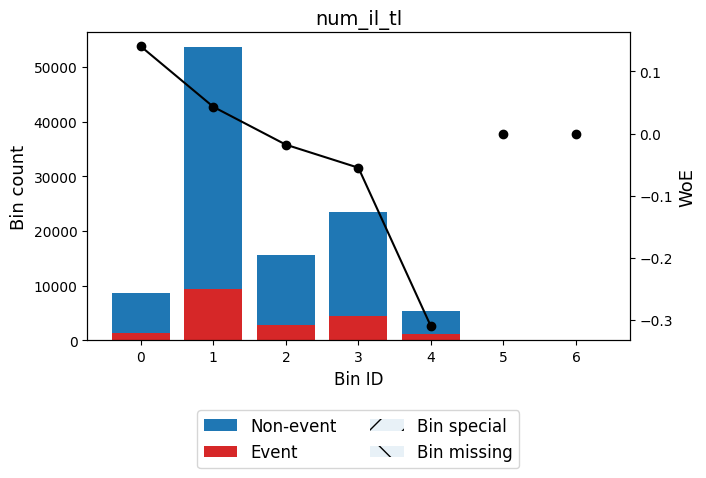


🔍 Feature: num_op_rev_tl
✅ Total IV for num_op_rev_tl: 0.0150
╒════════════════╤═════════╤════════════════════╤═══════════════════════╤═════════════╕
│ Bin            │   Count │   Default Rate (%) │ WOE                   │          IV │
╞════════════════╪═════════╪════════════════════╪═══════════════════════╪═════════════╡
│ (-inf, 4.50)   │   18186 │             0.1606 │ 0.14061279856436326   │ 0.00322121  │
├────────────────┼─────────┼────────────────────┼───────────────────────┼─────────────┤
│ [4.50, 7.50)   │   38730 │             0.1682 │ 0.08511664571181465   │ 0.00255959  │
├────────────────┼─────────┼────────────────────┼───────────────────────┼─────────────┤
│ [7.50, 10.50)  │   24627 │             0.1853 │ -0.032076941711629336 │ 0.000240014 │
├────────────────┼─────────┼────────────────────┼───────────────────────┼─────────────┤
│ [10.50, 16.50) │   19764 │             0.2046 │ -0.15501339666613112  │ 0.0046748   │
├────────────────┼─────────┼────────────────────┼────────

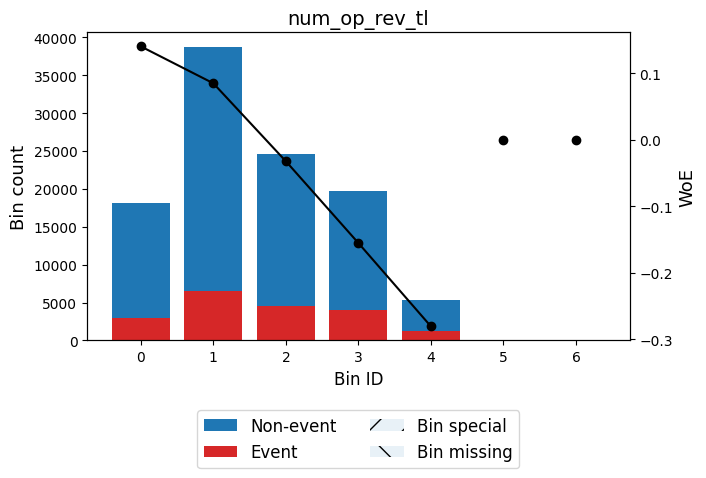


🔍 Feature: num_rev_accts
✅ Total IV for num_rev_accts: 0.0032
╒════════════════╤═════════╤════════════════════╤══════════════════════╤═════════════╕
│ Bin            │   Count │   Default Rate (%) │ WOE                  │          IV │
╞════════════════╪═════════╪════════════════════╪══════════════════════╪═════════════╡
│ (-inf, 12.50)  │   45024 │             0.1791 │ 0.009704888951716617 │ 3.96351e-05 │
├────────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [12.50, 13.50) │   12095 │             0.1629 │ 0.12395026602583159  │ 0.00167379  │
├────────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [13.50, 17.50) │   18586 │             0.1788 │ 0.011173397657365802 │ 2.16774e-05 │
├────────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [17.50, 25.50) │   20960 │             0.1882 │ -0.05106516305932707 │ 0.000520825 │
├────────────────┼─────────┼────────────────────┼──────────────────

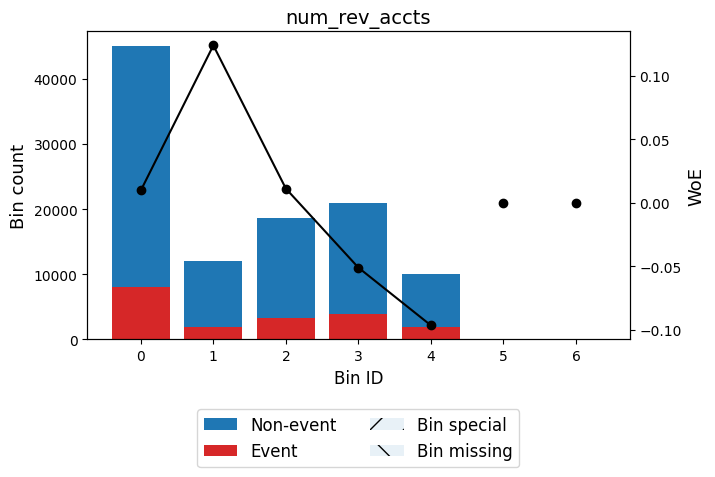


🔍 Feature: num_rev_tl_bal_gt_0
✅ Total IV for num_rev_tl_bal_gt_0: 0.0323
╒══════════════╤═════════╤════════════════════╤═══════════════════════╤═════════════╕
│ Bin          │   Count │   Default Rate (%) │ WOE                   │          IV │
╞══════════════╪═════════╪════════════════════╪═══════════════════════╪═════════════╡
│ (-inf, 2.50) │   11855 │             0.1457 │ 0.2558942620204048    │ 0.00669439  │
├──────────────┼─────────┼────────────────────┼───────────────────────┼─────────────┤
│ [2.50, 5.50) │   50559 │             0.1655 │ 0.10476821661503433   │ 0.0050301   │
├──────────────┼─────────┼────────────────────┼───────────────────────┼─────────────┤
│ [5.50, 7.50) │   21433 │             0.1885 │ -0.053200669763916464 │ 0.000578444 │
├──────────────┼─────────┼────────────────────┼───────────────────────┼─────────────┤
│ [7.50, 9.50) │   11788 │             0.2059 │ -0.1631276085717306   │ 0.0030955   │
├──────────────┼─────────┼────────────────────┼──────────────────

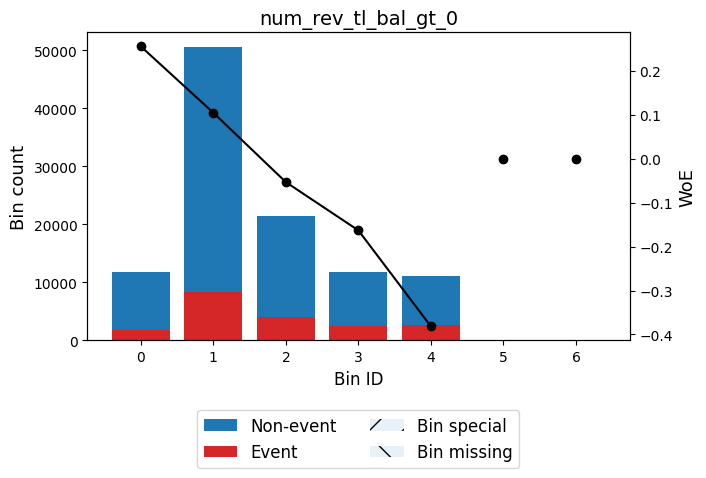


🔍 Feature: num_sats
✅ Total IV for num_sats: 0.0167
╒════════════════╤═════════╤════════════════════╤══════════════════════╤════════════╕
│ Bin            │   Count │   Default Rate (%) │ WOE                  │         IV │
╞════════════════╪═════════╪════════════════════╪══════════════════════╪════════════╡
│ (-inf, 6.50)   │   14345 │             0.1518 │ 0.2072965400776694   │ 0.00540231 │
├────────────────┼─────────┼────────────────────┼──────────────────────┼────────────┤
│ [6.50, 11.50)  │   47956 │             0.1709 │ 0.06619134719484587  │ 0.00192843 │
├────────────────┼─────────┼────────────────────┼──────────────────────┼────────────┤
│ [11.50, 15.50) │   23896 │             0.1916 │ -0.07351890066767619 │ 0.00123951 │
├────────────────┼─────────┼────────────────────┼──────────────────────┼────────────┤
│ [15.50, 20.50) │   13632 │             0.2022 │ -0.14024563059806172 │ 0.00262728 │
├────────────────┼─────────┼────────────────────┼──────────────────────┼────────────┤
│

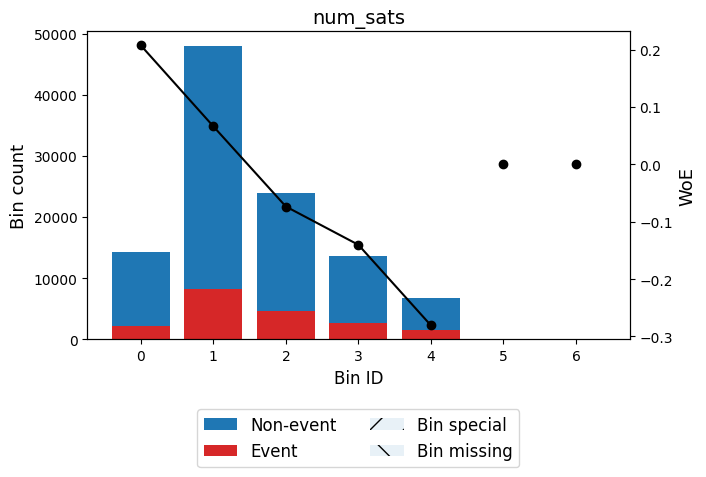


🔍 Feature: num_tl_120dpd_2m
✅ Total IV for num_tl_120dpd_2m: 0.0000
╒═════════════╤═════════╤════════════════════╤════════════════════════╤══════╕
│ Bin         │   Count │   Default Rate (%) │ WOE                    │   IV │
╞═════════════╪═════════╪════════════════════╪════════════════════════╪══════╡
│ (-inf, inf) │  106659 │             0.1805 │ -2.220446049250313e-16 │    0 │
├─────────────┼─────────┼────────────────────┼────────────────────────┼──────┤
│ Special     │       0 │             0      │ 0.0                    │    0 │
├─────────────┼─────────┼────────────────────┼────────────────────────┼──────┤
│ Missing     │       0 │             0      │ 0.0                    │    0 │
├─────────────┼─────────┼────────────────────┼────────────────────────┼──────┤
│             │  106659 │             0.1805 │                        │    0 │
╘═════════════╧═════════╧════════════════════╧════════════════════════╧══════╛


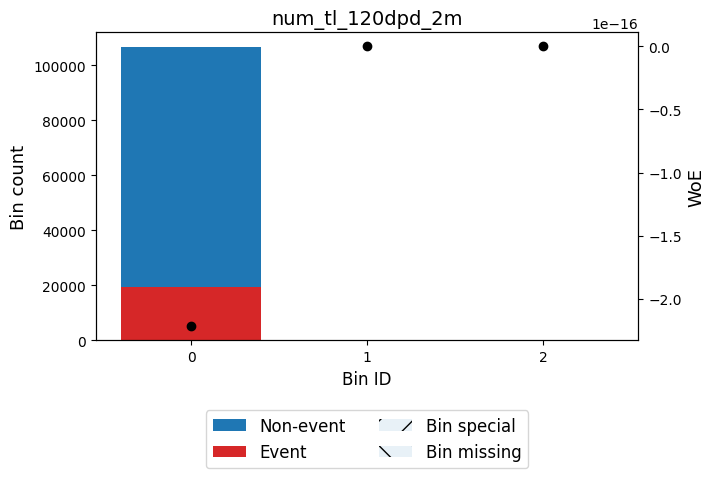


🔍 Feature: num_tl_30dpd
✅ Total IV for num_tl_30dpd: 0.0000
╒═════════════╤═════════╤════════════════════╤════════════════════════╤══════╕
│ Bin         │   Count │   Default Rate (%) │ WOE                    │   IV │
╞═════════════╪═════════╪════════════════════╪════════════════════════╪══════╡
│ (-inf, inf) │  106659 │             0.1805 │ -2.220446049250313e-16 │    0 │
├─────────────┼─────────┼────────────────────┼────────────────────────┼──────┤
│ Special     │       0 │             0      │ 0.0                    │    0 │
├─────────────┼─────────┼────────────────────┼────────────────────────┼──────┤
│ Missing     │       0 │             0      │ 0.0                    │    0 │
├─────────────┼─────────┼────────────────────┼────────────────────────┼──────┤
│             │  106659 │             0.1805 │                        │    0 │
╘═════════════╧═════════╧════════════════════╧════════════════════════╧══════╛


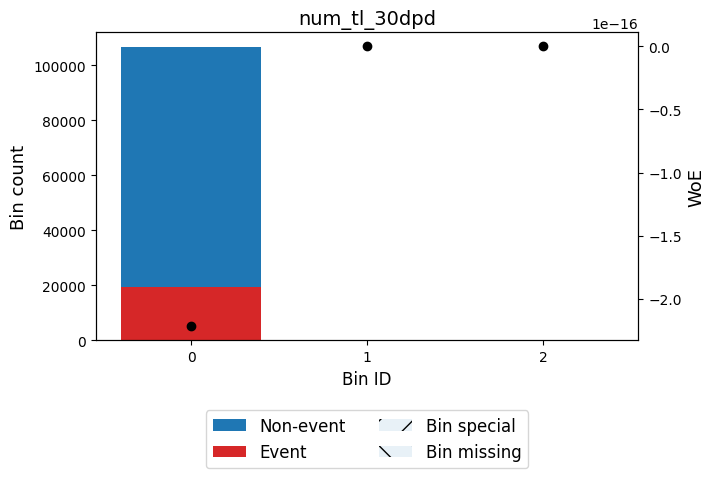


🔍 Feature: num_tl_90g_dpd_24m
✅ Total IV for num_tl_90g_dpd_24m: 0.0012
╒══════════════╤═════════╤════════════════════╤══════════════════════╤═════════════╕
│ Bin          │   Count │   Default Rate (%) │ WOE                  │          IV │
╞══════════════╪═════════╪════════════════════╪══════════════════════╪═════════════╡
│ (-inf, 0.50) │  100659 │             0.1792 │ 0.00855682477432973  │ 6.89115e-05 │
├──────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [0.50, inf)  │    6000 │             0.2017 │ -0.13711375240269974 │ 0.00110423  │
├──────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ Special      │       0 │             0      │ 0.0                  │ 0           │
├──────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ Missing      │       0 │             0      │ 0.0                  │ 0           │
├──────────────┼─────────┼────────────────────┼──────────────────────┼───────

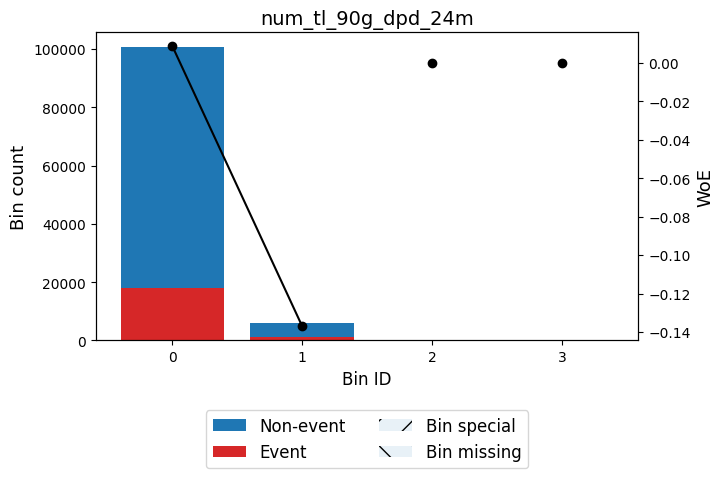


🔍 Feature: num_tl_op_past_12m
✅ Total IV for num_tl_op_past_12m: 0.0618
╒══════════════╤═════════╤════════════════════╤══════════════════════╤═════════════╕
│ Bin          │   Count │   Default Rate (%) │ WOE                  │          IV │
╞══════════════╪═════════╪════════════════════╪══════════════════════╪═════════════╡
│ (-inf, 0.50) │   17034 │             0.1323 │ 0.3680561065629544   │ 0.0191649   │
├──────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [0.50, 1.50) │   24798 │             0.157  │ 0.16747981705142934  │ 0.00617651  │
├──────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [1.50, 2.50) │   29478 │             0.1724 │ 0.05569049531936354  │ 0.000841962 │
├──────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [2.50, 4.50) │   26137 │             0.2138 │ -0.21060533375164225 │ 0.0116074   │
├──────────────┼─────────┼────────────────────┼──────────────────────┼───────

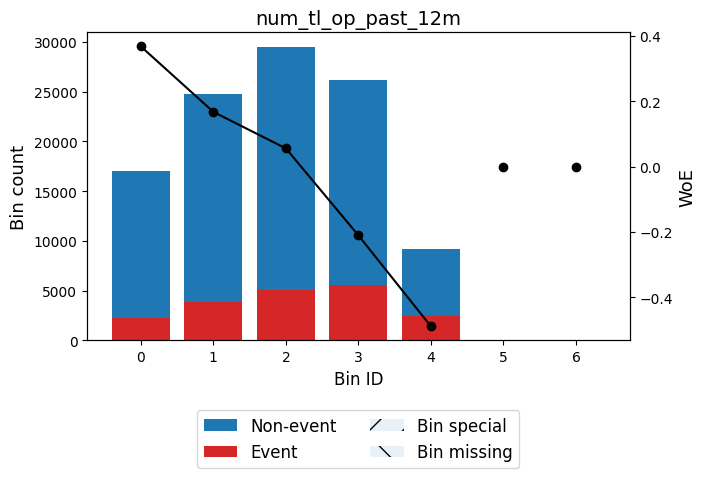


🔍 Feature: pct_tl_nvr_dlq
✅ Total IV for pct_tl_nvr_dlq: 0.0063
╒════════════════╤═════════╤════════════════════╤══════════════════════╤════════════╕
│ Bin            │   Count │   Default Rate (%) │ WOE                  │         IV │
╞════════════════╪═════════╪════════════════════╪══════════════════════╪════════════╡
│ (-inf, 97.85)  │   50305 │             0.1907 │ -0.06753458076615293 │ 0.00219771 │
├────────────────┼─────────┼────────────────────┼──────────────────────┼────────────┤
│ [97.85, 98.05) │    7045 │             0.1482 │ 0.23584282833005488  │ 0.00340182 │
├────────────────┼─────────┼────────────────────┼──────────────────────┼────────────┤
│ [98.05, inf)   │   49309 │             0.1747 │ 0.0396926439302121   │ 0.00071915 │
├────────────────┼─────────┼────────────────────┼──────────────────────┼────────────┤
│ Special        │       0 │             0      │ 0.0                  │ 0          │
├────────────────┼─────────┼────────────────────┼──────────────────────┼───

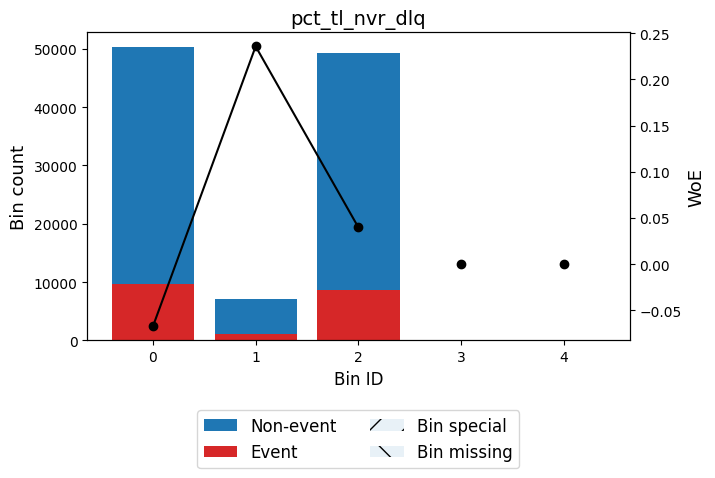


🔍 Feature: percent_bc_gt_75
✅ Total IV for percent_bc_gt_75: 0.0303
╒════════════════╤═════════╤════════════════════╤══════════════════════╤═════════════╕
│ Bin            │   Count │   Default Rate (%) │ WOE                  │          IV │
╞════════════════╪═════════╪════════════════════╪══════════════════════╪═════════════╡
│ (-inf, 11.65)  │   23279 │             0.1454 │ 0.25804046814910975  │ 0.0133573   │
├────────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [11.65, 44.10) │   30649 │             0.1667 │ 0.09621835603885853  │ 0.00257905  │
├────────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [44.10, 52.75) │   12127 │             0.1866 │ -0.04082340500623127 │ 0.000191962 │
├────────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [52.75, 67.95) │   11545 │             0.1989 │ -0.11967684510207088 │ 0.00160994  │
├────────────────┼─────────┼────────────────────┼────────────

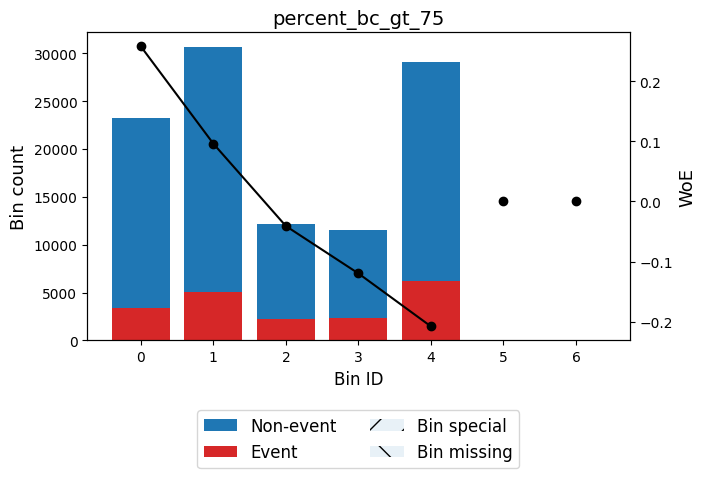


🔍 Feature: pub_rec_bankruptcies
✅ Total IV for pub_rec_bankruptcies: 0.0047
╒══════════════╤═════════╤════════════════════╤══════════════════════╤═════════════╕
│ Bin          │   Count │   Default Rate (%) │ WOE                  │          IV │
╞══════════════╪═════════╪════════════════════╪══════════════════════╪═════════════╡
│ (-inf, 0.50) │   93933 │             0.1767 │ 0.026133367716756783 │ 0.000596452 │
├──────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [0.50, inf)  │   12726 │             0.2088 │ -0.18076007406107264 │ 0.00412556  │
├──────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ Special      │       0 │             0      │ 0.0                  │ 0           │
├──────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ Missing      │       0 │             0      │ 0.0                  │ 0           │
├──────────────┼─────────┼────────────────────┼──────────────────────┼───

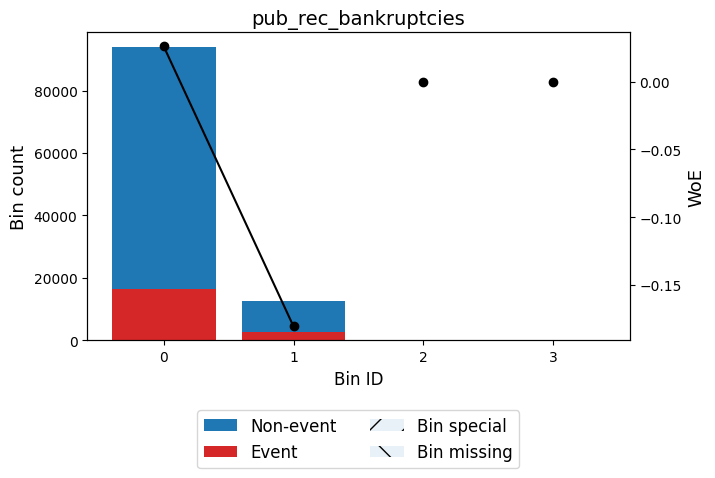


🔍 Feature: tax_liens
✅ Total IV for tax_liens: 0.0000
╒═════════════╤═════════╤════════════════════╤════════════════════════╤══════╕
│ Bin         │   Count │   Default Rate (%) │ WOE                    │   IV │
╞═════════════╪═════════╪════════════════════╪════════════════════════╪══════╡
│ (-inf, inf) │  106659 │             0.1805 │ -2.220446049250313e-16 │    0 │
├─────────────┼─────────┼────────────────────┼────────────────────────┼──────┤
│ Special     │       0 │             0      │ 0.0                    │    0 │
├─────────────┼─────────┼────────────────────┼────────────────────────┼──────┤
│ Missing     │       0 │             0      │ 0.0                    │    0 │
├─────────────┼─────────┼────────────────────┼────────────────────────┼──────┤
│             │  106659 │             0.1805 │                        │    0 │
╘═════════════╧═════════╧════════════════════╧════════════════════════╧══════╛


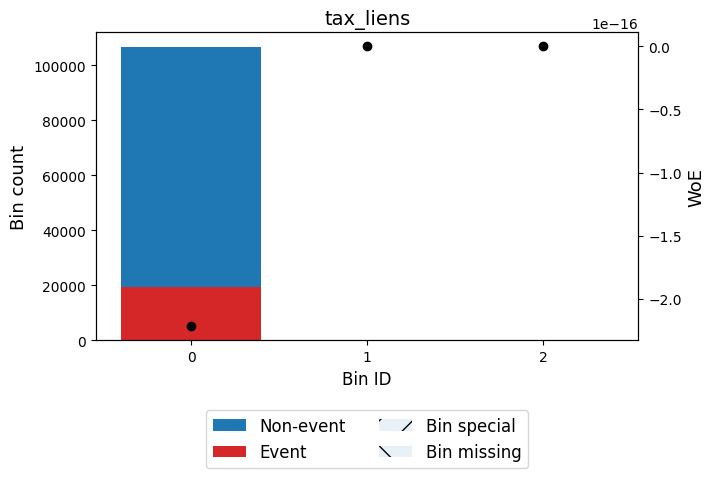


🔍 Feature: tot_hi_cred_lim
✅ Total IV for tot_hi_cred_lim: 0.0317
╒════════════════════════╤═════════╤════════════════════╤══════════════════════╤═════════════╕
│ Bin                    │   Count │   Default Rate (%) │ WOE                  │          IV │
╞════════════════════════╪═════════╪════════════════════╪══════════════════════╪═════════════╡
│ (-inf, 33122.00)       │   13562 │             0.1855 │ -0.03362577157607216 │ 0.000145318 │
├────────────────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [33122.00, 110956.00)  │   36313 │             0.211  │ -0.19410850392975187 │ 0.0136304   │
├────────────────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [110956.00, 225556.00) │   27919 │             0.1738 │ 0.04573879716379392  │ 0.00053963  │
├────────────────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [225556.00, 415353.50) │   20481 │             0.1525 │ 0.20223561270423773 

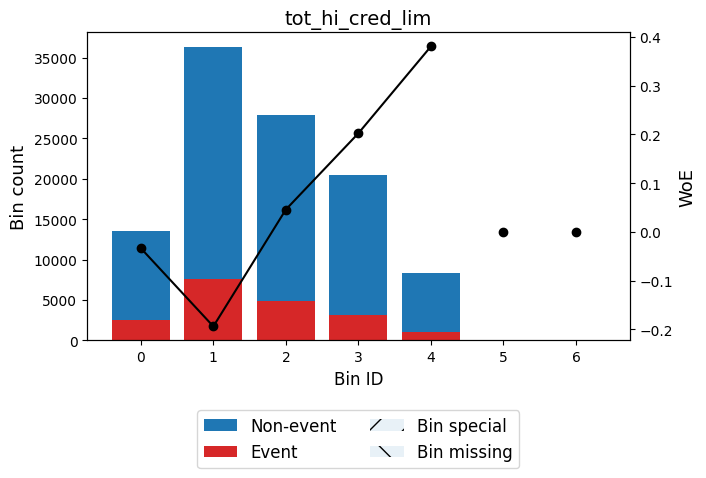


🔍 Feature: total_bal_ex_mort
✅ Total IV for total_bal_ex_mort: 0.0113
╒══════════════════════╤═════════╤════════════════════╤══════════════════════╤═════════════╕
│ Bin                  │   Count │   Default Rate (%) │ WOE                  │          IV │
╞══════════════════════╪═════════╪════════════════════╪══════════════════════╪═════════════╡
│ (-inf, 8813.00)      │    6892 │             0.1364 │ 0.33257889703200405  │ 0.00640741  │
├──────────────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [8813.00, 15736.50)  │    9749 │             0.1646 │ 0.11113389900931381  │ 0.00108911  │
├──────────────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [15736.50, 37035.00) │   38354 │             0.1756 │ 0.03323649751709645  │ 0.000393022 │
├──────────────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [37035.00, 41891.00) │    6642 │             0.1882 │ -0.0512509819210778  │ 0.000166257 │

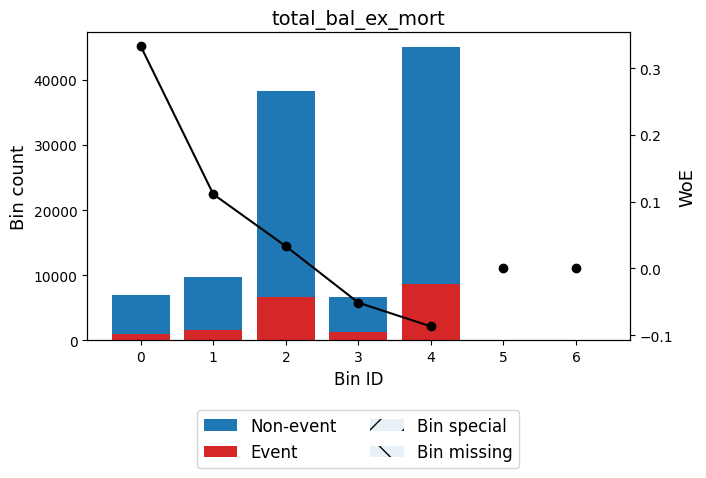


🔍 Feature: total_bc_limit
✅ Total IV for total_bc_limit: 0.0331
╒══════════════════════╤═════════╤════════════════════╤═══════════════════════╤═════════════╕
│ Bin                  │   Count │   Default Rate (%) │ WOE                   │          IV │
╞══════════════════════╪═════════╪════════════════════╪═══════════════════════╪═════════════╡
│ (-inf, 11386.50)     │   39850 │             0.2052 │ -0.1588845564616168   │ 0.00991424  │
├──────────────────────┼─────────┼────────────────────┼───────────────────────┼─────────────┤
│ [11386.50, 27550.00) │   41051 │             0.1803 │ 0.0012092997862986898 │ 5.62635e-07 │
├──────────────────────┼─────────┼────────────────────┼───────────────────────┼─────────────┤
│ [27550.00, 42405.00) │   13346 │             0.16   │ 0.14484751176924626   │ 0.00250497  │
├──────────────────────┼─────────┼────────────────────┼───────────────────────┼─────────────┤
│ [42405.00, 56100.50) │    5806 │             0.134  │ 0.3530272413148725    │ 0.0060402

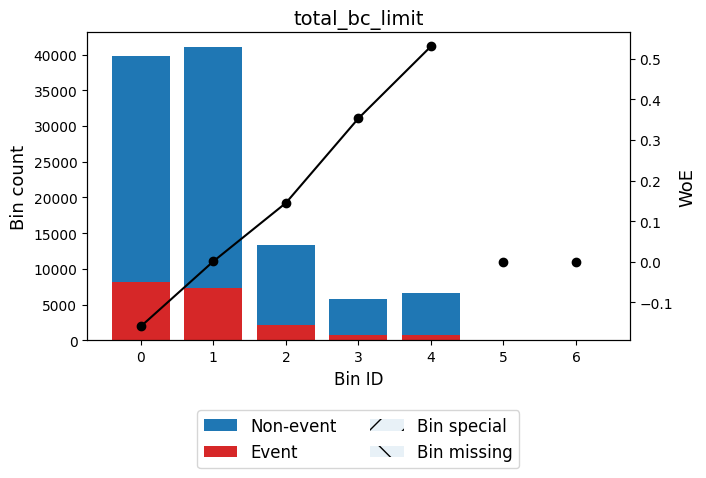


🔍 Feature: total_il_high_credit_limit
✅ Total IV for total_il_high_credit_limit: 0.0078
╒══════════════════════╤═════════╤════════════════════╤═══════════════════════╤═════════════╕
│ Bin                  │   Count │   Default Rate (%) │ WOE                   │          IV │
╞══════════════════════╪═════════╪════════════════════╪═══════════════════════╪═════════════╡
│ (-inf, 1745.00)      │   12570 │             0.1531 │ 0.1971405263888213    │ 0.00429577  │
├──────────────────────┼─────────┼────────────────────┼───────────────────────┼─────────────┤
│ [1745.00, 32086.50)  │   44947 │             0.1753 │ 0.03583709222457965   │ 0.00053503  │
├──────────────────────┼─────────┼────────────────────┼───────────────────────┼─────────────┤
│ [32086.50, 53306.00) │   22055 │             0.1899 │ -0.062291661274134213 │ 0.000818384 │
├──────────────────────┼─────────┼────────────────────┼───────────────────────┼─────────────┤
│ [53306.00, inf)      │   27087 │             0.1942 │ -0.090243

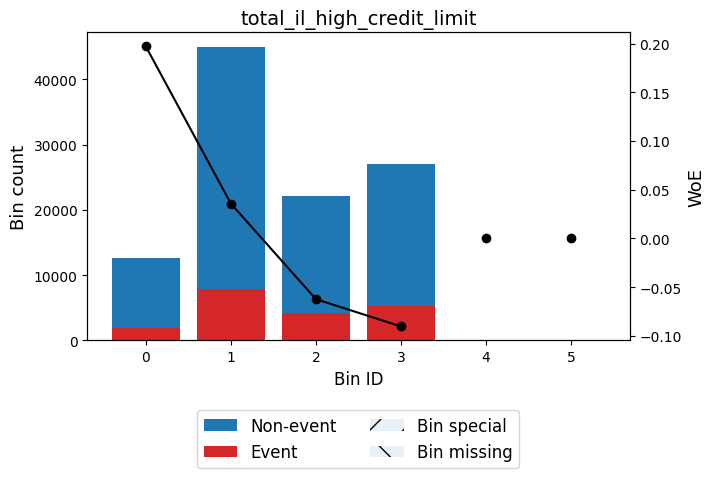


🔍 Feature: credit_history_years
✅ Total IV for credit_history_years: 0.0053
╒════════════════╤═════════╤════════════════════╤══════════════════════╤═════════════╕
│ Bin            │   Count │   Default Rate (%) │ WOE                  │          IV │
╞════════════════╪═════════╪════════════════════╪══════════════════════╪═════════════╡
│ (-inf, 9.50)   │   18259 │             0.1834 │ -0.0192877612353326  │ 6.40788e-05 │
├────────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [9.50, 10.50)  │    6398 │             0.2051 │ -0.15808482773884336 │ 0.00157538  │
├────────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [10.50, 13.50) │   22394 │             0.1917 │ -0.07433056540168326 │ 0.00118769  │
├────────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [13.50, 22.50) │   41773 │             0.1764 │ 0.02770225946104876  │ 0.000297902 │
├────────────────┼─────────┼────────────────────┼────

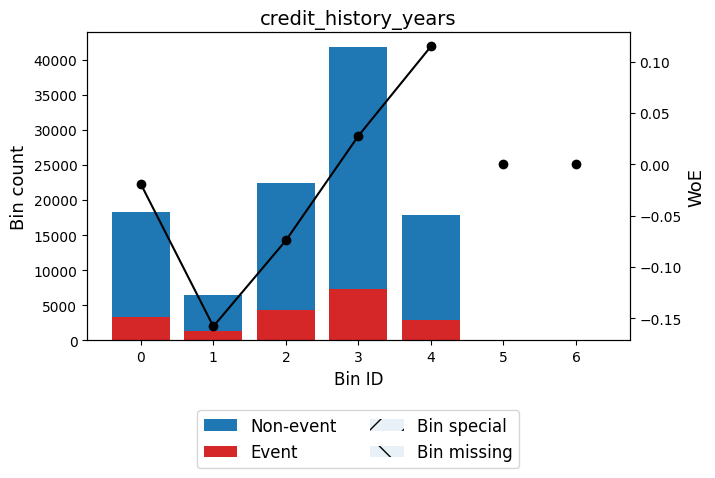


🔍 Feature: fico_score
✅ Total IV for fico_score: 0.1189
╒══════════════════╤═════════╤════════════════════╤══════════════════════╤═════════════╕
│ Bin              │   Count │   Default Rate (%) │ WOE                  │          IV │
╞══════════════════╪═════════╪════════════════════╪══════════════════════╪═════════════╡
│ (-inf, 684.50)   │   45181 │             0.2239 │ -0.2700660183241195  │ 0.0335903   │
├──────────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [684.50, 709.50) │   31806 │             0.1804 │ 0.000786639106898912 │ 1.84482e-07 │
├──────────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [709.50, 734.50) │   17118 │             0.1356 │ 0.3394025260112232   │ 0.0165362   │
├──────────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [734.50, 754.50) │    5853 │             0.1037 │ 0.6436685651504468   │ 0.0183359   │
├──────────────────┼─────────┼────────────────────┼──

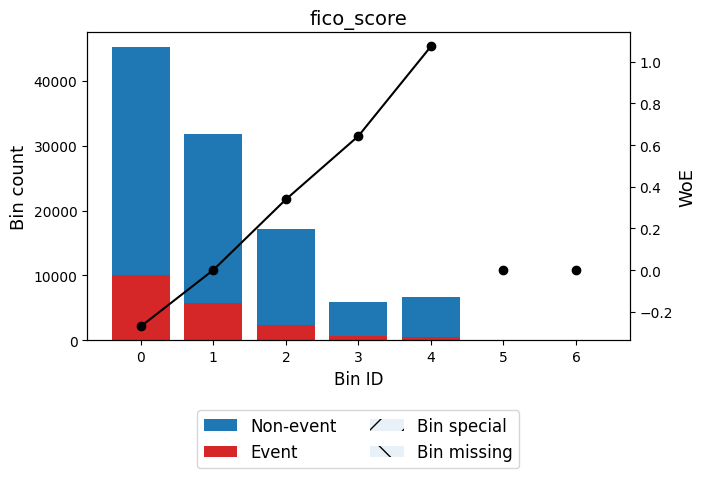


🔍 Feature: fico_score/delinq_2yrs_invalid
✅ Total IV for fico_score/delinq_2yrs_invalid: 0.0035
╒══════════════╤═════════╤════════════════════╤══════════════════════╤═════════════╕
│ Bin          │   Count │   Default Rate (%) │ WOE                  │          IV │
╞══════════════╪═════════╪════════════════════╪══════════════════════╪═════════════╡
│ (-inf, 0.50) │   20891 │             0.1985 │ -0.1173690003374197  │ 0.00279995  │
├──────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [0.50, inf)  │   85768 │             0.1761 │ 0.029952835822812274 │ 0.000714554 │
├──────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ Special      │       0 │             0      │ 0.0                  │ 0           │
├──────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ Missing      │       0 │             0      │ 0.0                  │ 0           │
├──────────────┼─────────┼────────────────────┼──────

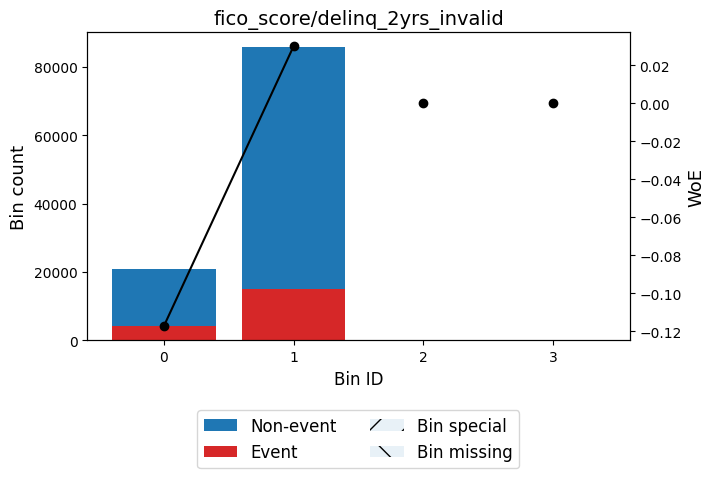


🔍 Feature: fico_score/delinq_2yrs
✅ Total IV for fico_score/delinq_2yrs: 0.0104
╒══════════════════╤═════════╤════════════════════╤══════════════════════╤════════════╕
│ Bin              │   Count │   Default Rate (%) │ WOE                  │         IV │
╞══════════════════╪═════════╪════════════════════╪══════════════════════╪════════════╡
│ (-inf, 66.45)    │   85825 │             0.1761 │ 0.030277133970940895 │ 0.00073052 │
├──────────────────┼─────────┼────────────────────┼──────────────────────┼────────────┤
│ [66.45, 524.00)  │    7021 │             0.2101 │ -0.18860484681507095 │ 0.00248389 │
├──────────────────┼─────────┼────────────────────┼──────────────────────┼────────────┤
│ [524.00, 684.50) │    7762 │             0.2225 │ -0.2618337488319207  │ 0.00541095 │
├──────────────────┼─────────┼────────────────────┼──────────────────────┼────────────┤
│ [684.50, inf)    │    6051 │             0.1552 │ 0.18150671263223384  │ 0.00176201 │
├──────────────────┼─────────┼─────────

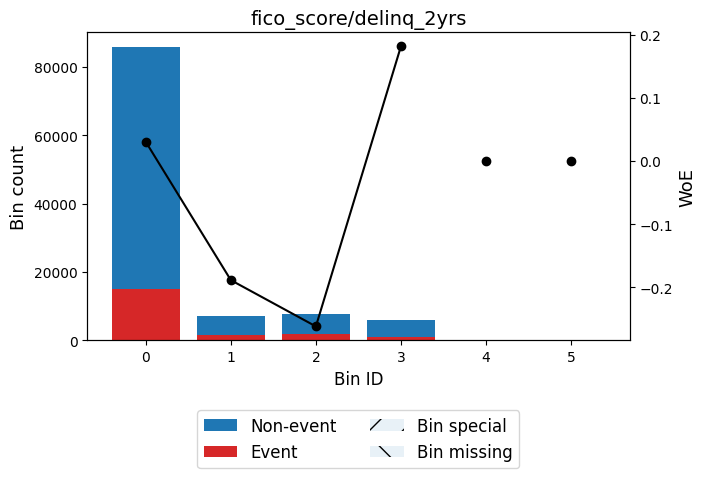


🔍 Feature: fico_score/acc_now_delinq_invalid
✅ Total IV for fico_score/acc_now_delinq_invalid: 0.0000
╒═════════════╤═════════╤════════════════════╤════════════════════════╤══════╕
│ Bin         │   Count │   Default Rate (%) │ WOE                    │   IV │
╞═════════════╪═════════╪════════════════════╪════════════════════════╪══════╡
│ (-inf, inf) │  106659 │             0.1805 │ -2.220446049250313e-16 │    0 │
├─────────────┼─────────┼────────────────────┼────────────────────────┼──────┤
│ Special     │       0 │             0      │ 0.0                    │    0 │
├─────────────┼─────────┼────────────────────┼────────────────────────┼──────┤
│ Missing     │       0 │             0      │ 0.0                    │    0 │
├─────────────┼─────────┼────────────────────┼────────────────────────┼──────┤
│             │  106659 │             0.1805 │                        │    0 │
╘═════════════╧═════════╧════════════════════╧════════════════════════╧══════╛


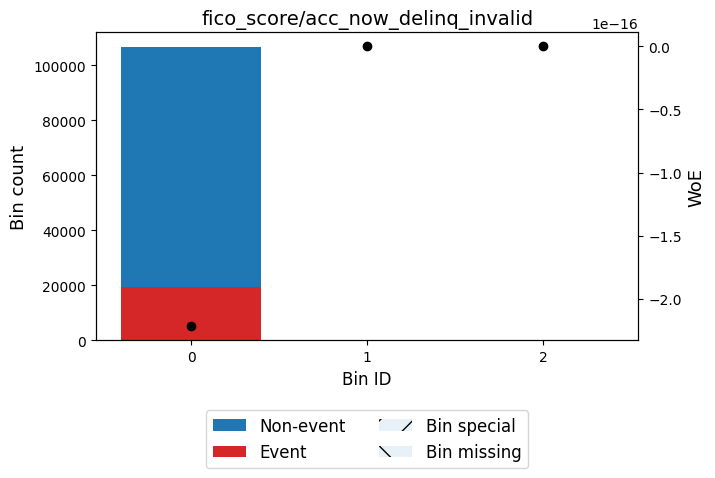


🔍 Feature: fico_score/acc_now_delinq
✅ Total IV for fico_score/acc_now_delinq: 0.0000
╒═════════════╤═════════╤════════════════════╤════════════════════════╤══════╕
│ Bin         │   Count │   Default Rate (%) │ WOE                    │   IV │
╞═════════════╪═════════╪════════════════════╪════════════════════════╪══════╡
│ (-inf, inf) │  106659 │             0.1805 │ -2.220446049250313e-16 │    0 │
├─────────────┼─────────┼────────────────────┼────────────────────────┼──────┤
│ Special     │       0 │             0      │ 0.0                    │    0 │
├─────────────┼─────────┼────────────────────┼────────────────────────┼──────┤
│ Missing     │       0 │             0      │ 0.0                    │    0 │
├─────────────┼─────────┼────────────────────┼────────────────────────┼──────┤
│             │  106659 │             0.1805 │                        │    0 │
╘═════════════╧═════════╧════════════════════╧════════════════════════╧══════╛


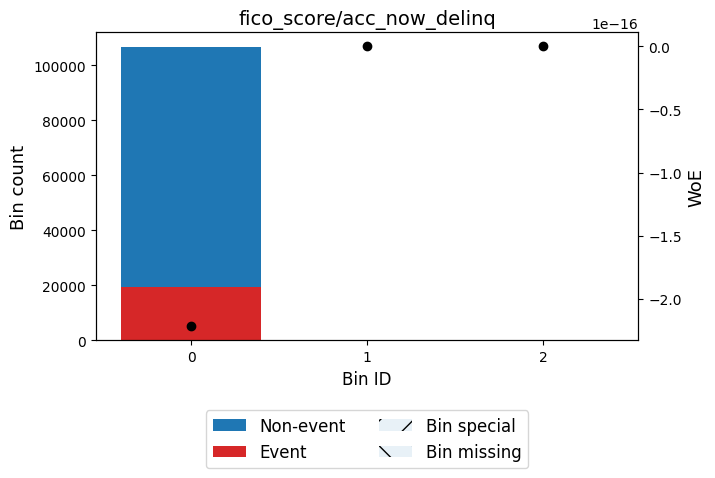


🔍 Feature: fico_score/inq_last_6mths_invalid
✅ Total IV for fico_score/inq_last_6mths_invalid: 0.0221
╒══════════════╤═════════╤════════════════════╤══════════════════════╤═══════════╕
│ Bin          │   Count │   Default Rate (%) │ WOE                  │        IV │
╞══════════════╪═════════╪════════════════════╪══════════════════════╪═══════════╡
│ (-inf, 0.50) │   46109 │             0.2058 │ -0.16242980011647123 │ 0.0120021 │
├──────────────┼─────────┼────────────────────┼──────────────────────┼───────────┤
│ [0.50, inf)  │   60550 │             0.1612 │ 0.13601688186281402  │ 0.0100505 │
├──────────────┼─────────┼────────────────────┼──────────────────────┼───────────┤
│ Special      │       0 │             0      │ 0.0                  │ 0         │
├──────────────┼─────────┼────────────────────┼──────────────────────┼───────────┤
│ Missing      │       0 │             0      │ 0.0                  │ 0         │
├──────────────┼─────────┼────────────────────┼────────────────────

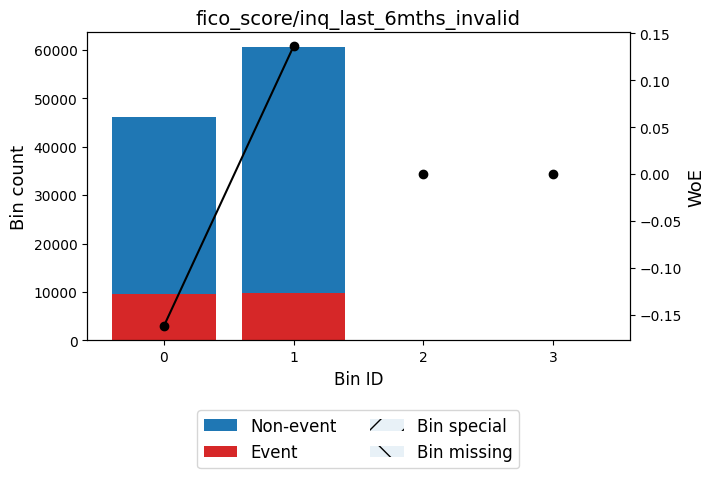


🔍 Feature: fico_score/inq_last_6mths
✅ Total IV for fico_score/inq_last_6mths: 0.0539
╒══════════════════╤═════════╤════════════════════╤══════════════════════╤═════════════╕
│ Bin              │   Count │   Default Rate (%) │ WOE                  │          IV │
╞══════════════════╪═════════╪════════════════════╪══════════════════════╪═════════════╡
│ (-inf, 111.58)   │   60568 │             0.1612 │ 0.13612703941334536  │ 0.0100694   │
├──────────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [111.58, 342.25) │   11403 │             0.2474 │ -0.40044824966740045 │ 0.0193635   │
├──────────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [342.25, 684.50) │   18736 │             0.2184 │ -0.23802695704826426 │ 0.010717    │
├──────────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [684.50, 709.50) │    8695 │             0.1952 │ -0.0962613965234671  │ 0.000778749 │
├──────────────────┼───

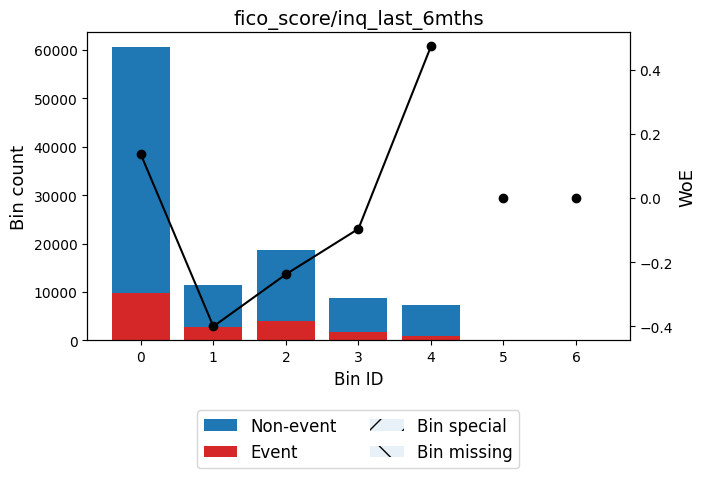


🔍 Feature: delinq_2yrs/credit_history_invalid
⚠️ Not enough variation. Skipping.

🔍 Feature: delinq_2yrs/credit_history
✅ Total IV for delinq_2yrs/credit_history: 0.0054
╒══════════════╤═════════╤════════════════════╤═══════════════════════╤═════════════╕
│ Bin          │   Count │   Default Rate (%) │ WOE                   │          IV │
╞══════════════╪═════════╪════════════════════╪═══════════════════════╪═════════════╡
│ (-inf, 0.04) │   88600 │             0.176  │ 0.030865092309035225  │ 0.000783566 │
├──────────────┼─────────┼────────────────────┼───────────────────────┼─────────────┤
│ [0.04, 0.08) │    6545 │             0.1899 │ -0.062467508878614186 │ 0.000244249 │
├──────────────┼─────────┼────────────────────┼───────────────────────┼─────────────┤
│ [0.08, 0.12) │    5676 │             0.2003 │ -0.12871029551094448  │ 0.000918088 │
├──────────────┼─────────┼────────────────────┼───────────────────────┼─────────────┤
│ [0.12, inf)  │    5838 │             0.2193 │ -0.2429

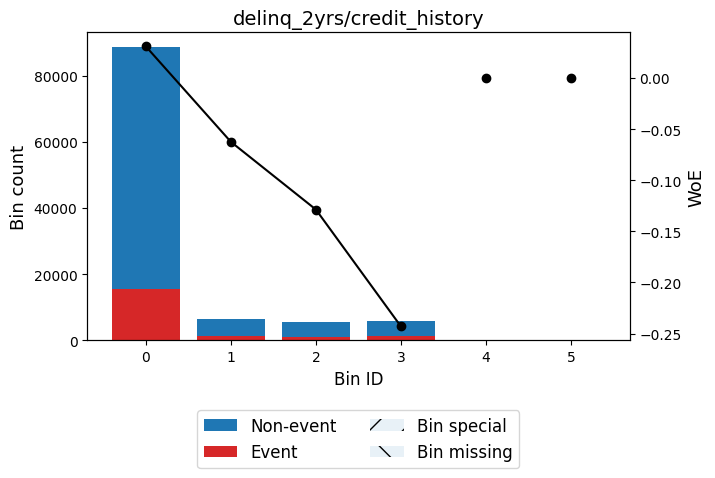


🔍 Feature: late_pymt_hist_invalid
⚠️ Not enough variation. Skipping.

🔍 Feature: late_pymt_hist
✅ Total IV for late_pymt_hist: 0.0076
╒══════════════╤═════════╤════════════════════╤══════════════════════╤════════════╕
│ Bin          │   Count │   Default Rate (%) │ WOE                  │         IV │
╞══════════════╪═════════╪════════════════════╪══════════════════════╪════════════╡
│ (-inf, 0.04) │   84489 │             0.1739 │ 0.045428888615475005 │ 0.00161115 │
├──────────────┼─────────┼────────────────────┼──────────────────────┼────────────┤
│ [0.04, 0.08) │    8114 │             0.1999 │ -0.1261131102577504  │ 0.00125899 │
├──────────────┼─────────┼────────────────────┼──────────────────────┼────────────┤
│ [0.08, 0.16) │    7825 │             0.2058 │ -0.16229225825057125 │ 0.00203331 │
├──────────────┼─────────┼────────────────────┼──────────────────────┼────────────┤
│ [0.16, inf)  │    6231 │             0.2133 │ -0.2078072988420614  │ 0.00269184 │
├──────────────┼─────────

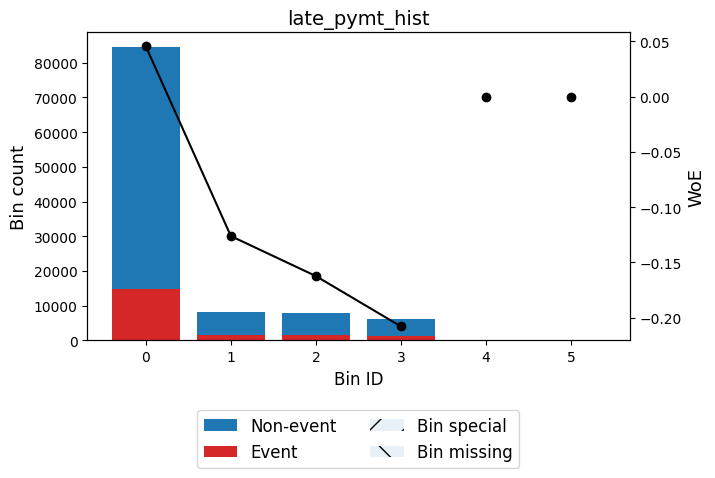


🔍 Feature: loan_amnt/annual_inc_invalid
⚠️ Not enough variation. Skipping.

🔍 Feature: loan_amnt/annual_inc
✅ Total IV for loan_amnt/annual_inc: 0.1305
╒══════════════╤═════════╤════════════════════╤═════════════════════╤════════════╕
│ Bin          │   Count │   Default Rate (%) │ WOE                 │         IV │
╞══════════════╪═════════╪════════════════════╪═════════════════════╪════════════╡
│ (-inf, 0.14) │   32639 │             0.1225 │ 0.45573620801088954 │ 0.0546561  │
├──────────────┼─────────┼────────────────────┼─────────────────────┼────────────┤
│ [0.14, 0.23) │   29957 │             0.161  │ 0.13780156588924397 │ 0.00510081 │
├──────────────┼─────────┼────────────────────┼─────────────────────┼────────────┤
│ [0.23, 0.30) │   18094 │             0.1996 │ -0.1243789408049838 │ 0.00272935 │
├──────────────┼─────────┼────────────────────┼─────────────────────┼────────────┤
│ [0.30, 0.35) │   10415 │             0.2376 │ -0.3473509249784834 │ 0.0131043  │
├──────────────┼─

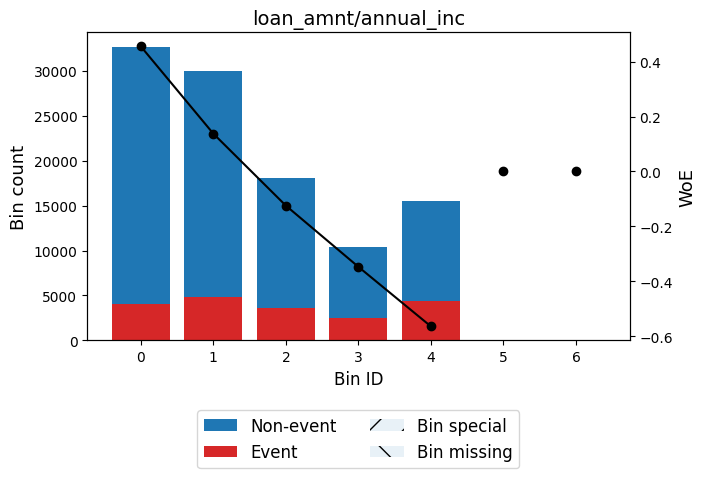


🔍 Feature: revol_util/annual_inc_invalid
⚠️ Not enough variation. Skipping.

🔍 Feature: revol_util/annual_inc
✅ Total IV for revol_util/annual_inc: 0.0439
╒══════════════╤═════════╤════════════════════╤══════════════════════╤═════════════╕
│ Bin          │   Count │   Default Rate (%) │ WOE                  │          IV │
╞══════════════╪═════════╪════════════════════╪══════════════════════╪═════════════╡
│ (-inf, 0.00) │    7994 │             0.1208 │ 0.4714698108775959   │ 0.0142503   │
├──────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [0.00, 0.00) │   25846 │             0.1494 │ 0.2261059278167421   │ 0.0115082   │
├──────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [0.00, 0.00) │   28880 │             0.1789 │ 0.01047167841650154  │ 2.95922e-05 │
├──────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [0.00, 0.00) │   23924 │             0.2004 │ -0.12913115677690512 │ 0.003895

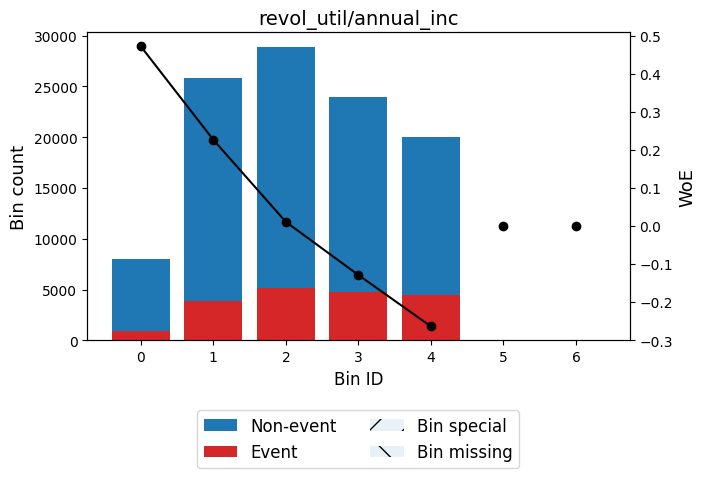


🔍 Feature: acc_op_past_24mths/total_acc_invalid
⚠️ Not enough variation. Skipping.

🔍 Feature: acc_op_past_24mths/total_acc
✅ Total IV for acc_op_past_24mths/total_acc: 0.0714
╒══════════════╤═════════╤════════════════════╤══════════════════════╤════════════╕
│ Bin          │   Count │   Default Rate (%) │ WOE                  │         IV │
╞══════════════╪═════════╪════════════════════╪══════════════════════╪════════════╡
│ (-inf, 0.08) │   16730 │             0.1247 │ 0.4352109732611824   │ 0.0257274  │
├──────────────┼─────────┼────────────────────┼──────────────────────┼────────────┤
│ [0.08, 0.13) │   19325 │             0.1471 │ 0.24479771285743612  │ 0.0100237  │
├──────────────┼─────────┼────────────────────┼──────────────────────┼────────────┤
│ [0.13, 0.18) │   21358 │             0.1673 │ 0.09192602214227175  │ 0.00164275 │
├──────────────┼─────────┼────────────────────┼──────────────────────┼────────────┤
│ [0.18, 0.29) │   27603 │             0.2016 │ -0.1369776084529534

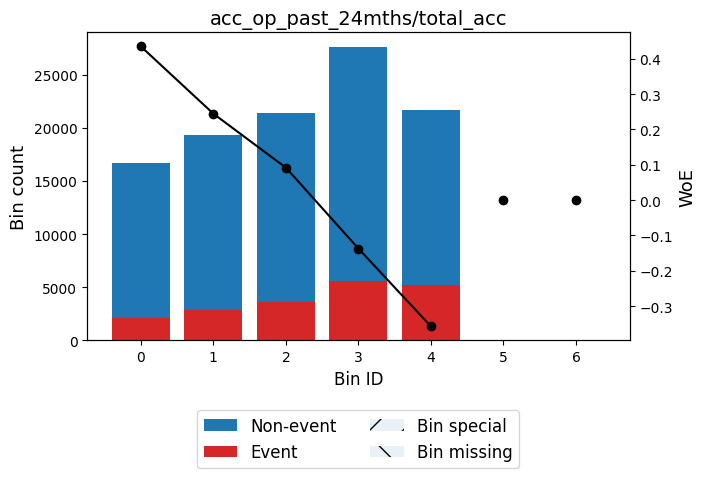


🔍 Feature: bc_open_to_buy/annual_inc_invalid
⚠️ Not enough variation. Skipping.

🔍 Feature: bc_open_to_buy/annual_inc
✅ Total IV for bc_open_to_buy/annual_inc: 0.0277
╒══════════════╤═════════╤════════════════════╤═══════════════════════╤═════════════╕
│ Bin          │   Count │   Default Rate (%) │ WOE                   │          IV │
╞══════════════╪═════════╪════════════════════╪═══════════════════════╪═════════════╡
│ (-inf, 0.00) │    5965 │             0.2334 │ -0.32359592145318383  │ 0.0064687   │
├──────────────┼─────────┼────────────────────┼───────────────────────┼─────────────┤
│ [0.00, 0.02) │   21545 │             0.2055 │ -0.1606154165074598   │ 0.0054805   │
├──────────────┼─────────┼────────────────────┼───────────────────────┼─────────────┤
│ [0.02, 0.14) │   47075 │             0.1812 │ -0.004643592276986519 │ 9.53114e-06 │
├──────────────┼─────────┼────────────────────┼───────────────────────┼─────────────┤
│ [0.14, 0.43) │   24606 │             0.1616 │ 0.13344623

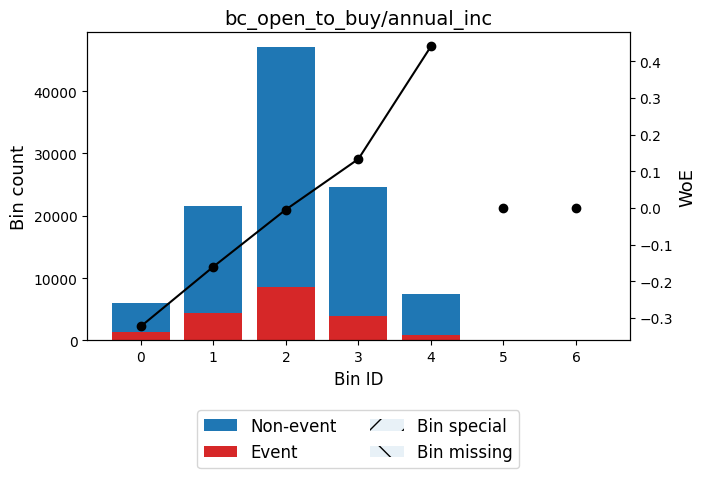


🔍 Feature: inq_last6mths_x_tl_op_past_12m
✅ Total IV for inq_last6mths_x_tl_op_past_12m: 0.0412
╒══════════════╤═════════╤════════════════════╤══════════════════════╤═════════════╕
│ Bin          │   Count │   Default Rate (%) │ WOE                  │          IV │
╞══════════════╪═════════╪════════════════════╪══════════════════════╪═════════════╡
│ (-inf, 1.50) │   70403 │             0.1619 │ 0.13084646656781307  │ 0.0108327   │
├──────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [1.50, 2.50) │   10086 │             0.1824 │ -0.01306114155305993 │ 1.61992e-05 │
├──────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [2.50, 4.50) │   12518 │             0.206  │ -0.16395911913021322 │ 0.00332164  │
├──────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [4.50, 6.50) │    5640 │             0.231  │ -0.31051023750635265 │ 0.00560996  │
├──────────────┼─────────┼────────────────────┼──────

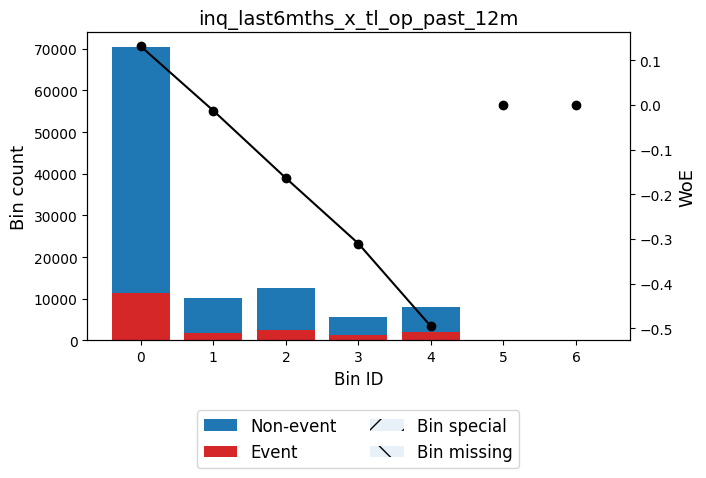


🔍 Feature: dti_x_revol_util
✅ Total IV for dti_x_revol_util: 0.0784
╒════════════════════╤═════════╤════════════════════╤══════════════════════╤═════════════╕
│ Bin                │   Count │   Default Rate (%) │ WOE                  │          IV │
╞════════════════════╪═════════╪════════════════════╪══════════════════════╪═════════════╡
│ (-inf, 365.40)     │   19924 │             0.1239 │ 0.44278912597708286  │ 0.031634    │
├────────────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [365.40, 656.57)   │   19099 │             0.1486 │ 0.23264621988886036  │ 0.00898356  │
├────────────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [656.57, 1071.17)  │   25038 │             0.1758 │ 0.03222998916615838  │ 0.000241344 │
├────────────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [1071.17, 1663.67) │   24483 │             0.2069 │ -0.1694263847840407  │ 0.00694869  │
├────────────────────

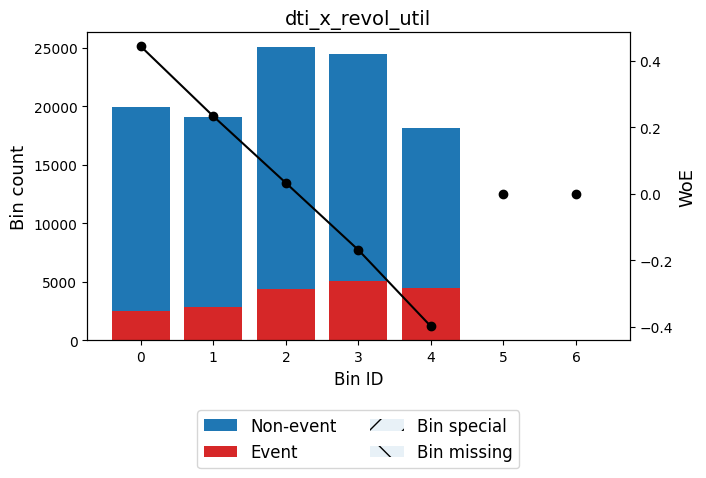


🔍 Feature: avail_ratio
✅ Total IV for avail_ratio: 0.0268
╒══════════════════╤═════════╤════════════════════╤══════════════════════╤═════════════╕
│ Bin              │   Count │   Default Rate (%) │ WOE                  │          IV │
╞══════════════════╪═════════╪════════════════════╪══════════════════════╪═════════════╡
│ (-inf, -93.95)   │   11150 │             0.2303 │ -0.30648420347525573 │ 0.0107921   │
├──────────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [-93.95, -72.75) │   29329 │             0.1973 │ -0.11006703117266547 │ 0.00344912  │
├──────────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [-72.75, -41.95) │   39001 │             0.1745 │ 0.041160780911184025 │ 0.000611379 │
├──────────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [-41.95, -30.75) │    9757 │             0.1596 │ 0.1483494572014723   │ 0.00191875  │
├──────────────────┼─────────┼────────────────────┼

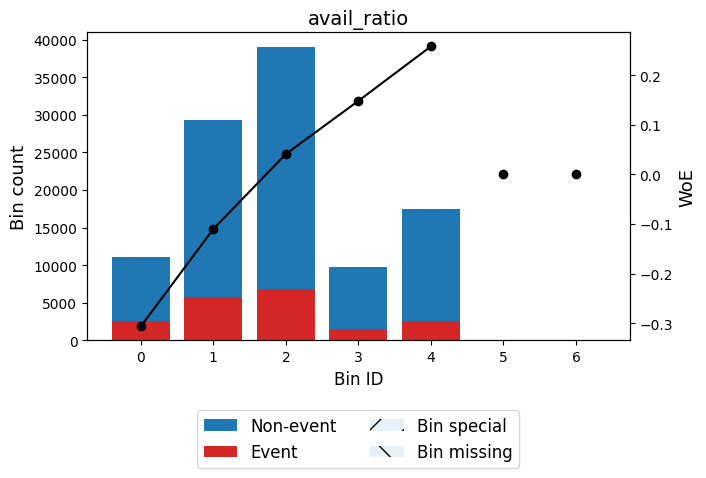


🔍 Feature: delinq2yrs_flag
✅ Total IV for delinq2yrs_flag: 0.0035
╒══════════════╤═════════╤════════════════════╤══════════════════════╤═════════════╕
│ Bin          │   Count │   Default Rate (%) │ WOE                  │          IV │
╞══════════════╪═════════╪════════════════════╪══════════════════════╪═════════════╡
│ (-inf, 0.50) │   85768 │             0.1761 │ 0.029952835822812274 │ 0.000714554 │
├──────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [0.50, inf)  │   20891 │             0.1985 │ -0.1173690003374197  │ 0.00279995  │
├──────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ Special      │       0 │             0      │ 0.0                  │ 0           │
├──────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ Missing      │       0 │             0      │ 0.0                  │ 0           │
├──────────────┼─────────┼────────────────────┼──────────────────────┼─────────────

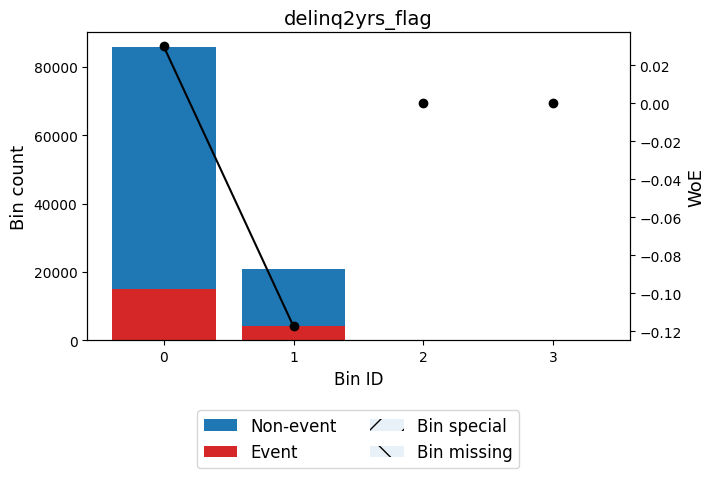


🔍 Feature: pubrec_flag
✅ Total IV for pubrec_flag: 0.0068
╒══════════════╤═════════╤════════════════════╤══════════════════════╤════════════╕
│ Bin          │   Count │   Default Rate (%) │ WOE                  │         IV │
╞══════════════╪═════════╪════════════════════╪══════════════════════╪════════════╡
│ (-inf, 0.50) │   89073 │             0.1749 │ 0.03802274361617042  │ 0.00119272 │
├──────────────┼─────────┼────────────────────┼──────────────────────┼────────────┤
│ [0.50, inf)  │   17586 │             0.2086 │ -0.17983183515230272 │ 0.00564108 │
├──────────────┼─────────┼────────────────────┼──────────────────────┼────────────┤
│ Special      │       0 │             0      │ 0.0                  │ 0          │
├──────────────┼─────────┼────────────────────┼──────────────────────┼────────────┤
│ Missing      │       0 │             0      │ 0.0                  │ 0          │
├──────────────┼─────────┼────────────────────┼──────────────────────┼────────────┤
│              │ 

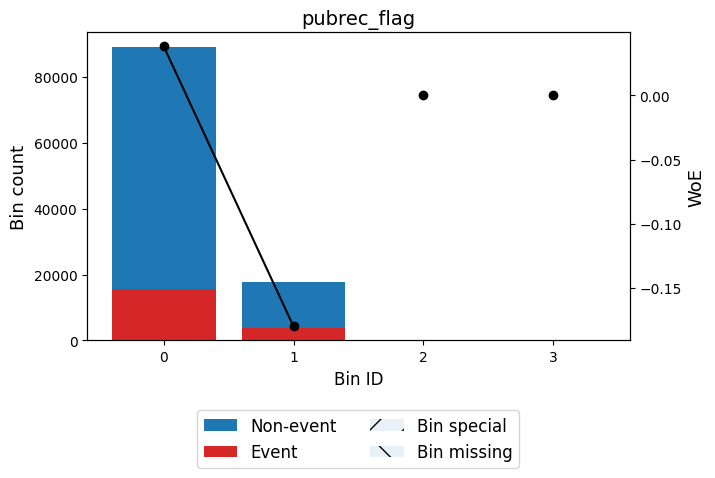


🔍 Feature: acc_now_delinq_flag
✅ Total IV for acc_now_delinq_flag: 0.0000
╒═════════════╤═════════╤════════════════════╤════════════════════════╤══════╕
│ Bin         │   Count │   Default Rate (%) │ WOE                    │   IV │
╞═════════════╪═════════╪════════════════════╪════════════════════════╪══════╡
│ (-inf, inf) │  106659 │             0.1805 │ -2.220446049250313e-16 │    0 │
├─────────────┼─────────┼────────────────────┼────────────────────────┼──────┤
│ Special     │       0 │             0      │ 0.0                    │    0 │
├─────────────┼─────────┼────────────────────┼────────────────────────┼──────┤
│ Missing     │       0 │             0      │ 0.0                    │    0 │
├─────────────┼─────────┼────────────────────┼────────────────────────┼──────┤
│             │  106659 │             0.1805 │                        │    0 │
╘═════════════╧═════════╧════════════════════╧════════════════════════╧══════╛


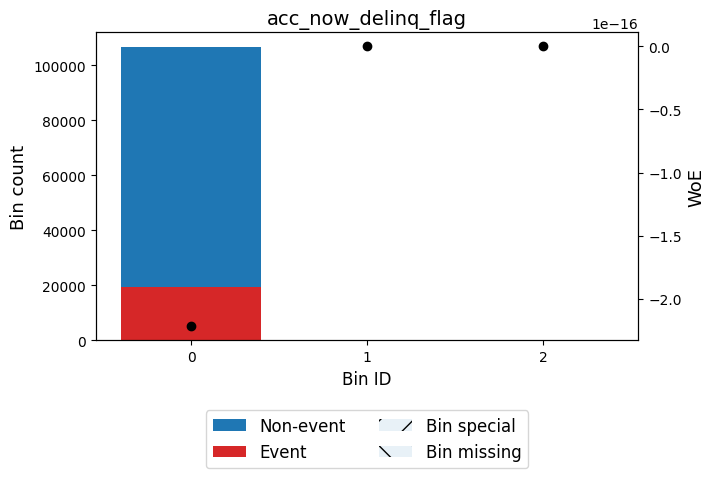


🔍 Feature: tl_op12m_x_inq6m
✅ Total IV for tl_op12m_x_inq6m: 0.0412
╒══════════════╤═════════╤════════════════════╤══════════════════════╤═════════════╕
│ Bin          │   Count │   Default Rate (%) │ WOE                  │          IV │
╞══════════════╪═════════╪════════════════════╪══════════════════════╪═════════════╡
│ (-inf, 1.50) │   70403 │             0.1619 │ 0.13084646656781307  │ 0.0108327   │
├──────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [1.50, 2.50) │   10086 │             0.1824 │ -0.01306114155305993 │ 1.61992e-05 │
├──────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [2.50, 4.50) │   12518 │             0.206  │ -0.16395911913021322 │ 0.00332164  │
├──────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [4.50, 6.50) │    5640 │             0.231  │ -0.31051023750635265 │ 0.00560996  │
├──────────────┼─────────┼────────────────────┼──────────────────────┼───────────

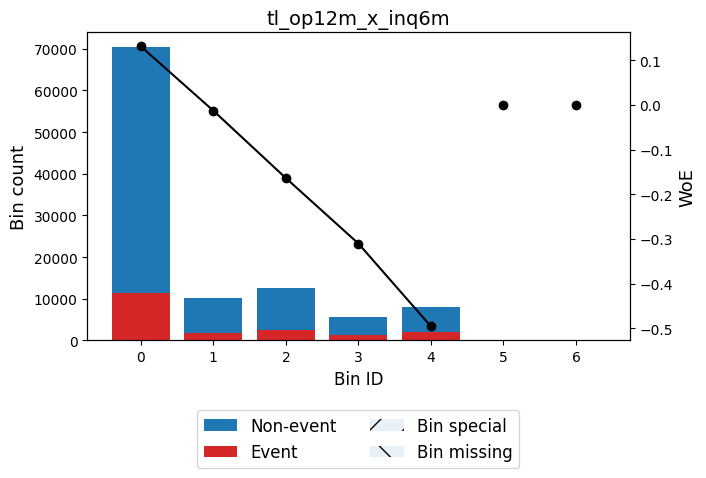


🔍 Feature: dti_x_inq
✅ Total IV for dti_x_inq: 0.0595
╒════════════════╤═════════╤════════════════════╤══════════════════════╤═════════════╕
│ Bin            │   Count │   Default Rate (%) │ WOE                  │          IV │
╞════════════════╪═════════╪════════════════════╪══════════════════════╪═════════════╡
│ (-inf, 15.91)  │   74280 │             0.159  │ 0.15271600707933364  │ 0.0154579   │
├────────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [15.91, 24.38) │   11708 │             0.1916 │ -0.07323727509365918 │ 0.000602607 │
├────────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [24.38, 29.66) │    5680 │             0.225  │ -0.27626117706794706 │ 0.00442699  │
├────────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [29.66, 52.66) │    9650 │             0.2438 │ -0.38125160917861645 │ 0.0147717   │
├────────────────┼─────────┼────────────────────┼──────────────────────┼───

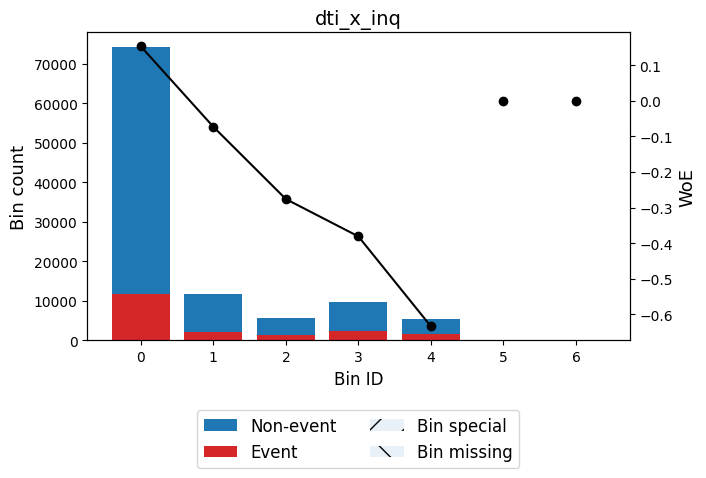


🔍 Feature: dti_x_term
✅ Total IV for dti_x_term: 0.2185
╒════════════════════╤═════════╤════════════════════╤═════════════════════╤════════════╕
│ Bin                │   Count │   Default Rate (%) │ WOE                 │         IV │
╞════════════════════╪═════════╪════════════════════╪═════════════════════╪════════════╡
│ (-inf, 532.98)     │   34540 │             0.1162 │ 0.5157667249019098  │ 0.0725824  │
├────────────────────┼─────────┼────────────────────┼─────────────────────┼────────────┤
│ [532.98, 853.68)   │   33702 │             0.1571 │ 0.16662476760735534 │ 0.00831109 │
├────────────────────┼─────────┼────────────────────┼─────────────────────┼────────────┤
│ [853.68, 1232.82)  │   24861 │             0.214  │ -0.2122214132164697 │ 0.0112163  │
├────────────────────┼─────────┼────────────────────┼─────────────────────┼────────────┤
│ [1232.82, 1461.42) │    6254 │             0.2859 │ -0.5976283275502303 │ 0.0249716  │
├────────────────────┼─────────┼────────────────────┼

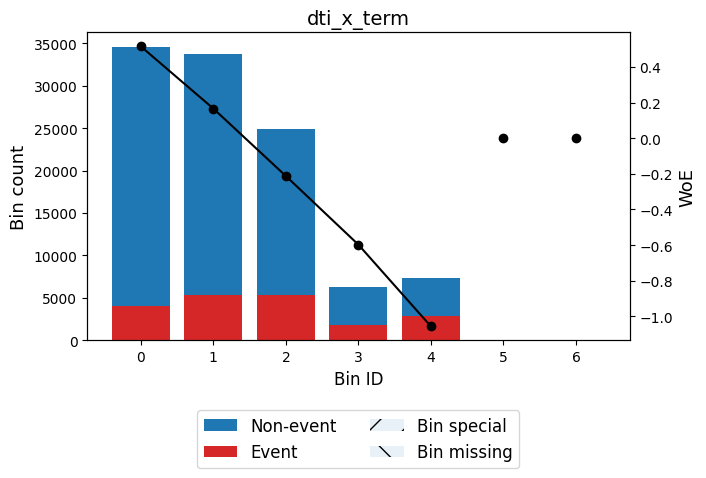


🔍 Feature: term_x_revol_util
✅ Total IV for term_x_revol_util: 0.1251
╒════════════════════╤═════════╤════════════════════╤══════════════════════╤═════════════╕
│ Bin                │   Count │   Default Rate (%) │ WOE                  │          IV │
╞════════════════════╪═════════╪════════════════════╪══════════════════════╪═════════════╡
│ (-inf, 868.80)     │   12615 │             0.1239 │ 0.4429805514049565   │ 0.0200453   │
├────────────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [868.80, 2038.80)  │   37686 │             0.1492 │ 0.2280226287611855   │ 0.0170549   │
├────────────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [2038.80, 3107.40) │   34496 │             0.1765 │ 0.027127924826161776 │ 0.000235955 │
├────────────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [3107.40, 3609.00) │   10121 │             0.2148 │ -0.2167980939578491  │ 0.00477189  │
├──────────────────

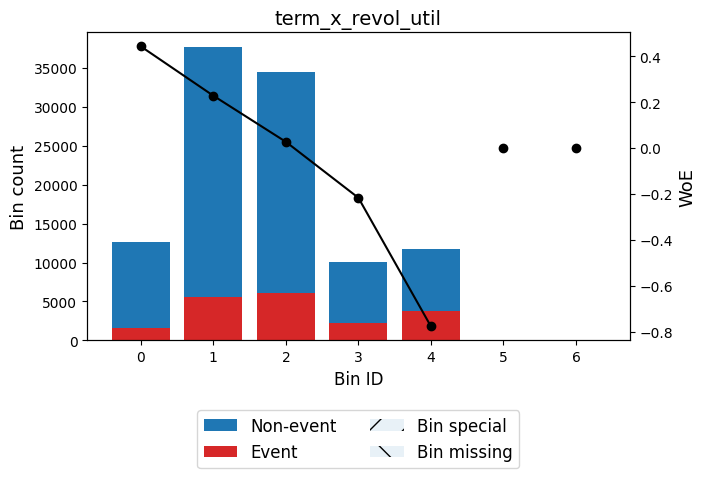


🔍 Feature: dti/fico_ratio_invalid
⚠️ Not enough variation. Skipping.

🔍 Feature: dti/fico_ratio
✅ Total IV for dti/fico_ratio: 0.1056
╒══════════════╤═════════╤════════════════════╤══════════════════════╤════════════╕
│ Bin          │   Count │   Default Rate (%) │ WOE                  │         IV │
╞══════════════╪═════════╪════════════════════╪══════════════════════╪════════════╡
│ (-inf, 0.02) │   25642 │             0.1235 │ 0.4462348073166571   │ 0.0413004  │
├──────────────┼─────────┼────────────────────┼──────────────────────┼────────────┤
│ [0.02, 0.03) │   34492 │             0.16   │ 0.14492818182720169  │ 0.006481   │
├──────────────┼─────────┼────────────────────┼──────────────────────┼────────────┤
│ [0.03, 0.04) │   24426 │             0.1976 │ -0.11177041636850693 │ 0.00296369 │
├──────────────┼─────────┼────────────────────┼──────────────────────┼────────────┤
│ [0.04, 0.05) │   15765 │             0.245  │ -0.387761434678358   │ 0.0250102  │
├──────────────┼─────────

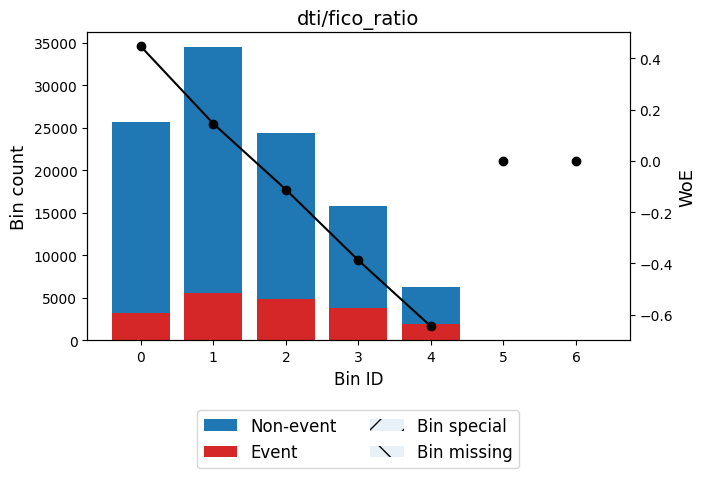


🔍 Feature: loan_amnt/tot_hi_cred_lim_invalid
⚠️ Not enough variation. Skipping.

🔍 Feature: loan_amnt/tot_hi_cred_lim
✅ Total IV for loan_amnt/tot_hi_cred_lim: 0.0763
╒══════════════╤═════════╤════════════════════╤══════════════════════╤════════════╕
│ Bin          │   Count │   Default Rate (%) │ WOE                  │         IV │
╞══════════════╪═════════╪════════════════════╪══════════════════════╪════════════╡
│ (-inf, 0.03) │   11744 │             0.1105 │ 0.5723707075153346   │ 0.029811   │
├──────────────┼─────────┼────────────────────┼──────────────────────┼────────────┤
│ [0.03, 0.07) │   26050 │             0.1427 │ 0.27981093393198764  │ 0.0174486  │
├──────────────┼─────────┼────────────────────┼──────────────────────┼────────────┤
│ [0.07, 0.10) │   13000 │             0.1775 │ 0.020090645413945563 │ 4.8881e-05 │
├──────────────┼─────────┼────────────────────┼──────────────────────┼────────────┤
│ [0.10, 0.21) │   26715 │             0.1976 │ -0.11192480188510379 │ 0.003

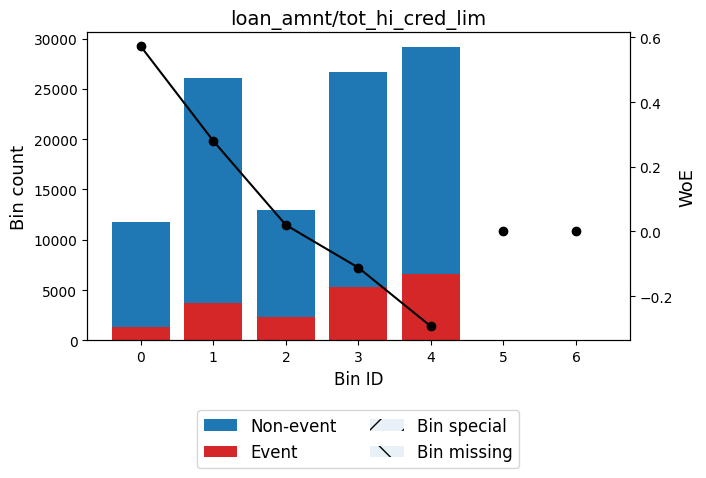


🔍 Feature: bc_open_to_buy/total_rev_hi_lim_invalid
✅ Total IV for bc_open_to_buy/total_rev_hi_lim_invalid: 0.0000
╒═════════════╤═════════╤════════════════════╤════════════════════════╤══════╕
│ Bin         │   Count │   Default Rate (%) │ WOE                    │   IV │
╞═════════════╪═════════╪════════════════════╪════════════════════════╪══════╡
│ (-inf, inf) │  106659 │             0.1805 │ -2.220446049250313e-16 │    0 │
├─────────────┼─────────┼────────────────────┼────────────────────────┼──────┤
│ Special     │       0 │             0      │ 0.0                    │    0 │
├─────────────┼─────────┼────────────────────┼────────────────────────┼──────┤
│ Missing     │       0 │             0      │ 0.0                    │    0 │
├─────────────┼─────────┼────────────────────┼────────────────────────┼──────┤
│             │  106659 │             0.1805 │                        │    0 │
╘═════════════╧═════════╧════════════════════╧════════════════════════╧══════╛


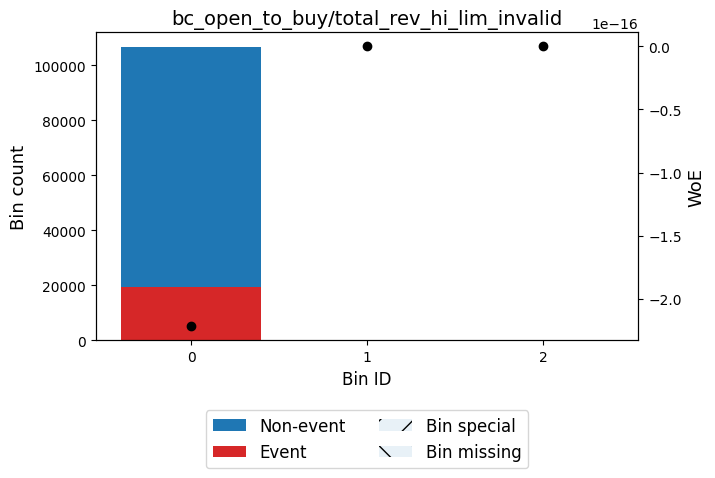


🔍 Feature: bc_open_to_buy/total_rev_hi_lim
✅ Total IV for bc_open_to_buy/total_rev_hi_lim: 0.0397
╒══════════════╤═════════╤════════════════════╤══════════════════════╤════════════╕
│ Bin          │   Count │   Default Rate (%) │ WOE                  │         IV │
╞══════════════╪═════════╪════════════════════╪══════════════════════╪════════════╡
│ (-inf, 0.03) │   12770 │             0.2312 │ -0.31172983026827517 │ 0.0128066  │
├──────────────┼─────────┼────────────────────┼──────────────────────┼────────────┤
│ [0.03, 0.19) │   35799 │             0.1975 │ -0.11115345991519598 │ 0.00429497 │
├──────────────┼─────────┼────────────────────┼──────────────────────┼────────────┤
│ [0.19, 0.52) │   42668 │             0.1694 │ 0.07702152552536745  │ 0.00231506 │
├──────────────┼─────────┼────────────────────┼──────────────────────┼────────────┤
│ [0.52, 0.71) │    9966 │             0.1367 │ 0.33024919946128906  │ 0.00914307 │
├──────────────┼─────────┼────────────────────┼──────────────

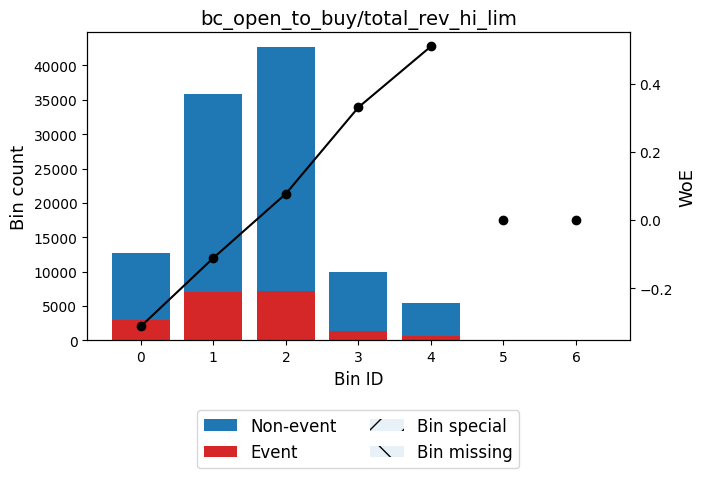


🔍 Feature: fico_score/int_rate_invalid
⚠️ Not enough variation. Skipping.

🔍 Feature: fico_score/int_rate
✅ Total IV for fico_score/int_rate: 0.4392
╒═════════════════╤═════════╤════════════════════╤══════════════════════╤═══════════╕
│ Bin             │   Count │   Default Rate (%) │ WOE                  │        IV │
╞═════════════════╪═════════╪════════════════════╪══════════════════════╪═══════════╡
│ (-inf, 38.54)   │   16835 │             0.3499 │ -0.8933970709055429  │ 0.161473  │
├─────────────────┼─────────┼────────────────────┼──────────────────────┼───────────┤
│ [38.54, 54.17)  │   36025 │             0.216  │ -0.22399153950182749 │ 0.0181706 │
├─────────────────┼─────────┼────────────────────┼──────────────────────┼───────────┤
│ [54.17, 75.39)  │   28721 │             0.1375 │ 0.3229342309734968   │ 0.025257  │
├─────────────────┼─────────┼────────────────────┼──────────────────────┼───────────┤
│ [75.39, 100.06) │   15810 │             0.0803 │ 0.9248627674179994   │ 0.

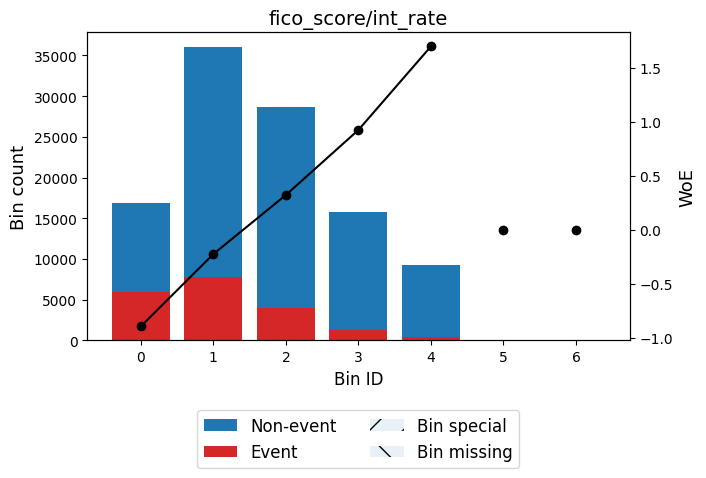


🔍 Feature: installment/annual_inc/12
✅ Total IV for installment/annual_inc/12: 0.0966
╒══════════════╤═════════╤════════════════════╤══════════════════════╤═════════════╕
│ Bin          │   Count │   Default Rate (%) │ WOE                  │          IV │
╞══════════════╪═════════╪════════════════════╪══════════════════════╪═════════════╡
│ (-inf, 0.04) │   18219 │             0.1167 │ 0.5105859136525677   │ 0.0375865   │
├──────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [0.04, 0.06) │   24560 │             0.1459 │ 0.2542023568769618   │ 0.0136937   │
├──────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [0.06, 0.08) │   12791 │             0.1693 │ 0.0773037620148076   │ 0.000699038 │
├──────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [0.08, 0.10) │   22365 │             0.1975 │ -0.11072371011566373 │ 0.00266217  │
├──────────────┼─────────┼────────────────────┼────────────────

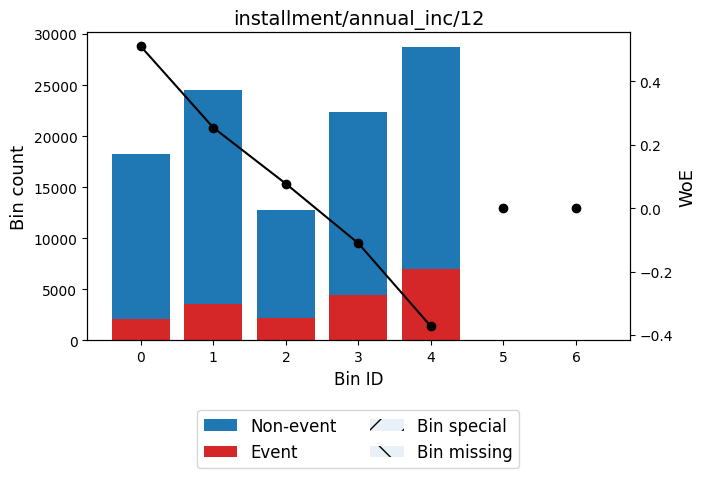


🔍 Feature: installment/annual_inc/12_x_term
✅ Total IV for installment/annual_inc/12_x_term: 0.2220
╒══════════════╤═════════╤════════════════════╤══════════════════════╤═════════════╕
│ Bin          │   Count │   Default Rate (%) │ WOE                  │          IV │
╞══════════════╪═════════╪════════════════════╪══════════════════════╪═════════════╡
│ (-inf, 2.26) │   36979 │             0.1157 │ 0.5206319362516538   │ 0.0790494   │
├──────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [2.26, 3.65) │   29466 │             0.1576 │ 0.16338612948349485  │ 0.00699419  │
├──────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [3.65, 4.53) │   13381 │             0.193  │ -0.08261438653448239 │ 0.000878955 │
├──────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [4.53, 6.79) │   20538 │             0.2574 │ -0.45337497840365404 │ 0.0453788   │
├──────────────┼─────────┼────────────────────┼──

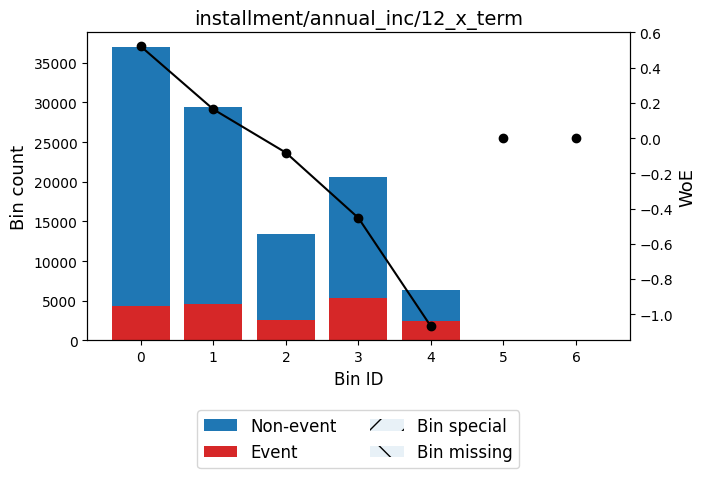

✅ Total IV for grade_numeric: 0.4495
╒══════════════╤═════════╤════════════════════╤══════════════════════╤════════════╕
│ Bin          │   Count │   Default Rate (%) │ WOE                  │         IV │
╞══════════════╪═════════╪════════════════════╪══════════════════════╪════════════╡
│ (-inf, 1.50) │   19152 │             0.0572 │ 1.2897552537484054   │ 0.19308    │
├──────────────┼─────────┼────────────────────┼──────────────────────┼────────────┤
│ [1.50, 2.50) │   31568 │             0.1195 │ 0.48396190320638555  │ 0.0590442  │
├──────────────┼─────────┼────────────────────┼──────────────────────┼────────────┤
│ [2.50, 3.50) │   29568 │             0.2017 │ -0.13755903717001128 │ 0.00547781 │
├──────────────┼─────────┼────────────────────┼──────────────────────┼────────────┤
│ [3.50, 4.50) │   15628 │             0.2781 │ -0.5590711507333277  │ 0.0540519  │
├──────────────┼─────────┼────────────────────┼──────────────────────┼────────────┤
│ [4.50, inf)  │   10743 │             

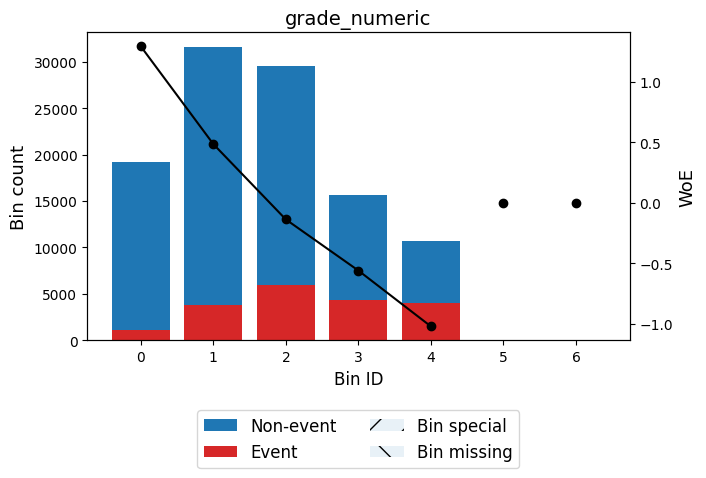

In [24]:
# == 1. Get Numeric Columns from Spark Dataframe ==
numerical_cols1 = get_numerical_cols(df1, TARGET_COL)

# == 2. Obtain Sampled Pandas Train, Test Dataframe from Spark Dataframe, orders them ==
train_pdf1, test_pdf1 = sample_split_order(
    initial_df=df1, sample_frac=0.1, cut_off_date=CUT_DATE, date_col="issue_d"
)

# == 3. Observe IV of Numerical Variables ==
for feature in numerical_cols1:
    if feature == "id":
        continue

    print(f"\n🔍 Feature: {feature}")

    if train_pdf1[feature].nunique() < 2:
        print("⚠️ Not enough variation. Skipping.")
        iv_categories["no_variation"].append(feature)
        continue

    x, y = train_pdf1[feature], train_pdf1[TARGET_COL]

    bin_and_classify_feature(feature=feature, x=x, y=y, monotonic_trend_type="auto")

# == Include grade_numeric as well (ordinal feature) ==
train_pdf1 = tx_grade(train_pdf1)

bin_and_classify_feature(
    "grade_numeric",
    train_pdf1["grade_numeric"],
    train_pdf1[TARGET_COL],
    dtype="numerical",
    monotonic_trend_type="auto",
)

### 2.2 Categorical Features IV


✅ Total IV for home_ownership: 0.0204
╒══════════════════════╤═════════╤════════════════════╤══════════════════════╤═════════════╕
│ Bin                  │   Count │   Default Rate (%) │ WOE                  │          IV │
╞══════════════════════╪═════════╪════════════════════╪══════════════════════╪═════════════╡
│ ['OTHER' 'MORTGAGE'] │   53140 │             0.1597 │ 0.1472218936239298   │ 0.0102957   │
├──────────────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ ['OWN']              │   11033 │             0.1892 │ -0.05754492730128136 │ 0.000348857 │
├──────────────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ ['RENT']             │   42486 │             0.2042 │ -0.15282778046170753 │ 0.00976129  │
├──────────────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ Special              │       0 │             0      │ 0.0                  │ 0           │
├──────────────────────┼────────

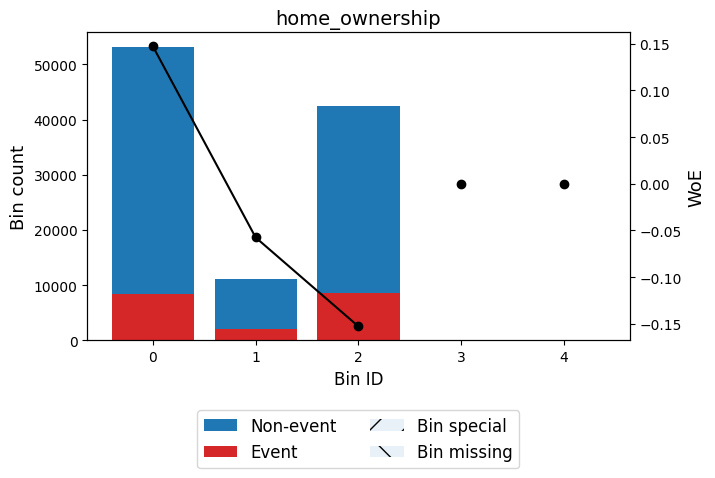

✅ Total IV for verification_status: 0.0560
╒═════════════════════╤═════════╤════════════════════╤═══════════════════════╤════════════╕
│ Bin                 │   Count │   Default Rate (%) │ WOE                   │         IV │
╞═════════════════════╪═════════╪════════════════════╪═══════════════════════╪════════════╡
│ ['Not Verified']    │   31381 │             0.1307 │ 0.3818991823484652    │ 0.0378354  │
├─────────────────────┼─────────┼────────────────────┼───────────────────────┼────────────┤
│ ['Source Verified'] │   41116 │             0.1894 │ -0.059210007208211124 │ 0.00137711 │
├─────────────────────┼─────────┼────────────────────┼───────────────────────┼────────────┤
│ ['Verified']        │   34162 │             0.2155 │ -0.22095355165689212  │ 0.0167513  │
├─────────────────────┼─────────┼────────────────────┼───────────────────────┼────────────┤
│ Special             │       0 │             0      │ 0.0                   │ 0          │
├─────────────────────┼─────────┼────

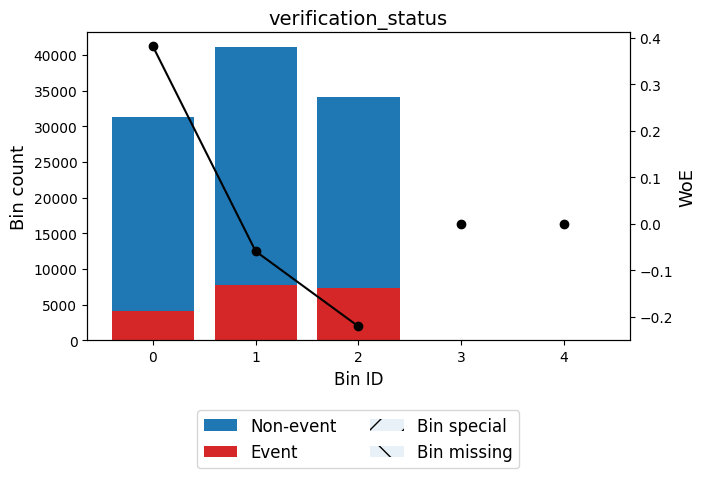

✅ Total IV for initial_list_status: 0.0010
╒═════════╤═════════╤════════════════════╤═══════════════════════╤═════════════╕
│ Bin     │   Count │   Default Rate (%) │ WOE                   │          IV │
╞═════════╪═════════╪════════════════════╪═══════════════════════╪═════════════╡
│ ['f']   │   48701 │             0.1754 │ 0.03454368496326832   │ 0.00053885  │
├─────────┼─────────┼────────────────────┼───────────────────────┼─────────────┤
│ ['w']   │   57958 │             0.1847 │ -0.028447719656045978 │ 0.000443759 │
├─────────┼─────────┼────────────────────┼───────────────────────┼─────────────┤
│ Special │       0 │             0      │ 0.0                   │ 0           │
├─────────┼─────────┼────────────────────┼───────────────────────┼─────────────┤
│ Missing │       0 │             0      │ 0.0                   │ 0           │
├─────────┼─────────┼────────────────────┼───────────────────────┼─────────────┤
│         │  106659 │             0.1805 │                       │

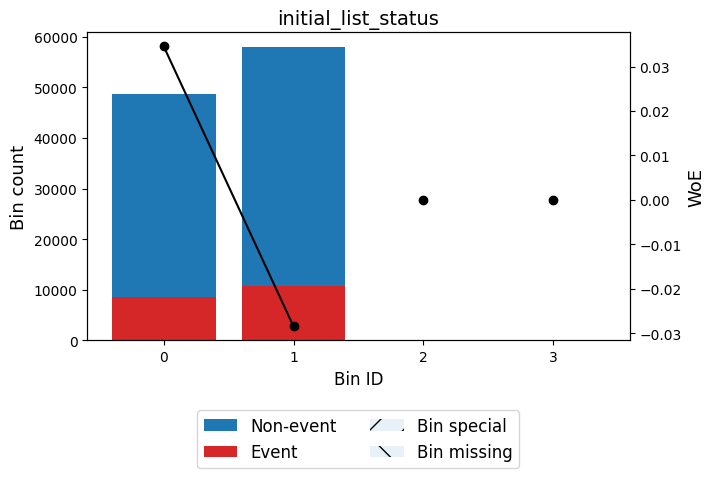

✅ Total IV for application_type: 0.0000
╒════════════════════════════╤═════════╤════════════════════╤════════════════════════╤══════╕
│ Bin                        │   Count │   Default Rate (%) │ WOE                    │   IV │
╞════════════════════════════╪═════════╪════════════════════╪════════════════════════╪══════╡
│ ['Individual' 'Joint App'] │  106659 │             0.1805 │ -2.220446049250313e-16 │    0 │
├────────────────────────────┼─────────┼────────────────────┼────────────────────────┼──────┤
│ Special                    │       0 │             0      │ 0.0                    │    0 │
├────────────────────────────┼─────────┼────────────────────┼────────────────────────┼──────┤
│ Missing                    │       0 │             0      │ 0.0                    │    0 │
├────────────────────────────┼─────────┼────────────────────┼────────────────────────┼──────┤
│                            │  106659 │             0.1805 │                        │    0 │
╘═══════════════════

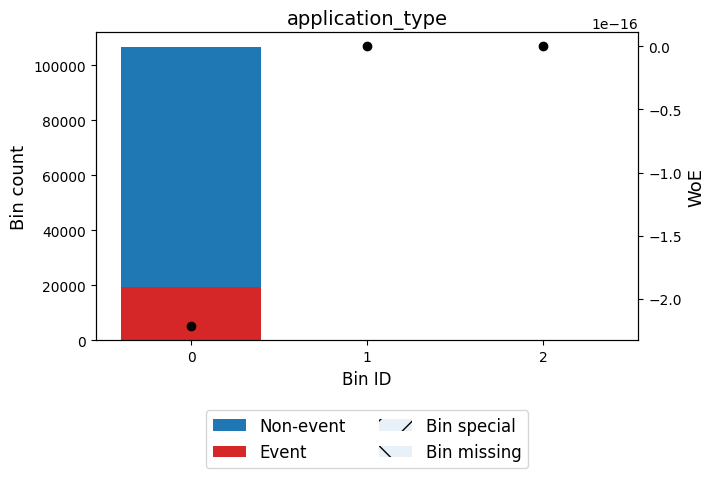

In [25]:
# == Observe IV of Categorical Variables ==
categorical_features = get_categorical_cols(df1, TARGET_COL)

for feat in categorical_features:
    if feat != "grade":
        bin_and_classify_feature(
            feat,
            train_pdf1[feat],
            train_pdf1[TARGET_COL],
            dtype="categorical",
            monotonic_trend_type="auto",
        )

### 2.3 Feature Importance Rankings


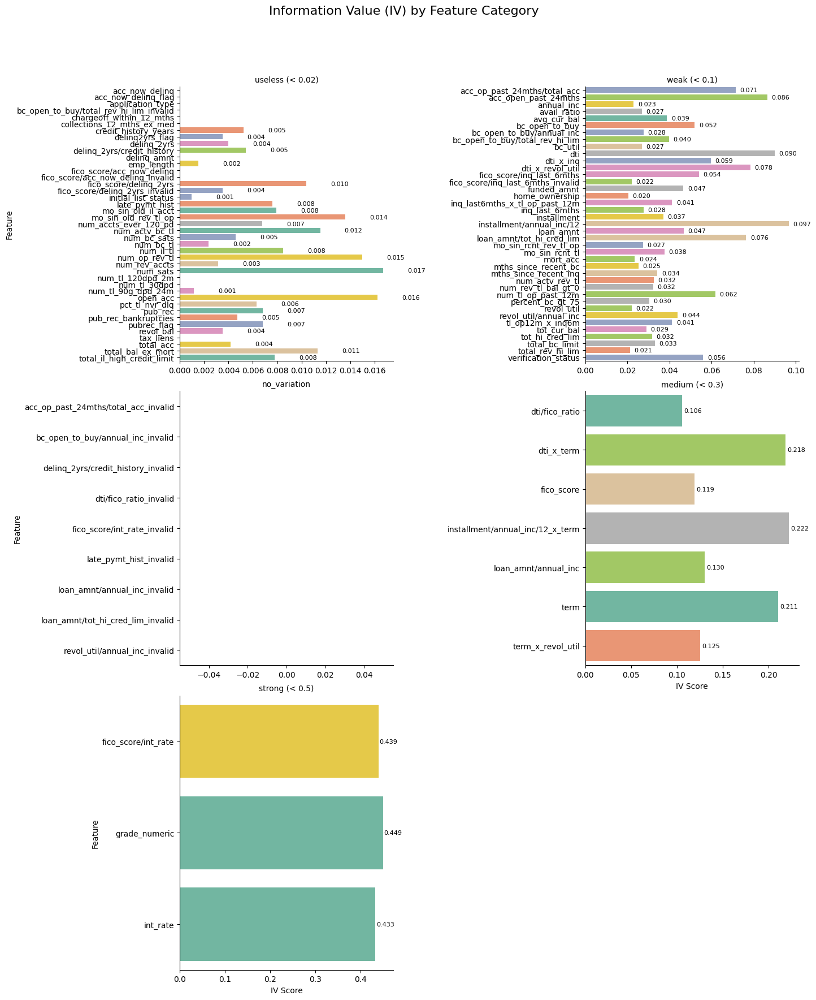

In [26]:
# == Compiled Feature Rankings (Categorical & Numerical) ==
plot_iv_by_category(iv_categories)

### 2.4 Feature Filtering

Now that we have identified the more relevant/important features for PD Modeling, lets drop the features and observe feature importance ranking & WoE trends.


In [27]:
# == Define columns to abandon & keep (Based on train_pdf1) ==
no_variation_columns = [
    item
    for category, feature_list in iv_categories.items()
    if category == "no_variation"
    for item in feature_list
]

useless_cols = [
    feature
    for category, feature_list in iv_categories.items()
    if category == "useless (< 0.02)"
    for feature, _ in feature_list
]

throw_cols = no_variation_columns + useless_cols
keep_cols = [c for c in train_pdf1.columns if c not in throw_cols]

train_pdf1 = train_pdf1.drop(columns=throw_cols)
print("✅ Dropped columns with IV < 0.02 and columns with no variation in TRAIN_DF1")

✅ Dropped columns with IV < 0.02 and columns with no variation in TRAIN_DF1


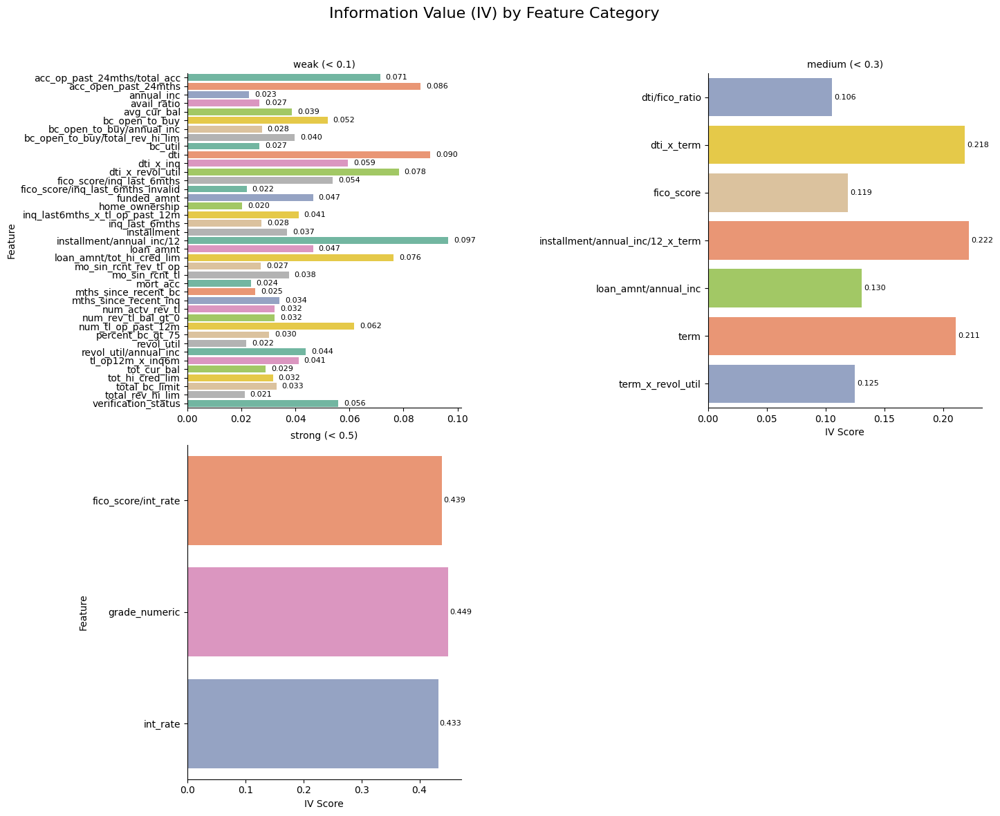

In [28]:
# == Leftover Columns IV in TRAIN_DF1 ==
updated_iv_categories = get_updated_iv_categories(iv_categories, train_pdf1)

plot_iv_by_category(updated_iv_categories)

In [29]:
train_pdf1.columns

Index(['id', 'loan_amnt', 'funded_amnt', 'term', 'int_rate', 'installment',
       'home_ownership', 'annual_inc', 'verification_status', 'issue_d',
       'default_status', 'dti', 'inq_last_6mths', 'revol_util', 'tot_cur_bal',
       'total_rev_hi_lim', 'acc_open_past_24mths', 'avg_cur_bal',
       'bc_open_to_buy', 'bc_util', 'mo_sin_rcnt_rev_tl_op', 'mo_sin_rcnt_tl',
       'mort_acc', 'mths_since_recent_bc', 'mths_since_recent_inq',
       'num_actv_rev_tl', 'num_rev_tl_bal_gt_0', 'num_tl_op_past_12m',
       'percent_bc_gt_75', 'tot_hi_cred_lim', 'total_bc_limit', 'fico_score',
       'fico_score/inq_last_6mths_invalid', 'fico_score/inq_last_6mths',
       'loan_amnt/annual_inc', 'revol_util/annual_inc',
       'acc_op_past_24mths/total_acc', 'bc_open_to_buy/annual_inc',
       'inq_last6mths_x_tl_op_past_12m', 'dti_x_revol_util', 'avail_ratio',
       'tl_op12m_x_inq6m', 'dti_x_inq', 'dti_x_term', 'term_x_revol_util',
       'dti/fico_ratio', 'loan_amnt/tot_hi_cred_lim',
       '

✅ Total IV for acc_op_past_24mths/total_acc: 0.0714
╒══════════════╤═════════╤════════════════════╤══════════════════════╤════════════╕
│ Bin          │   Count │   Default Rate (%) │ WOE                  │         IV │
╞══════════════╪═════════╪════════════════════╪══════════════════════╪════════════╡
│ (-inf, 0.08) │   16730 │             0.1247 │ 0.4352109732611824   │ 0.0257274  │
├──────────────┼─────────┼────────────────────┼──────────────────────┼────────────┤
│ [0.08, 0.13) │   19325 │             0.1471 │ 0.24479771285743612  │ 0.0100237  │
├──────────────┼─────────┼────────────────────┼──────────────────────┼────────────┤
│ [0.13, 0.18) │   21358 │             0.1673 │ 0.09192602214227175  │ 0.00164275 │
├──────────────┼─────────┼────────────────────┼──────────────────────┼────────────┤
│ [0.18, 0.29) │   27603 │             0.2016 │ -0.13697760845295348 │ 0.00506972 │
├──────────────┼─────────┼────────────────────┼──────────────────────┼────────────┤
│ [0.29, inf)  │   21643

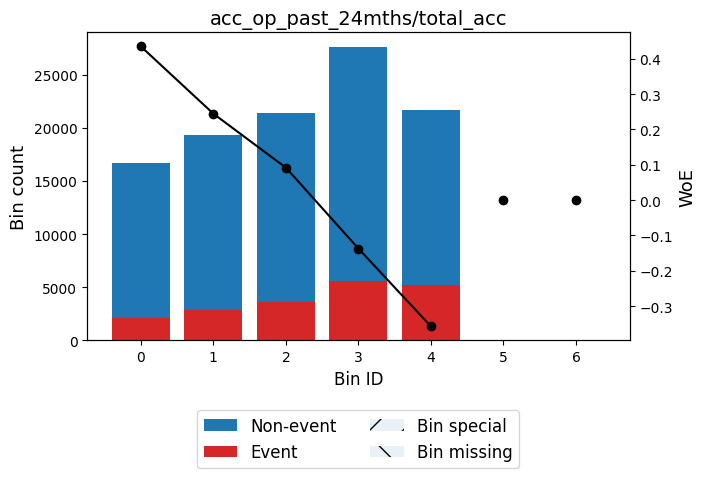

✅ Total IV for acc_open_past_24mths: 0.0863
╒══════════════╤═════════╤════════════════════╤═════════════════════╤════════════╕
│ Bin          │   Count │   Default Rate (%) │ WOE                 │         IV │
╞══════════════╪═════════╪════════════════════╪═════════════════════╪════════════╡
│ (-inf, 2.50) │   27027 │             0.1299 │ 0.3890837221800465  │ 0.0337415  │
├──────────────┼─────────┼────────────────────┼─────────────────────┼────────────┤
│ [2.50, 4.50) │   34512 │             0.1644 │ 0.1125649172303238  │ 0.00395359 │
├──────────────┼─────────┼────────────────────┼─────────────────────┼────────────┤
│ [4.50, 7.50) │   29338 │             0.201  │ -0.132768673802921  │ 0.00505573 │
├──────────────┼─────────┼────────────────────┼─────────────────────┼────────────┤
│ [7.50, 9.50) │    8610 │             0.2424 │ -0.3734170394979788 │ 0.0126151  │
├──────────────┼─────────┼────────────────────┼─────────────────────┼────────────┤
│ [9.50, inf)  │    7172 │             0.29

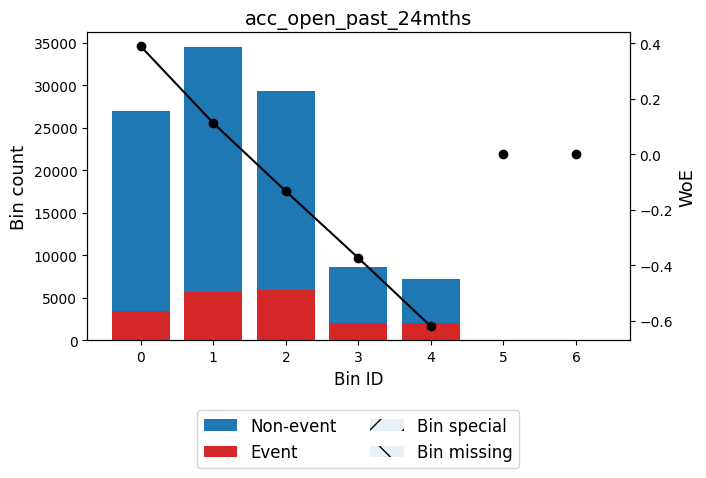

✅ Total IV for annual_inc: 0.0229
╒═══════════════════════╤═════════╤════════════════════╤══════════════════════╤═════════════╕
│ Bin                   │   Count │   Default Rate (%) │ WOE                  │          IV │
╞═══════════════════════╪═════════╪════════════════════╪══════════════════════╪═════════════╡
│ (-inf, 49599.50)      │   30612 │             0.2049 │ -0.15679746442798037 │ 0.00741239  │
├───────────────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [49599.50, 66110.50)  │   25661 │             0.1907 │ -0.06741607600218114 │ 0.0011171   │
├───────────────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [66110.50, 87082.50)  │   21081 │             0.1773 │ 0.021939670537014733 │ 9.44719e-05 │
├───────────────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [87082.50, 101406.00) │    9940 │             0.1554 │ 0.17958857596292144  │ 0.00283539  │
├───────────────────────┼─

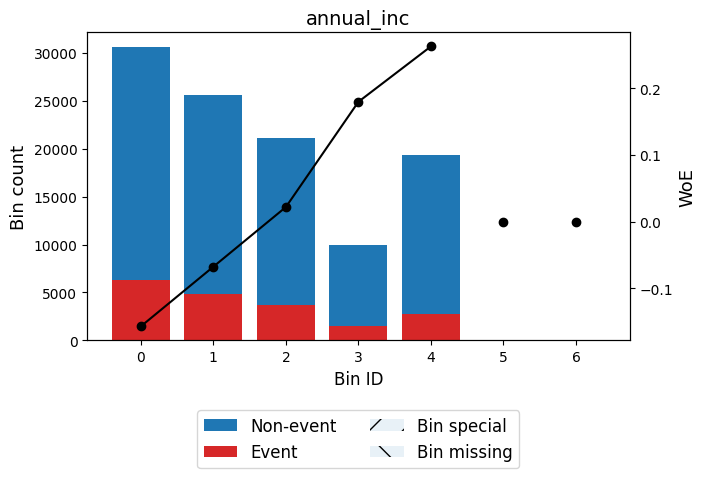

✅ Total IV for avail_ratio: 0.0268
╒══════════════════╤═════════╤════════════════════╤══════════════════════╤═════════════╕
│ Bin              │   Count │   Default Rate (%) │ WOE                  │          IV │
╞══════════════════╪═════════╪════════════════════╪══════════════════════╪═════════════╡
│ (-inf, -93.95)   │   11150 │             0.2303 │ -0.30648420347525573 │ 0.0107921   │
├──────────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [-93.95, -72.75) │   29329 │             0.1973 │ -0.11006703117266547 │ 0.00344912  │
├──────────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [-72.75, -41.95) │   39001 │             0.1745 │ 0.041160780911184025 │ 0.000611379 │
├──────────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [-41.95, -30.75) │    9757 │             0.1596 │ 0.1483494572014723   │ 0.00191875  │
├──────────────────┼─────────┼────────────────────┼──────────────────────┼─

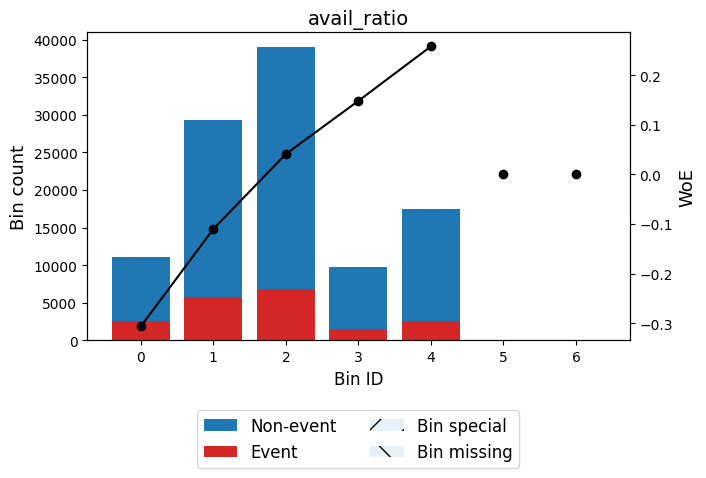

✅ Total IV for avg_cur_bal: 0.0388
╒══════════════════════╤═════════╤════════════════════╤══════════════════════╤═════════════╕
│ Bin                  │   Count │   Default Rate (%) │ WOE                  │          IV │
╞══════════════════════╪═════════╪════════════════════╪══════════════════════╪═════════════╡
│ (-inf, 1307.50)      │    6403 │             0.1696 │ 0.07538420879358365  │ 0.000332973 │
├──────────────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [1307.50, 7209.50)   │   43045 │             0.2099 │ -0.18761520735253723 │ 0.0150645   │
├──────────────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [7209.50, 24189.50)  │   40387 │             0.1718 │ 0.06015857795419932  │ 0.00134413  │
├──────────────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [24189.50, 41144.00) │   11480 │             0.138  │ 0.3191535374810788   │ 0.00987293  │
├──────────────────────┼─────────┼─

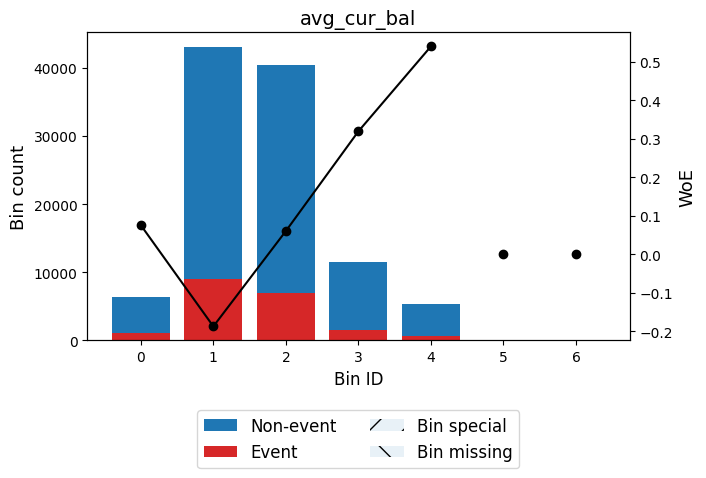

✅ Total IV for bc_open_to_buy: 0.0519
╒══════════════════════╤═════════╤════════════════════╤══════════════════════╤═════════════╕
│ Bin                  │   Count │   Default Rate (%) │ WOE                  │          IV │
╞══════════════════════╪═════════╪════════════════════╪══════════════════════╪═════════════╡
│ (-inf, 344.50)       │   10038 │             0.2315 │ -0.3132767834205026  │ 0.0101715   │
├──────────────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [344.50, 2675.50)    │   28491 │             0.2049 │ -0.15690433366000622 │ 0.00690845  │
├──────────────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [2675.50, 14317.50)  │   47764 │             0.1778 │ 0.01822023398229833  │ 0.000147801 │
├──────────────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [14317.50, 29655.00) │   12768 │             0.1441 │ 0.26853892699066617  │ 0.00790671  │
├──────────────────────┼────────

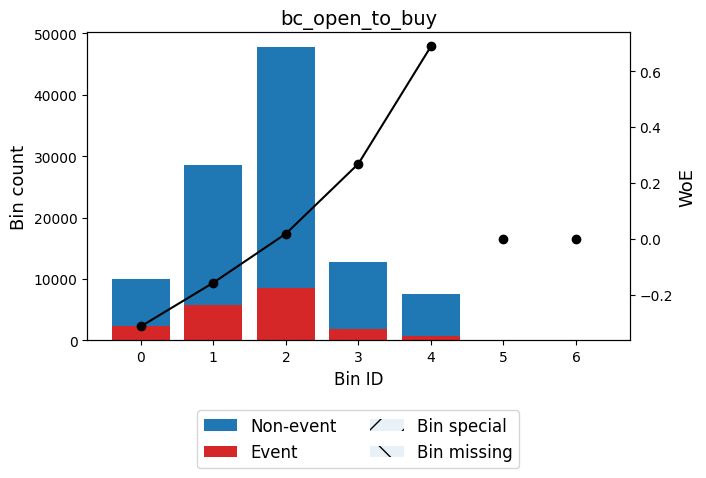

✅ Total IV for bc_open_to_buy/annual_inc: 0.0277
╒══════════════╤═════════╤════════════════════╤═══════════════════════╤═════════════╕
│ Bin          │   Count │   Default Rate (%) │ WOE                   │          IV │
╞══════════════╪═════════╪════════════════════╪═══════════════════════╪═════════════╡
│ (-inf, 0.00) │    5965 │             0.2334 │ -0.32359592145318383  │ 0.0064687   │
├──────────────┼─────────┼────────────────────┼───────────────────────┼─────────────┤
│ [0.00, 0.02) │   21545 │             0.2055 │ -0.1606154165074598   │ 0.0054805   │
├──────────────┼─────────┼────────────────────┼───────────────────────┼─────────────┤
│ [0.02, 0.14) │   47075 │             0.1812 │ -0.004643592276986519 │ 9.53114e-06 │
├──────────────┼─────────┼────────────────────┼───────────────────────┼─────────────┤
│ [0.14, 0.43) │   24606 │             0.1616 │ 0.13344623407195888   │ 0.00393464  │
├──────────────┼─────────┼────────────────────┼───────────────────────┼─────────────┤
│ [0.

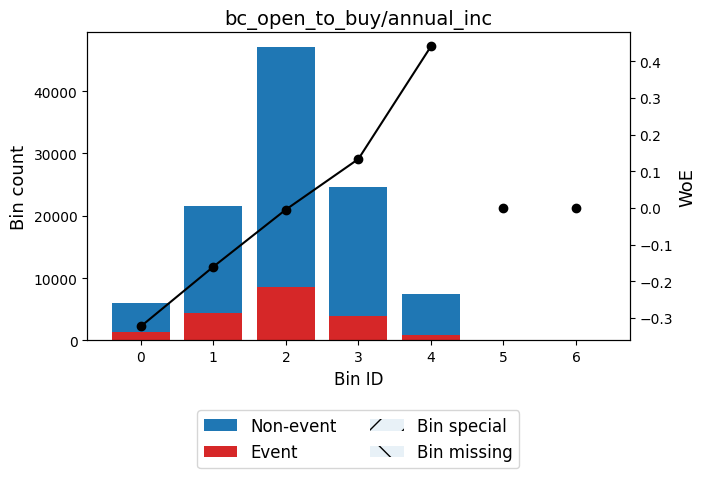

✅ Total IV for bc_open_to_buy/total_rev_hi_lim: 0.0397
╒══════════════╤═════════╤════════════════════╤══════════════════════╤════════════╕
│ Bin          │   Count │   Default Rate (%) │ WOE                  │         IV │
╞══════════════╪═════════╪════════════════════╪══════════════════════╪════════════╡
│ (-inf, 0.03) │   12770 │             0.2312 │ -0.31172983026827517 │ 0.0128066  │
├──────────────┼─────────┼────────────────────┼──────────────────────┼────────────┤
│ [0.03, 0.19) │   35799 │             0.1975 │ -0.11115345991519598 │ 0.00429497 │
├──────────────┼─────────┼────────────────────┼──────────────────────┼────────────┤
│ [0.19, 0.52) │   42668 │             0.1694 │ 0.07702152552536745  │ 0.00231506 │
├──────────────┼─────────┼────────────────────┼──────────────────────┼────────────┤
│ [0.52, 0.71) │    9966 │             0.1367 │ 0.33024919946128906  │ 0.00914307 │
├──────────────┼─────────┼────────────────────┼──────────────────────┼────────────┤
│ [0.71, inf)  │    5

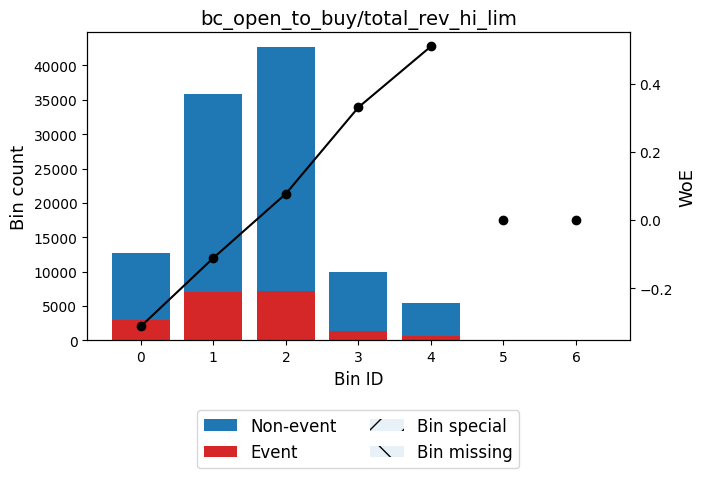

✅ Total IV for bc_util: 0.0268
╒════════════════╤═════════╤════════════════════╤══════════════════════╤═════════════╕
│ Bin            │   Count │   Default Rate (%) │ WOE                  │          IV │
╞════════════════╪═════════╪════════════════════╪══════════════════════╪═════════════╡
│ (-inf, 31.75)  │   17422 │             0.1454 │ 0.25819451003700133  │ 0.010008    │
├────────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [31.75, 42.95) │    9757 │             0.1596 │ 0.1483494572014723   │ 0.00191875  │
├────────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [42.95, 73.75) │   39001 │             0.1745 │ 0.041160780911184025 │ 0.000611379 │
├────────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [73.75, 94.95) │   29329 │             0.1973 │ -0.11006703117266547 │ 0.00344912  │
├────────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [94.95, in

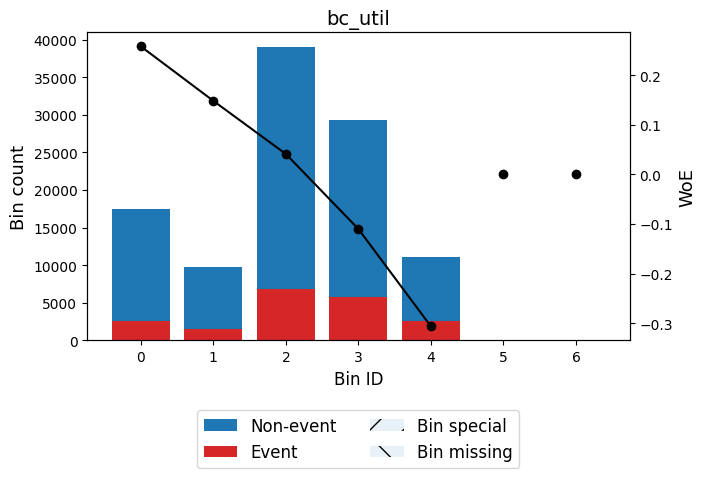

✅ Total IV for dti: 0.0899
╒════════════════╤═════════╤════════════════════╤══════════════════════╤════════════╕
│ Bin            │   Count │   Default Rate (%) │ WOE                  │         IV │
╞════════════════╪═════════╪════════════════════╪══════════════════════╪════════════╡
│ (-inf, 10.98)  │   22879 │             0.1247 │ 0.43603705635436296  │ 0.0353071  │
├────────────────┼─────────┼────────────────────┼──────────────────────┼────────────┤
│ [10.98, 18.81) │   35629 │             0.1597 │ 0.14763708900609784  │ 0.00694108 │
├────────────────┼─────────┼────────────────────┼──────────────────────┼────────────┤
│ [18.81, 24.16) │   21796 │             0.1942 │ -0.08984714607340116 │ 0.00169722 │
├────────────────┼─────────┼────────────────────┼──────────────────────┼────────────┤
│ [24.16, 29.88) │   16125 │             0.23   │ -0.3044499504857776  │ 0.0153916  │
├────────────────┼─────────┼────────────────────┼──────────────────────┼────────────┤
│ [29.88, inf)   │   10230 

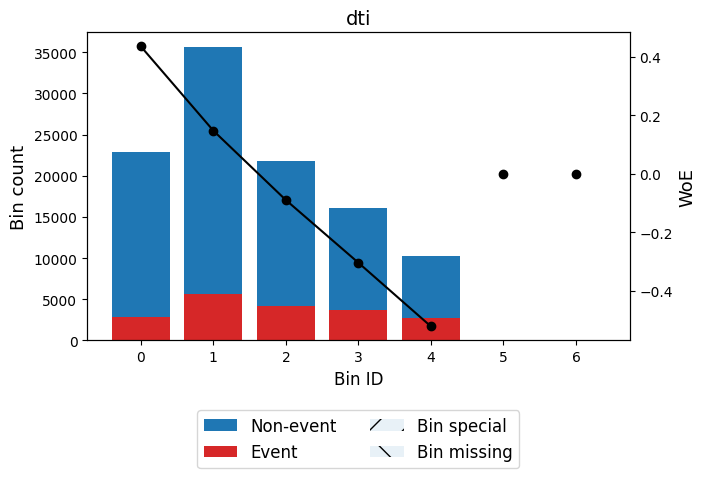

✅ Total IV for dti/fico_ratio: 0.1056
╒══════════════╤═════════╤════════════════════╤══════════════════════╤════════════╕
│ Bin          │   Count │   Default Rate (%) │ WOE                  │         IV │
╞══════════════╪═════════╪════════════════════╪══════════════════════╪════════════╡
│ (-inf, 0.02) │   25642 │             0.1235 │ 0.4462348073166571   │ 0.0413004  │
├──────────────┼─────────┼────────────────────┼──────────────────────┼────────────┤
│ [0.02, 0.03) │   34492 │             0.16   │ 0.14492818182720169  │ 0.006481   │
├──────────────┼─────────┼────────────────────┼──────────────────────┼────────────┤
│ [0.03, 0.04) │   24426 │             0.1976 │ -0.11177041636850693 │ 0.00296369 │
├──────────────┼─────────┼────────────────────┼──────────────────────┼────────────┤
│ [0.04, 0.05) │   15765 │             0.245  │ -0.387761434678358   │ 0.0250102  │
├──────────────┼─────────┼────────────────────┼──────────────────────┼────────────┤
│ [0.05, inf)  │    6334 │            

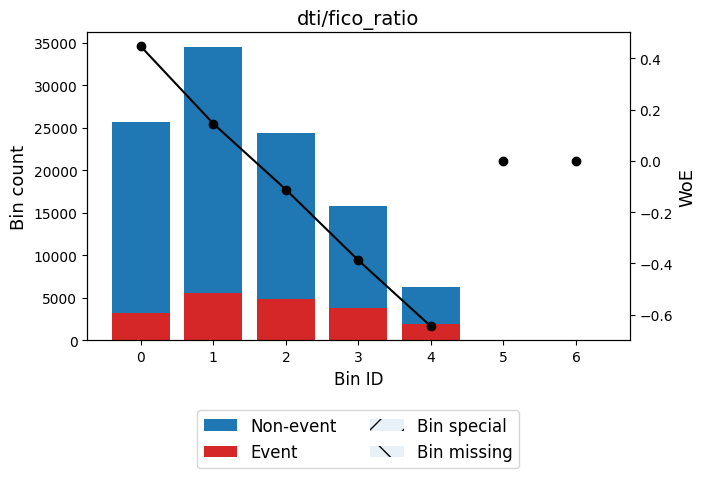

✅ Total IV for dti_x_inq: 0.0595
╒════════════════╤═════════╤════════════════════╤══════════════════════╤═════════════╕
│ Bin            │   Count │   Default Rate (%) │ WOE                  │          IV │
╞════════════════╪═════════╪════════════════════╪══════════════════════╪═════════════╡
│ (-inf, 15.91)  │   74280 │             0.159  │ 0.15271600707933364  │ 0.0154579   │
├────────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [15.91, 24.38) │   11708 │             0.1916 │ -0.07323727509365918 │ 0.000602607 │
├────────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [24.38, 29.66) │    5680 │             0.225  │ -0.27626117706794706 │ 0.00442699  │
├────────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [29.66, 52.66) │    9650 │             0.2438 │ -0.38125160917861645 │ 0.0147717   │
├────────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [52.66, 

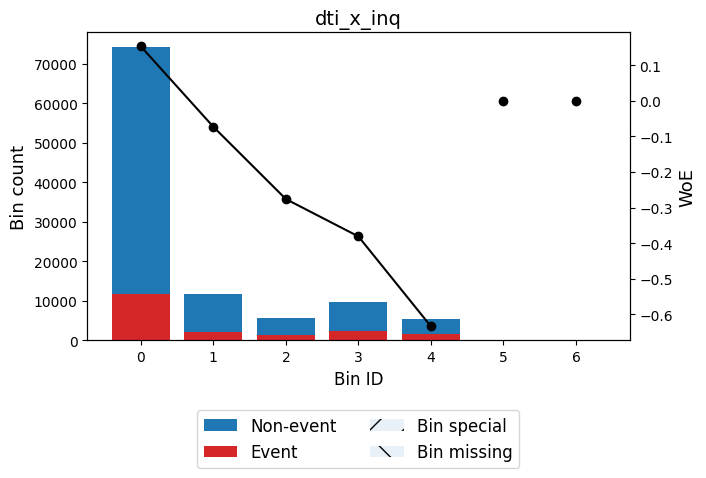

✅ Total IV for dti_x_revol_util: 0.0784
╒════════════════════╤═════════╤════════════════════╤══════════════════════╤═════════════╕
│ Bin                │   Count │   Default Rate (%) │ WOE                  │          IV │
╞════════════════════╪═════════╪════════════════════╪══════════════════════╪═════════════╡
│ (-inf, 365.40)     │   19924 │             0.1239 │ 0.44278912597708286  │ 0.031634    │
├────────────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [365.40, 656.57)   │   19099 │             0.1486 │ 0.23264621988886036  │ 0.00898356  │
├────────────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [656.57, 1071.17)  │   25038 │             0.1758 │ 0.03222998916615838  │ 0.000241344 │
├────────────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [1071.17, 1663.67) │   24483 │             0.2069 │ -0.1694263847840407  │ 0.00694869  │
├────────────────────┼─────────┼──────────────────

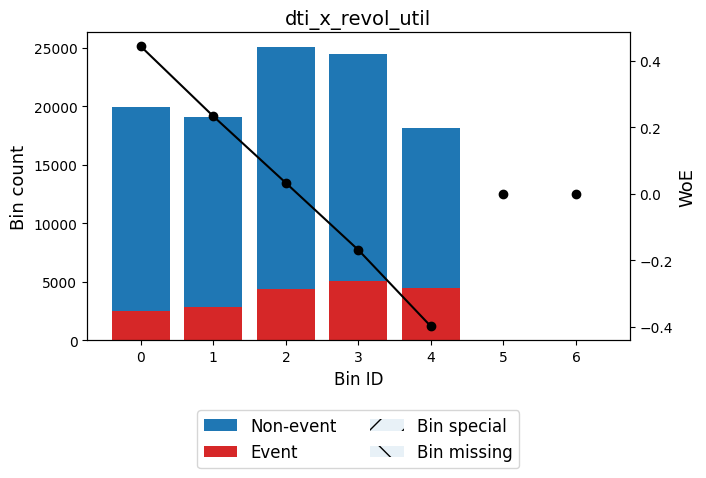

✅ Total IV for dti_x_term: 0.2185
╒════════════════════╤═════════╤════════════════════╤═════════════════════╤════════════╕
│ Bin                │   Count │   Default Rate (%) │ WOE                 │         IV │
╞════════════════════╪═════════╪════════════════════╪═════════════════════╪════════════╡
│ (-inf, 532.98)     │   34540 │             0.1162 │ 0.5157667249019098  │ 0.0725824  │
├────────────────────┼─────────┼────────────────────┼─────────────────────┼────────────┤
│ [532.98, 853.68)   │   33702 │             0.1571 │ 0.16662476760735534 │ 0.00831109 │
├────────────────────┼─────────┼────────────────────┼─────────────────────┼────────────┤
│ [853.68, 1232.82)  │   24861 │             0.214  │ -0.2122214132164697 │ 0.0112163  │
├────────────────────┼─────────┼────────────────────┼─────────────────────┼────────────┤
│ [1232.82, 1461.42) │    6254 │             0.2859 │ -0.5976283275502303 │ 0.0249716  │
├────────────────────┼─────────┼────────────────────┼─────────────────────┼─

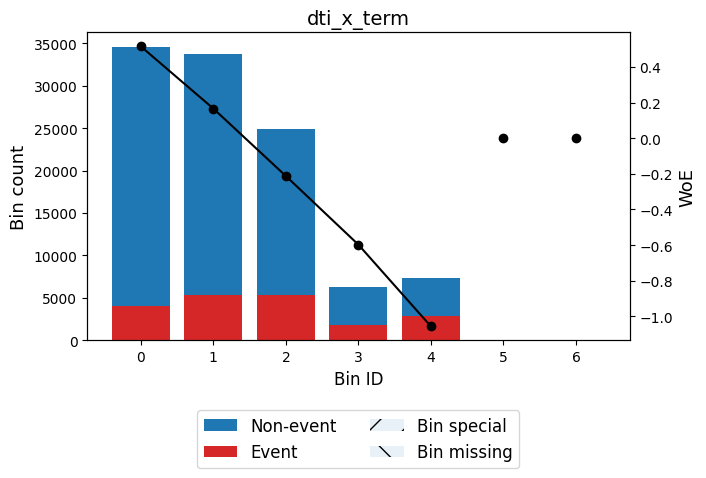

✅ Total IV for fico_score: 0.1189
╒══════════════════╤═════════╤════════════════════╤══════════════════════╤═════════════╕
│ Bin              │   Count │   Default Rate (%) │ WOE                  │          IV │
╞══════════════════╪═════════╪════════════════════╪══════════════════════╪═════════════╡
│ (-inf, 684.50)   │   45181 │             0.2239 │ -0.2700660183241195  │ 0.0335903   │
├──────────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [684.50, 709.50) │   31806 │             0.1804 │ 0.000786639106898912 │ 1.84482e-07 │
├──────────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [709.50, 734.50) │   17118 │             0.1356 │ 0.3394025260112232   │ 0.0165362   │
├──────────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [734.50, 754.50) │    5853 │             0.1037 │ 0.6436685651504468   │ 0.0183359   │
├──────────────────┼─────────┼────────────────────┼──────────────────────┼──

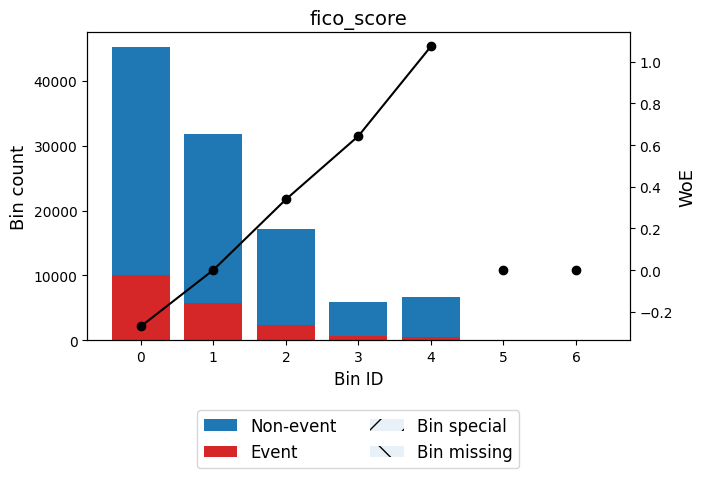

✅ Total IV for fico_score/inq_last_6mths: 0.0539
╒══════════════════╤═════════╤════════════════════╤══════════════════════╤═════════════╕
│ Bin              │   Count │   Default Rate (%) │ WOE                  │          IV │
╞══════════════════╪═════════╪════════════════════╪══════════════════════╪═════════════╡
│ (-inf, 111.58)   │   60568 │             0.1612 │ 0.13612703941334536  │ 0.0100694   │
├──────────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [111.58, 342.25) │   11403 │             0.2474 │ -0.40044824966740045 │ 0.0193635   │
├──────────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [342.25, 684.50) │   18736 │             0.2184 │ -0.23802695704826426 │ 0.010717    │
├──────────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [684.50, 709.50) │    8695 │             0.1952 │ -0.0962613965234671  │ 0.000778749 │
├──────────────────┼─────────┼────────────────────┼──────────

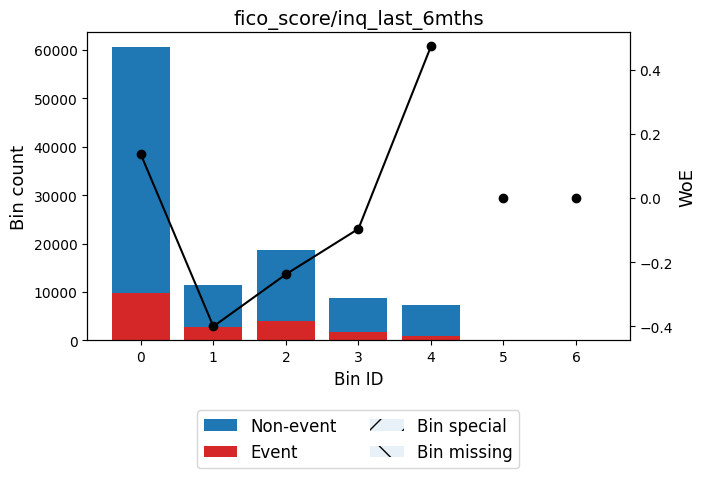

✅ Total IV for fico_score/inq_last_6mths_invalid: 0.0221
╒══════════════╤═════════╤════════════════════╤══════════════════════╤═══════════╕
│ Bin          │   Count │   Default Rate (%) │ WOE                  │        IV │
╞══════════════╪═════════╪════════════════════╪══════════════════════╪═══════════╡
│ (-inf, 0.50) │   46109 │             0.2058 │ -0.16242980011647123 │ 0.0120021 │
├──────────────┼─────────┼────────────────────┼──────────────────────┼───────────┤
│ [0.50, inf)  │   60550 │             0.1612 │ 0.13601688186281402  │ 0.0100505 │
├──────────────┼─────────┼────────────────────┼──────────────────────┼───────────┤
│ Special      │       0 │             0      │ 0.0                  │ 0         │
├──────────────┼─────────┼────────────────────┼──────────────────────┼───────────┤
│ Missing      │       0 │             0      │ 0.0                  │ 0         │
├──────────────┼─────────┼────────────────────┼──────────────────────┼───────────┤
│              │  106659 │    

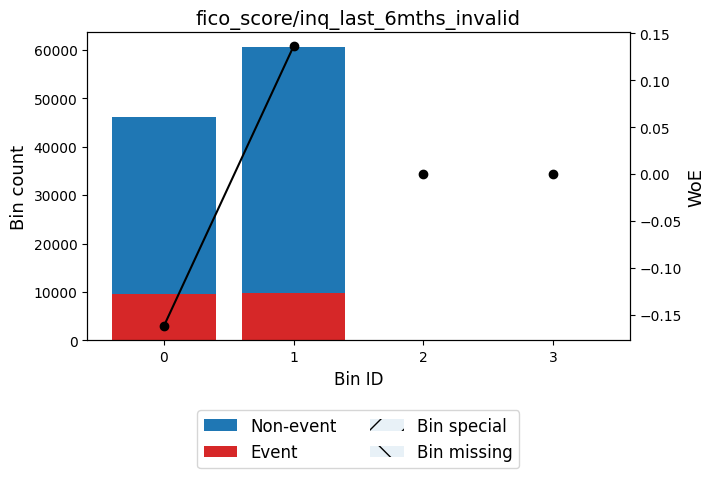

✅ Total IV for fico_score/int_rate: 0.4392
╒═════════════════╤═════════╤════════════════════╤══════════════════════╤═══════════╕
│ Bin             │   Count │   Default Rate (%) │ WOE                  │        IV │
╞═════════════════╪═════════╪════════════════════╪══════════════════════╪═══════════╡
│ (-inf, 38.54)   │   16835 │             0.3499 │ -0.8933970709055429  │ 0.161473  │
├─────────────────┼─────────┼────────────────────┼──────────────────────┼───────────┤
│ [38.54, 54.17)  │   36025 │             0.216  │ -0.22399153950182749 │ 0.0181706 │
├─────────────────┼─────────┼────────────────────┼──────────────────────┼───────────┤
│ [54.17, 75.39)  │   28721 │             0.1375 │ 0.3229342309734968   │ 0.025257  │
├─────────────────┼─────────┼────────────────────┼──────────────────────┼───────────┤
│ [75.39, 100.06) │   15810 │             0.0803 │ 0.9248627674179994   │ 0.0928338 │
├─────────────────┼─────────┼────────────────────┼──────────────────────┼───────────┤
│ [100.06, 

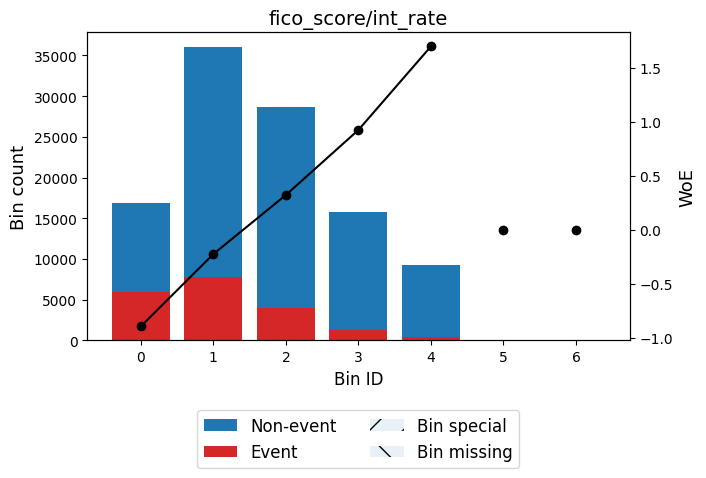

✅ Total IV for funded_amnt: 0.0466
╒══════════════════════╤═════════╤════════════════════╤══════════════════════╤═════════════╕
│ Bin                  │   Count │   Default Rate (%) │ WOE                  │          IV │
╞══════════════════════╪═════════╪════════════════════╪══════════════════════╪═════════════╡
│ (-inf, 7512.50)      │   25153 │             0.1376 │ 0.32202716700060763  │ 0.0220019   │
├──────────────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [7512.50, 10012.50)  │   17999 │             0.1572 │ 0.16595335573751502  │ 0.00440392  │
├──────────────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [10012.50, 16062.50) │   26832 │             0.188  │ -0.04986386279811916 │ 0.000635493 │
├──────────────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [16062.50, 28062.50) │   27757 │             0.2102 │ -0.18919036163337544 │ 0.00988272  │
├──────────────────────┼─────────┼─

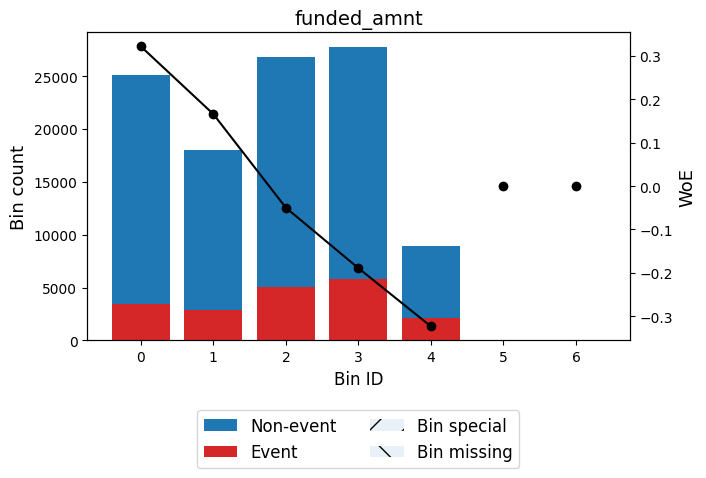

✅ Total IV for grade_numeric: 0.4495
╒══════════════╤═════════╤════════════════════╤══════════════════════╤════════════╕
│ Bin          │   Count │   Default Rate (%) │ WOE                  │         IV │
╞══════════════╪═════════╪════════════════════╪══════════════════════╪════════════╡
│ (-inf, 1.50) │   19152 │             0.0572 │ 1.2897552537484054   │ 0.19308    │
├──────────────┼─────────┼────────────────────┼──────────────────────┼────────────┤
│ [1.50, 2.50) │   31568 │             0.1195 │ 0.48396190320638555  │ 0.0590442  │
├──────────────┼─────────┼────────────────────┼──────────────────────┼────────────┤
│ [2.50, 3.50) │   29568 │             0.2017 │ -0.13755903717001128 │ 0.00547781 │
├──────────────┼─────────┼────────────────────┼──────────────────────┼────────────┤
│ [3.50, 4.50) │   15628 │             0.2781 │ -0.5590711507333277  │ 0.0540519  │
├──────────────┼─────────┼────────────────────┼──────────────────────┼────────────┤
│ [4.50, inf)  │   10743 │             

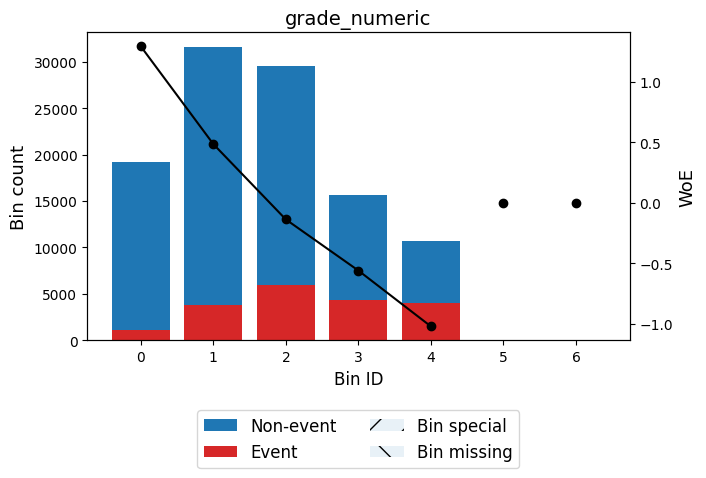

✅ Total IV for home_ownership: 0.0204
╒══════════════════════╤═════════╤════════════════════╤══════════════════════╤═════════════╕
│ Bin                  │   Count │   Default Rate (%) │ WOE                  │          IV │
╞══════════════════════╪═════════╪════════════════════╪══════════════════════╪═════════════╡
│ ['OTHER' 'MORTGAGE'] │   53140 │             0.1597 │ 0.1472218936239298   │ 0.0102957   │
├──────────────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ ['OWN']              │   11033 │             0.1892 │ -0.05754492730128136 │ 0.000348857 │
├──────────────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ ['RENT']             │   42486 │             0.2042 │ -0.15282778046170753 │ 0.00976129  │
├──────────────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ Special              │       0 │             0      │ 0.0                  │ 0           │
├──────────────────────┼────────

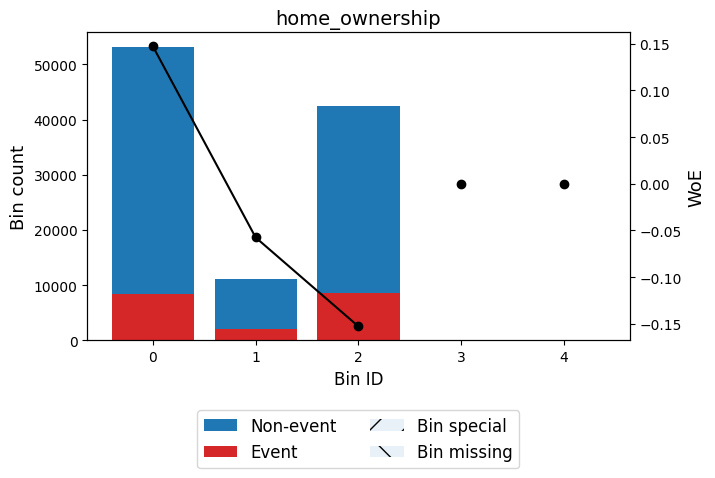

✅ Total IV for inq_last6mths_x_tl_op_past_12m: 0.0412
╒══════════════╤═════════╤════════════════════╤══════════════════════╤═════════════╕
│ Bin          │   Count │   Default Rate (%) │ WOE                  │          IV │
╞══════════════╪═════════╪════════════════════╪══════════════════════╪═════════════╡
│ (-inf, 1.50) │   70403 │             0.1619 │ 0.13084646656781307  │ 0.0108327   │
├──────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [1.50, 2.50) │   10086 │             0.1824 │ -0.01306114155305993 │ 1.61992e-05 │
├──────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [2.50, 4.50) │   12518 │             0.206  │ -0.16395911913021322 │ 0.00332164  │
├──────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [4.50, 6.50) │    5640 │             0.231  │ -0.31051023750635265 │ 0.00560996  │
├──────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [6.50, in

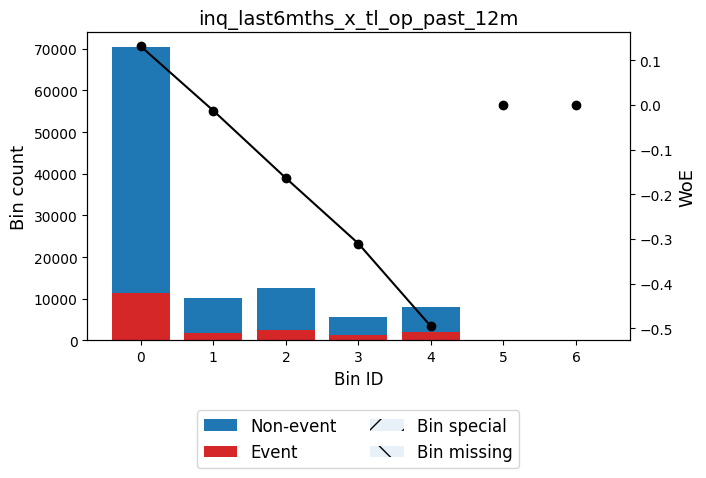

✅ Total IV for inq_last_6mths: 0.0275
╒══════════════╤═════════╤════════════════════╤══════════════════════╤════════════╕
│ Bin          │   Count │   Default Rate (%) │ WOE                  │         IV │
╞══════════════╪═════════╪════════════════════╪══════════════════════╪════════════╡
│ (-inf, 0.50) │   60550 │             0.1612 │ 0.13601688186281402  │ 0.0100505  │
├──────────────┼─────────┼────────────────────┼──────────────────────┼────────────┤
│ [0.50, 1.50) │   29129 │             0.1933 │ -0.08461566964614708 │ 0.00200848 │
├──────────────┼─────────┼────────────────────┼──────────────────────┼────────────┤
│ [1.50, 2.50) │   10917 │             0.217  │ -0.2297943919366212  │ 0.00580559 │
├──────────────┼─────────┼────────────────────┼──────────────────────┼────────────┤
│ [2.50, inf)  │    6063 │             0.2453 │ -0.38895921761739527 │ 0.00968141 │
├──────────────┼─────────┼────────────────────┼──────────────────────┼────────────┤
│ Special      │       0 │            

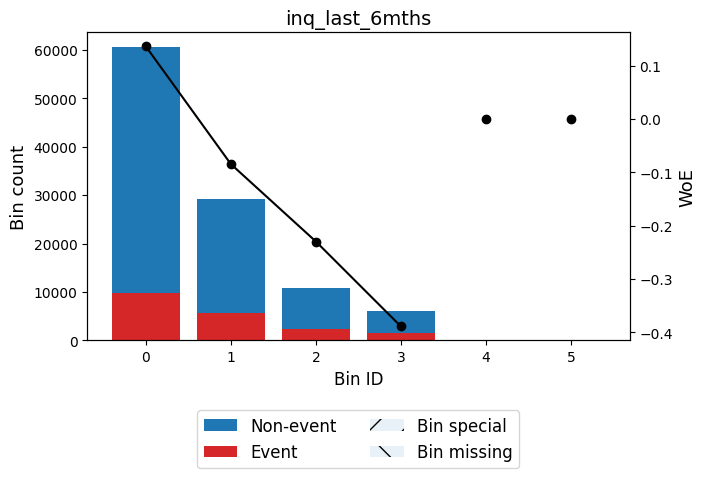

✅ Total IV for installment: 0.0370
╒══════════════════╤═════════╤════════════════════╤══════════════════════╤═════════════╕
│ Bin              │   Count │   Default Rate (%) │ WOE                  │          IV │
╞══════════════════╪═════════╪════════════════════╪══════════════════════╪═════════════╡
│ (-inf, 203.43)   │   18599 │             0.1308 │ 0.38076140329339303  │ 0.0222996   │
├──────────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [203.43, 251.38) │    7929 │             0.1517 │ 0.20813837210866204  │ 0.00300952  │
├──────────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [251.38, 334.50) │   18073 │             0.1743 │ 0.04247738989491512  │ 0.000301599 │
├──────────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [334.50, 496.95) │   26036 │             0.1941 │ -0.08929334445408754 │ 0.00200211  │
├──────────────────┼─────────┼────────────────────┼──────────────────────┼─

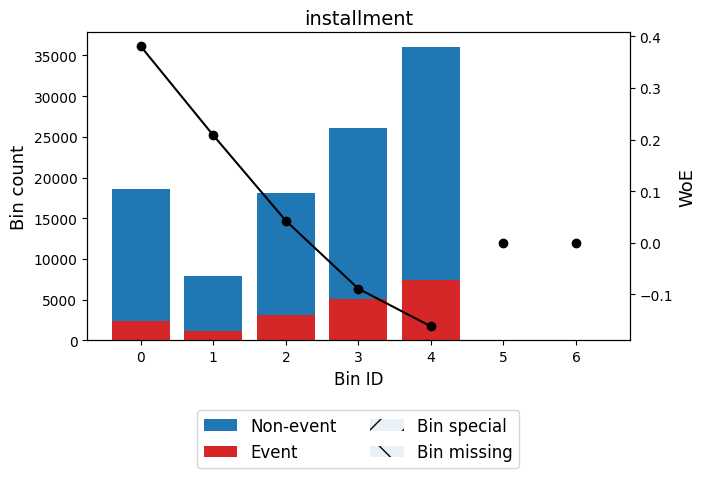

✅ Total IV for installment/annual_inc/12: 0.0966
╒══════════════╤═════════╤════════════════════╤══════════════════════╤═════════════╕
│ Bin          │   Count │   Default Rate (%) │ WOE                  │          IV │
╞══════════════╪═════════╪════════════════════╪══════════════════════╪═════════════╡
│ (-inf, 0.04) │   18219 │             0.1167 │ 0.5105859136525677   │ 0.0375865   │
├──────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [0.04, 0.06) │   24560 │             0.1459 │ 0.2542023568769618   │ 0.0136937   │
├──────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [0.06, 0.08) │   12791 │             0.1693 │ 0.0773037620148076   │ 0.000699038 │
├──────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [0.08, 0.10) │   22365 │             0.1975 │ -0.11072371011566373 │ 0.00266217  │
├──────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [0.10, inf)  │

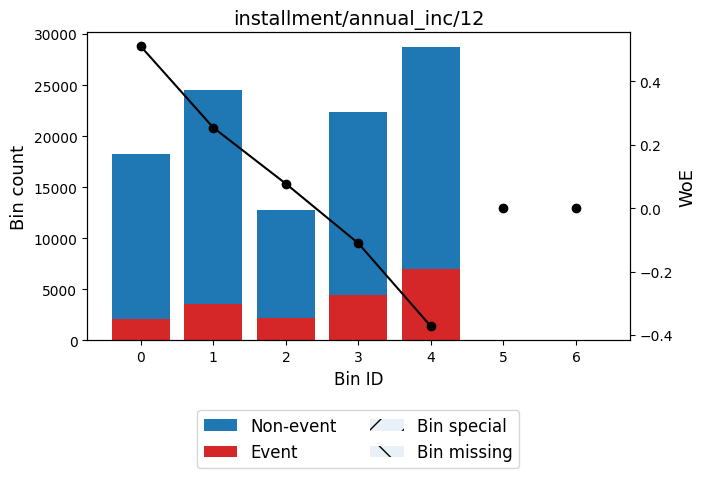

✅ Total IV for installment/annual_inc/12_x_term: 0.2220
╒══════════════╤═════════╤════════════════════╤══════════════════════╤═════════════╕
│ Bin          │   Count │   Default Rate (%) │ WOE                  │          IV │
╞══════════════╪═════════╪════════════════════╪══════════════════════╪═════════════╡
│ (-inf, 2.26) │   36979 │             0.1157 │ 0.5206319362516538   │ 0.0790494   │
├──────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [2.26, 3.65) │   29466 │             0.1576 │ 0.16338612948349485  │ 0.00699419  │
├──────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [3.65, 4.53) │   13381 │             0.193  │ -0.08261438653448239 │ 0.000878955 │
├──────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [4.53, 6.79) │   20538 │             0.2574 │ -0.45337497840365404 │ 0.0453788   │
├──────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [6.79, 

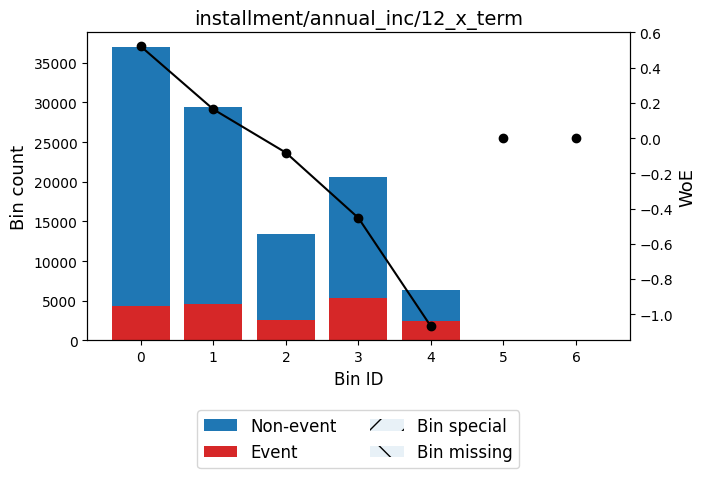

✅ Total IV for int_rate: 0.4327
╒════════════════╤═════════╤════════════════════╤═════════════════════╤═══════════╕
│ Bin            │   Count │   Default Rate (%) │ WOE                 │        IV │
╞════════════════╪═════════╪════════════════════╪═════════════════════╪═══════════╡
│ (-inf, 6.91)   │    7282 │             0.0375 │ 1.732454717098491   │ 0.114353  │
├────────────────┼─────────┼────────────────────┼─────────────────────┼───────────┤
│ [6.91, 8.92)   │   14939 │             0.0742 │ 1.011332057100605   │ 0.10182   │
├────────────────┼─────────┼────────────────────┼─────────────────────┼───────────┤
│ [8.92, 12.57)  │   29442 │             0.1289 │ 0.3980209201375007  │ 0.0383485 │
├────────────────┼─────────┼────────────────────┼─────────────────────┼───────────┤
│ [12.57, 17.78) │   38587 │             0.2156 │ -0.2213215590589177 │ 0.0189863 │
├────────────────┼─────────┼────────────────────┼─────────────────────┼───────────┤
│ [17.78, inf)   │   16409 │             0.3

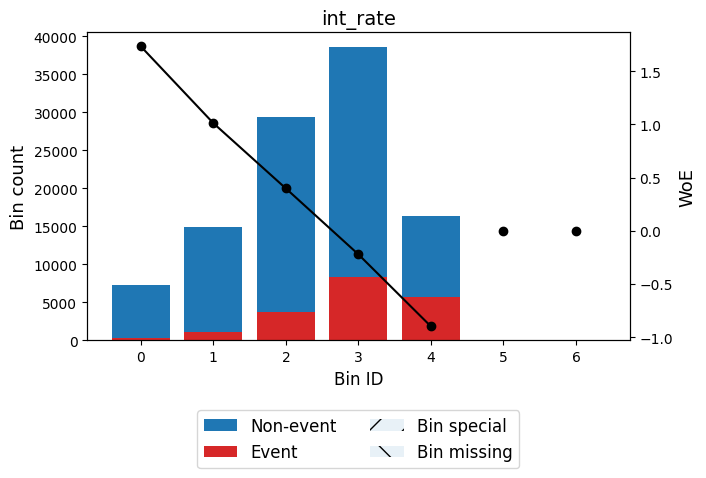

✅ Total IV for loan_amnt: 0.0466
╒══════════════════════╤═════════╤════════════════════╤══════════════════════╤═════════════╕
│ Bin                  │   Count │   Default Rate (%) │ WOE                  │          IV │
╞══════════════════════╪═════════╪════════════════════╪══════════════════════╪═════════════╡
│ (-inf, 7512.50)      │   25133 │             0.1377 │ 0.32177485291975816  │ 0.0219519   │
├──────────────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [7512.50, 10012.50)  │   17985 │             0.1571 │ 0.1671282113989474   │ 0.0044613   │
├──────────────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [10012.50, 16062.50) │   26824 │             0.188  │ -0.04974269232910755 │ 0.000632196 │
├──────────────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [16062.50, 28062.50) │   27781 │             0.2101 │ -0.18896389459506469 │ 0.00986692  │
├──────────────────────┼─────────┼───

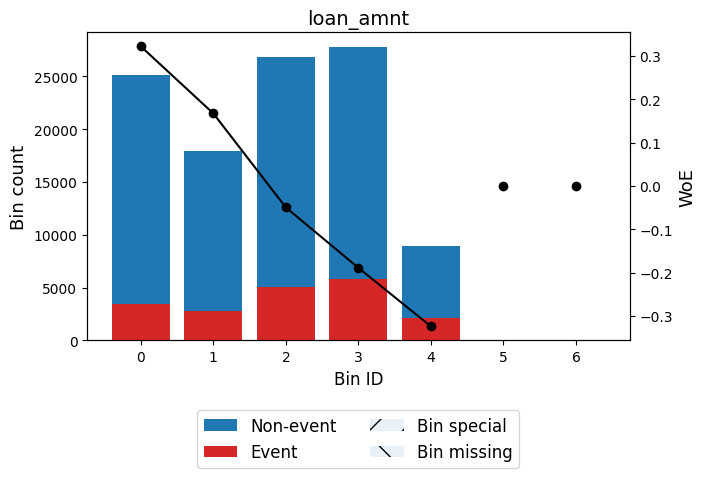

✅ Total IV for loan_amnt/annual_inc: 0.1305
╒══════════════╤═════════╤════════════════════╤═════════════════════╤════════════╕
│ Bin          │   Count │   Default Rate (%) │ WOE                 │         IV │
╞══════════════╪═════════╪════════════════════╪═════════════════════╪════════════╡
│ (-inf, 0.14) │   32639 │             0.1225 │ 0.45573620801088954 │ 0.0546561  │
├──────────────┼─────────┼────────────────────┼─────────────────────┼────────────┤
│ [0.14, 0.23) │   29957 │             0.161  │ 0.13780156588924397 │ 0.00510081 │
├──────────────┼─────────┼────────────────────┼─────────────────────┼────────────┤
│ [0.23, 0.30) │   18094 │             0.1996 │ -0.1243789408049838 │ 0.00272935 │
├──────────────┼─────────┼────────────────────┼─────────────────────┼────────────┤
│ [0.30, 0.35) │   10415 │             0.2376 │ -0.3473509249784834 │ 0.0131043  │
├──────────────┼─────────┼────────────────────┼─────────────────────┼────────────┤
│ [0.35, inf)  │   15554 │             0.27

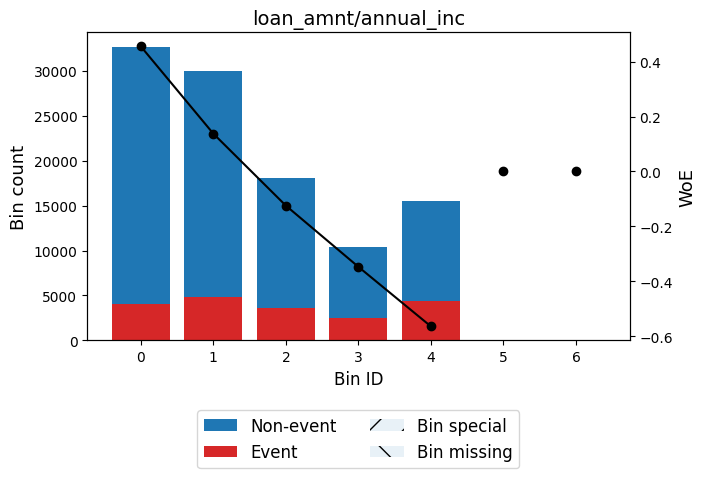

✅ Total IV for loan_amnt/tot_hi_cred_lim: 0.0763
╒══════════════╤═════════╤════════════════════╤══════════════════════╤════════════╕
│ Bin          │   Count │   Default Rate (%) │ WOE                  │         IV │
╞══════════════╪═════════╪════════════════════╪══════════════════════╪════════════╡
│ (-inf, 0.03) │   11744 │             0.1105 │ 0.5723707075153346   │ 0.029811   │
├──────────────┼─────────┼────────────────────┼──────────────────────┼────────────┤
│ [0.03, 0.07) │   26050 │             0.1427 │ 0.27981093393198764  │ 0.0174486  │
├──────────────┼─────────┼────────────────────┼──────────────────────┼────────────┤
│ [0.07, 0.10) │   13000 │             0.1775 │ 0.020090645413945563 │ 4.8881e-05 │
├──────────────┼─────────┼────────────────────┼──────────────────────┼────────────┤
│ [0.10, 0.21) │   26715 │             0.1976 │ -0.11192480188510379 │ 0.00325054 │
├──────────────┼─────────┼────────────────────┼──────────────────────┼────────────┤
│ [0.21, inf)  │   29150 │ 

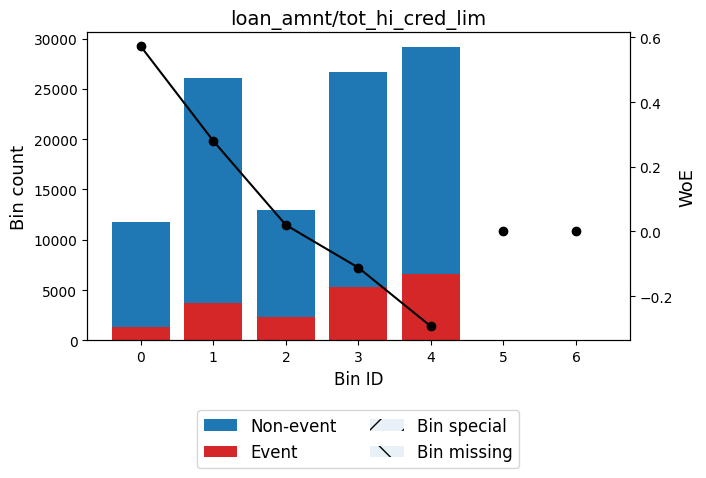

✅ Total IV for mo_sin_rcnt_rev_tl_op: 0.0273
╒════════════════╤═════════╤════════════════════╤══════════════════════╤═════════════╕
│ Bin            │   Count │   Default Rate (%) │ WOE                  │          IV │
╞════════════════╪═════════╪════════════════════╪══════════════════════╪═════════════╡
│ (-inf, 2.50)   │   16453 │             0.2151 │ -0.21855601137592506 │ 0.00788784  │
├────────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [2.50, 7.50)   │   31836 │             0.1933 │ -0.08433572370764186 │ 0.00218043  │
├────────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [7.50, 17.50)  │   36410 │             0.1767 │ 0.02596562431056615  │ 0.000228249 │
├────────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [17.50, 30.50) │   12632 │             0.1529 │ 0.19866420146066033  │ 0.00438174  │
├────────────────┼─────────┼────────────────────┼──────────────────────┼─────────────

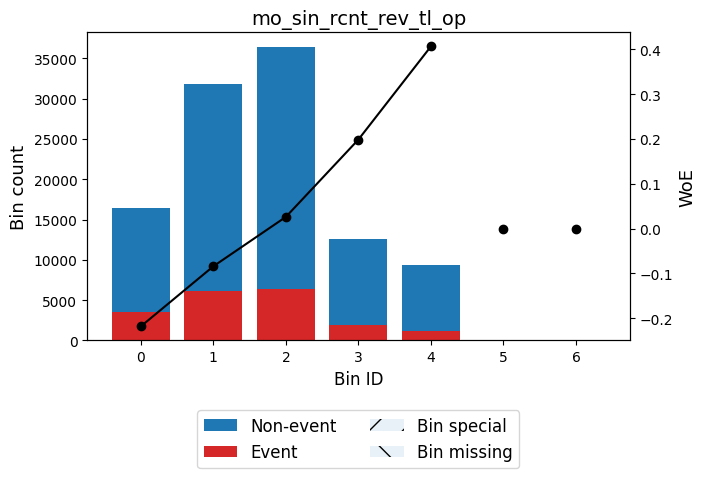

✅ Total IV for mo_sin_rcnt_tl: 0.0377
╒═══════════════╤═════════╤════════════════════╤══════════════════════╤═════════════╕
│ Bin           │   Count │   Default Rate (%) │ WOE                  │          IV │
╞═══════════════╪═════════╪════════════════════╪══════════════════════╪═════════════╡
│ (-inf, 2.50)  │   21527 │             0.2188 │ -0.24032143270458728 │ 0.0125606   │
├───────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [2.50, 4.50)  │   20325 │             0.1975 │ -0.11128273498267638 │ 0.00244426  │
├───────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [4.50, 9.50)  │   38076 │             0.1765 │ 0.02711298679028129  │ 0.000260157 │
├───────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [9.50, 13.50) │   12149 │             0.1603 │ 0.14327024889379802  │ 0.00223206  │
├───────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [13.50, inf)  

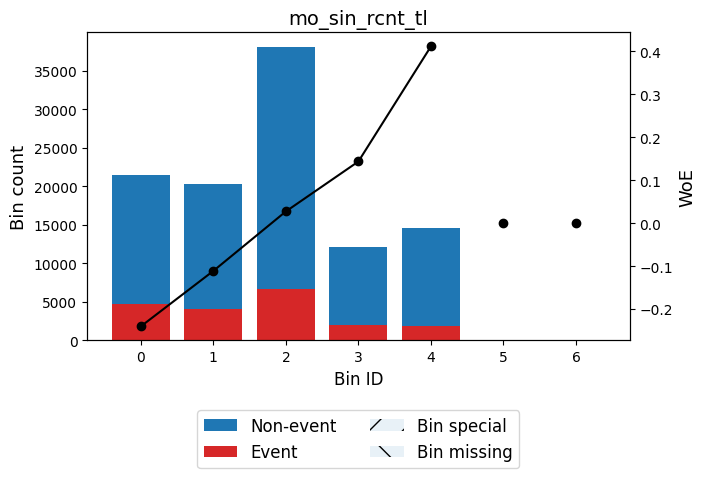

✅ Total IV for mort_acc: 0.0235
╒══════════════╤═════════╤════════════════════╤══════════════════════╤═════════════╕
│ Bin          │   Count │   Default Rate (%) │ WOE                  │          IV │
╞══════════════╪═════════╪════════════════════╪══════════════════════╪═════════════╡
│ (-inf, 0.50) │   40491 │             0.2066 │ -0.16741446752008682 │ 0.0112138   │
├──────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [0.50, 2.50) │   36657 │             0.1739 │ 0.04533547874682209  │ 0.000696172 │
├──────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [2.50, 3.50) │   11068 │             0.1647 │ 0.11057556492568832  │ 0.00122429  │
├──────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [3.50, 5.50) │   12665 │             0.1469 │ 0.2457786540533815   │ 0.00661979  │
├──────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [5.50, inf)  │    5778 │       

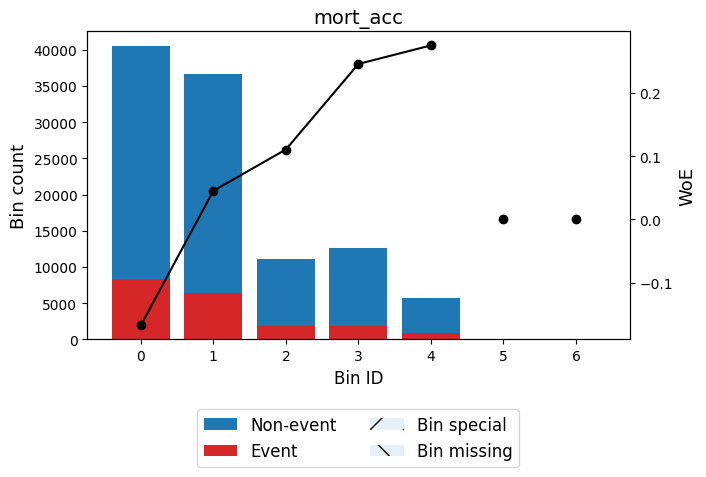

✅ Total IV for mths_since_recent_bc: 0.0252
╒════════════════╤═════════╤════════════════════╤══════════════════════╤═════════════╕
│ Bin            │   Count │   Default Rate (%) │ WOE                  │          IV │
╞════════════════╪═════════╪════════════════════╪══════════════════════╪═════════════╡
│ (-inf, 2.50)   │    8895 │             0.2194 │ -0.2441443344366383  │ 0.00536269  │
├────────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [2.50, 11.50)  │   35886 │             0.1994 │ -0.12320763741004481 │ 0.00530974  │
├────────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [11.50, 29.50) │   37227 │             0.1747 │ 0.03938409414561117  │ 0.000534584 │
├────────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [29.50, 76.50) │   17886 │             0.154  │ 0.19073350224744567  │ 0.00573377  │
├────────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤

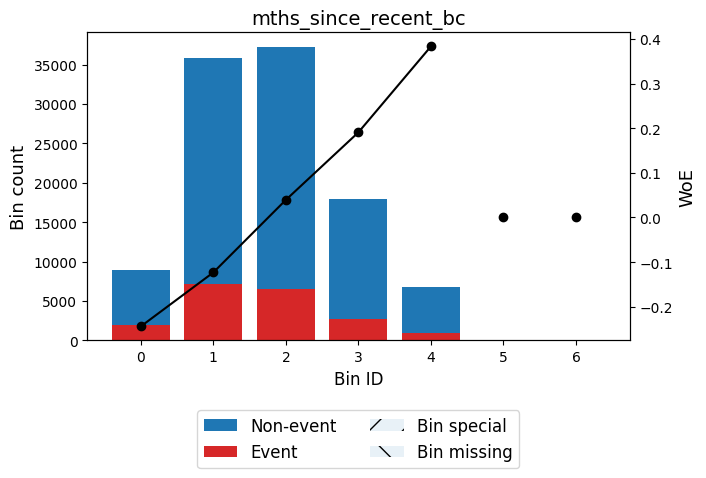

✅ Total IV for mths_since_recent_inq: 0.0342
╒══════════════╤═════════╤════════════════════╤══════════════════════╤═════════════╕
│ Bin          │   Count │   Default Rate (%) │ WOE                  │          IV │
╞══════════════╪═════════╪════════════════════╪══════════════════════╪═════════════╡
│ (-inf, 1.50) │   18948 │             0.224  │ -0.2707140693846646  │ 0.0141575   │
├──────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [1.50, 3.50) │   16014 │             0.2068 │ -0.16881657935910432 │ 0.00451154  │
├──────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [3.50, 4.50) │    6822 │             0.1854 │ -0.03303753209857341 │ 7.05502e-05 │
├──────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [4.50, 5.50) │   20813 │             0.1444 │ 0.2663464223291441   │ 0.0126883   │
├──────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [5.50, inf)  │   4

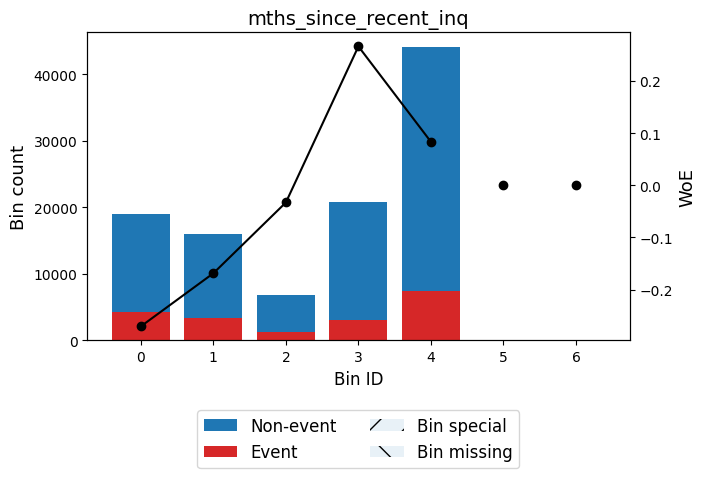

✅ Total IV for num_actv_rev_tl: 0.0324
╒══════════════╤═════════╤════════════════════╤══════════════════════╤═════════════╕
│ Bin          │   Count │   Default Rate (%) │ WOE                  │          IV │
╞══════════════╪═════════╪════════════════════╪══════════════════════╪═════════════╡
│ (-inf, 2.50) │   11822 │             0.1461 │ 0.2526306483833851   │ 0.00651364  │
├──────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [2.50, 5.50) │   50375 │             0.1651 │ 0.10743620399852216  │ 0.00526572  │
├──────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [5.50, 7.50) │   21266 │             0.1879 │ -0.04934677284459377 │ 0.000493195 │
├──────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [7.50, 9.50) │   11792 │             0.2075 │ -0.17304514776988245 │ 0.00349514  │
├──────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [9.50, inf)  │   11404 │

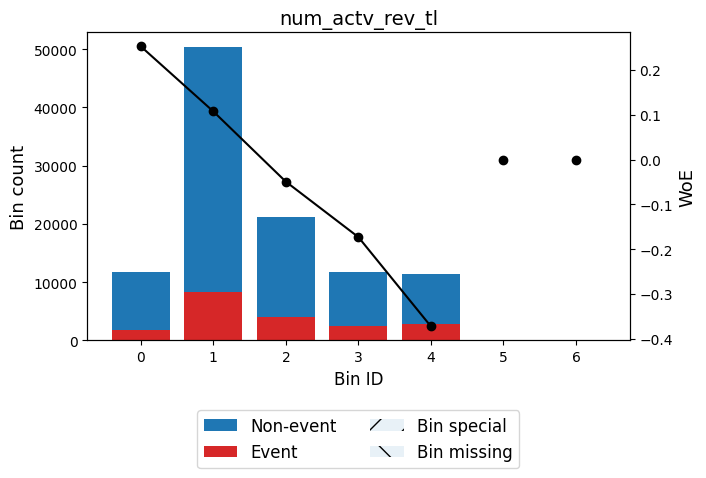

✅ Total IV for num_rev_tl_bal_gt_0: 0.0323
╒══════════════╤═════════╤════════════════════╤═══════════════════════╤═════════════╕
│ Bin          │   Count │   Default Rate (%) │ WOE                   │          IV │
╞══════════════╪═════════╪════════════════════╪═══════════════════════╪═════════════╡
│ (-inf, 2.50) │   11855 │             0.1457 │ 0.2558942620204048    │ 0.00669439  │
├──────────────┼─────────┼────────────────────┼───────────────────────┼─────────────┤
│ [2.50, 5.50) │   50559 │             0.1655 │ 0.10476821661503433   │ 0.0050301   │
├──────────────┼─────────┼────────────────────┼───────────────────────┼─────────────┤
│ [5.50, 7.50) │   21433 │             0.1885 │ -0.053200669763916464 │ 0.000578444 │
├──────────────┼─────────┼────────────────────┼───────────────────────┼─────────────┤
│ [7.50, 9.50) │   11788 │             0.2059 │ -0.1631276085717306   │ 0.0030955   │
├──────────────┼─────────┼────────────────────┼───────────────────────┼─────────────┤
│ [9.50, in

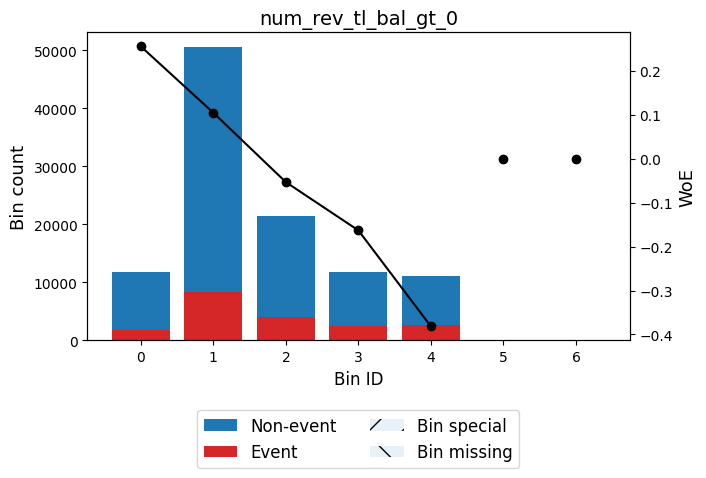

✅ Total IV for num_tl_op_past_12m: 0.0618
╒══════════════╤═════════╤════════════════════╤══════════════════════╤═════════════╕
│ Bin          │   Count │   Default Rate (%) │ WOE                  │          IV │
╞══════════════╪═════════╪════════════════════╪══════════════════════╪═════════════╡
│ (-inf, 0.50) │   17034 │             0.1323 │ 0.3680561065629544   │ 0.0191649   │
├──────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [0.50, 1.50) │   24798 │             0.157  │ 0.16747981705142934  │ 0.00617651  │
├──────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [1.50, 2.50) │   29478 │             0.1724 │ 0.05569049531936354  │ 0.000841962 │
├──────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [2.50, 4.50) │   26137 │             0.2138 │ -0.21060533375164225 │ 0.0116074   │
├──────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [4.50, inf)  │    921

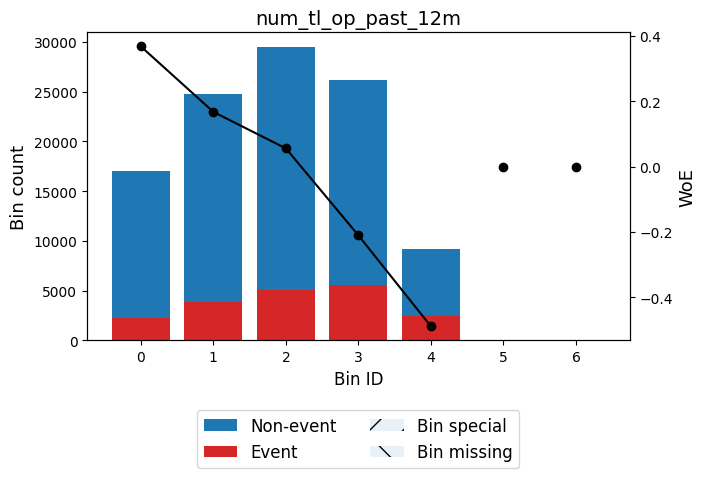

✅ Total IV for percent_bc_gt_75: 0.0303
╒════════════════╤═════════╤════════════════════╤══════════════════════╤═════════════╕
│ Bin            │   Count │   Default Rate (%) │ WOE                  │          IV │
╞════════════════╪═════════╪════════════════════╪══════════════════════╪═════════════╡
│ (-inf, 11.65)  │   23279 │             0.1454 │ 0.25804046814910975  │ 0.0133573   │
├────────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [11.65, 44.10) │   30649 │             0.1667 │ 0.09621835603885853  │ 0.00257905  │
├────────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [44.10, 52.75) │   12127 │             0.1866 │ -0.04082340500623127 │ 0.000191962 │
├────────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [52.75, 67.95) │   11545 │             0.1989 │ -0.11967684510207088 │ 0.00160994  │
├────────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [

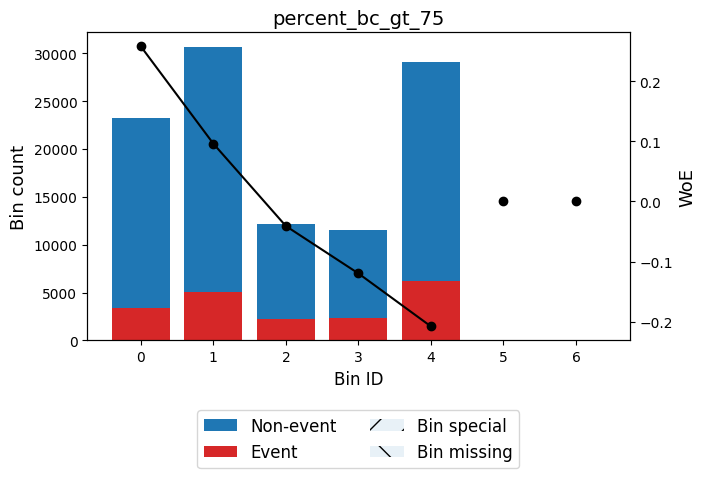

✅ Total IV for revol_util: 0.0219
╒════════════════╤═════════╤════════════════════╤══════════════════════╤═════════════╕
│ Bin            │   Count │   Default Rate (%) │ WOE                  │          IV │
╞════════════════╪═════════╪════════════════════╪══════════════════════╪═════════════╡
│ (-inf, 21.75)  │   11869 │             0.1351 │ 0.3432157368097002   │ 0.0117096   │
├────────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [21.75, 37.75) │   17882 │             0.162  │ 0.13076215320177487  │ 0.00274798  │
├────────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [37.75, 47.95) │   14649 │             0.1734 │ 0.04876109252491001  │ 0.000321483 │
├────────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [47.95, 61.65) │   21364 │             0.188  │ -0.05013957881474718 │ 0.000511644 │
├────────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [61.65,

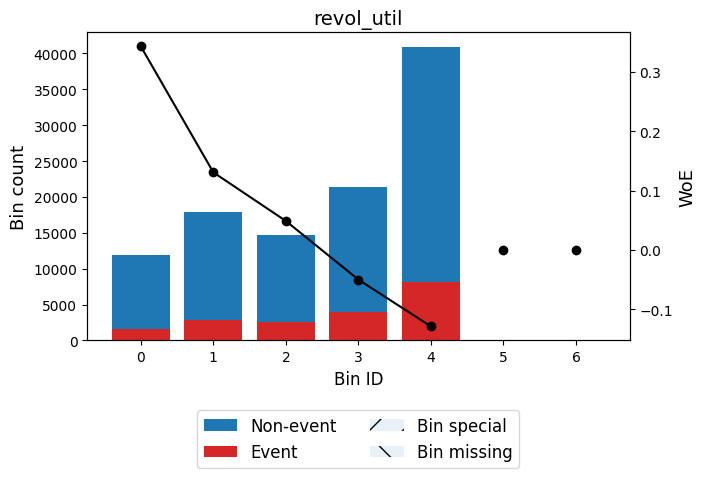

✅ Total IV for revol_util/annual_inc: 0.0439
╒══════════════╤═════════╤════════════════════╤══════════════════════╤═════════════╕
│ Bin          │   Count │   Default Rate (%) │ WOE                  │          IV │
╞══════════════╪═════════╪════════════════════╪══════════════════════╪═════════════╡
│ (-inf, 0.00) │    7994 │             0.1208 │ 0.4714698108775959   │ 0.0142503   │
├──────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [0.00, 0.00) │   25846 │             0.1494 │ 0.2261059278167421   │ 0.0115082   │
├──────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [0.00, 0.00) │   28880 │             0.1789 │ 0.01047167841650154  │ 2.95922e-05 │
├──────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [0.00, 0.00) │   23924 │             0.2004 │ -0.12913115677690512 │ 0.00389554  │
├──────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [0.00, inf)  │   2

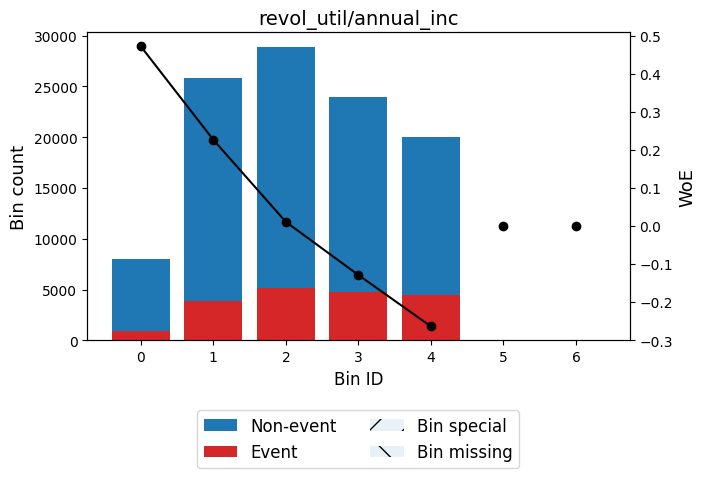

✅ Total IV for term: 0.2107
╒═══════════════╤═════════╤════════════════════╤════════════════════╤═══════════╕
│ Bin           │   Count │   Default Rate (%) │ WOE                │        IV │
╞═══════════════╪═════════╪════════════════════╪════════════════════╪═══════════╡
│ (-inf, 48.00) │   81050 │             0.1399 │ 0.3029836769818275 │ 0.0631612 │
├───────────────┼─────────┼────────────────────┼────────────────────┼───────────┤
│ [48.00, inf)  │   25609 │             0.3089 │ -0.707826361410975 │ 0.147556  │
├───────────────┼─────────┼────────────────────┼────────────────────┼───────────┤
│ Special       │       0 │             0      │ 0.0                │ 0         │
├───────────────┼─────────┼────────────────────┼────────────────────┼───────────┤
│ Missing       │       0 │             0      │ 0.0                │ 0         │
├───────────────┼─────────┼────────────────────┼────────────────────┼───────────┤
│               │  106659 │             0.1805 │                    │ 

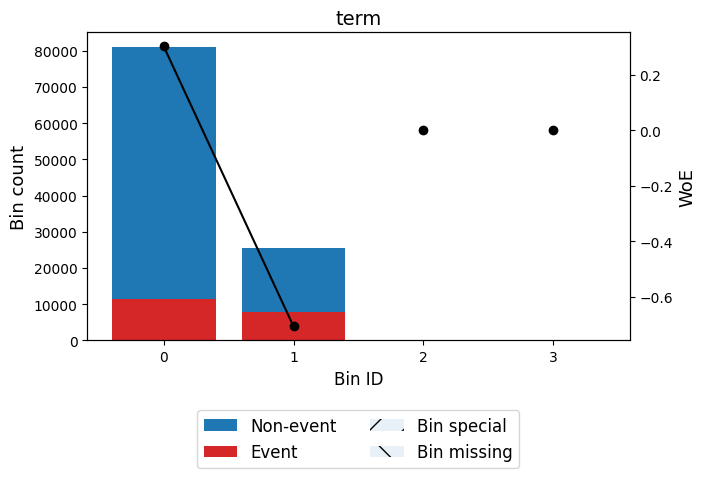

✅ Total IV for term_x_revol_util: 0.1251
╒════════════════════╤═════════╤════════════════════╤══════════════════════╤═════════════╕
│ Bin                │   Count │   Default Rate (%) │ WOE                  │          IV │
╞════════════════════╪═════════╪════════════════════╪══════════════════════╪═════════════╡
│ (-inf, 868.80)     │   12615 │             0.1239 │ 0.4429805514049565   │ 0.0200453   │
├────────────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [868.80, 2038.80)  │   37686 │             0.1492 │ 0.2280226287611855   │ 0.0170549   │
├────────────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [2038.80, 3107.40) │   34496 │             0.1765 │ 0.027127924826161776 │ 0.000235955 │
├────────────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [3107.40, 3609.00) │   10121 │             0.2148 │ -0.2167980939578491  │ 0.00477189  │
├────────────────────┼─────────┼─────────────────

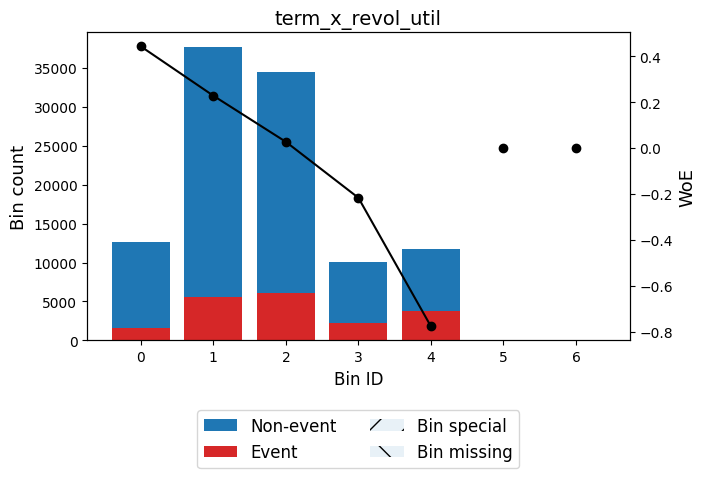

✅ Total IV for tl_op12m_x_inq6m: 0.0412
╒══════════════╤═════════╤════════════════════╤══════════════════════╤═════════════╕
│ Bin          │   Count │   Default Rate (%) │ WOE                  │          IV │
╞══════════════╪═════════╪════════════════════╪══════════════════════╪═════════════╡
│ (-inf, 1.50) │   70403 │             0.1619 │ 0.13084646656781307  │ 0.0108327   │
├──────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [1.50, 2.50) │   10086 │             0.1824 │ -0.01306114155305993 │ 1.61992e-05 │
├──────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [2.50, 4.50) │   12518 │             0.206  │ -0.16395911913021322 │ 0.00332164  │
├──────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [4.50, 6.50) │    5640 │             0.231  │ -0.31051023750635265 │ 0.00560996  │
├──────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [6.50, inf)  │    8012 

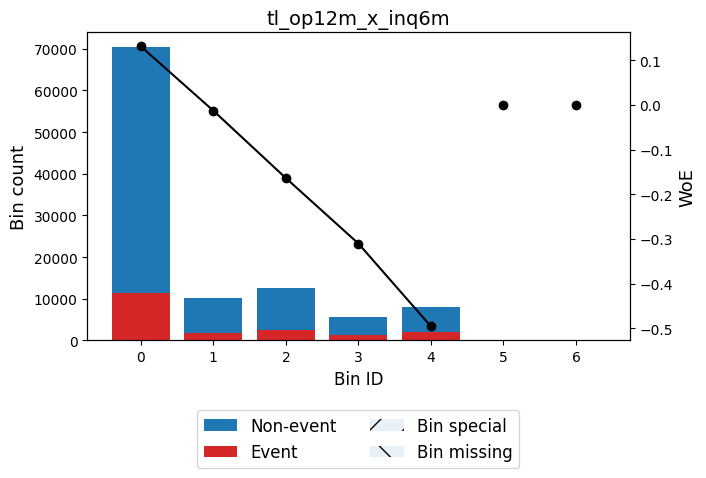

✅ Total IV for tot_cur_bal: 0.0290
╒═══════════════════════╤═════════╤════════════════════╤══════════════════════╤═════════════╕
│ Bin                   │   Count │   Default Rate (%) │ WOE                  │          IV │
╞═══════════════════════╪═════════╪════════════════════╪══════════════════════╪═════════════╡
│ (-inf, 13577.50)      │    9035 │             0.1604 │ 0.14240697571128802  │ 0.00164047  │
├───────────────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [13577.50, 37020.50)  │   21990 │             0.1996 │ -0.12445412925984778 │ 0.00332112  │
├───────────────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [37020.50, 76421.00)  │   17892 │             0.2202 │ -0.24858166036009277 │ 0.0111975   │
├───────────────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [76421.00, 240385.00) │   37454 │             0.1746 │ 0.040248186044145484 │ 0.000561547 │
├───────────────────────┼

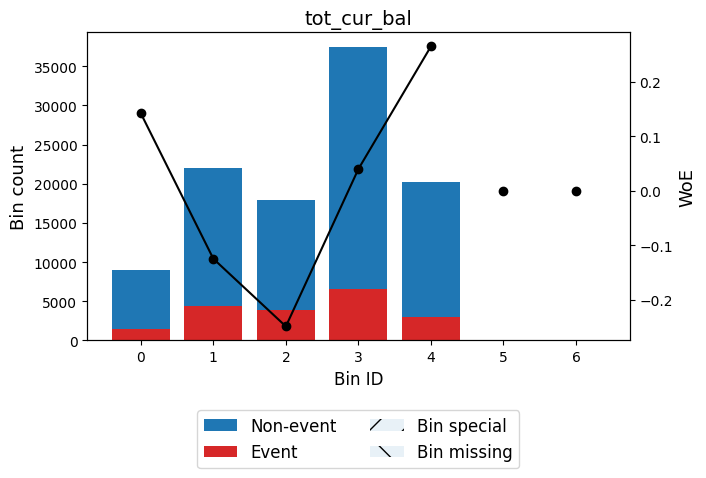

✅ Total IV for tot_hi_cred_lim: 0.0317
╒════════════════════════╤═════════╤════════════════════╤══════════════════════╤═════════════╕
│ Bin                    │   Count │   Default Rate (%) │ WOE                  │          IV │
╞════════════════════════╪═════════╪════════════════════╪══════════════════════╪═════════════╡
│ (-inf, 33122.00)       │   13562 │             0.1855 │ -0.03362577157607216 │ 0.000145318 │
├────────────────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [33122.00, 110956.00)  │   36313 │             0.211  │ -0.19410850392975187 │ 0.0136304   │
├────────────────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [110956.00, 225556.00) │   27919 │             0.1738 │ 0.04573879716379392  │ 0.00053963  │
├────────────────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [225556.00, 415353.50) │   20481 │             0.1525 │ 0.20223561270423773  │ 0.00735341  │
├──────────

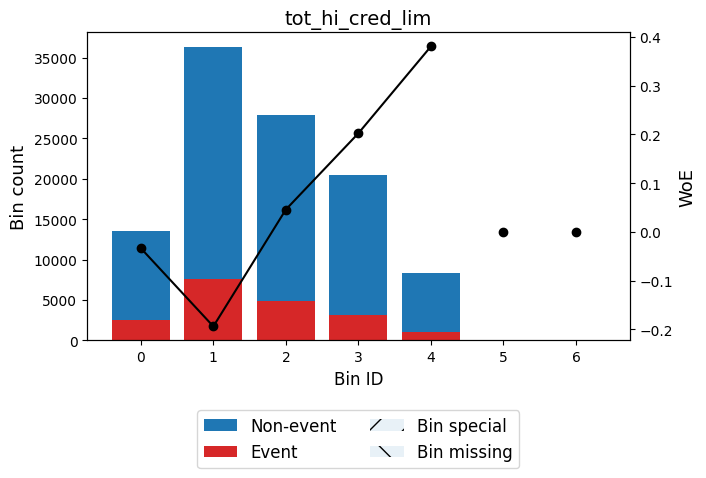

✅ Total IV for total_bc_limit: 0.0331
╒══════════════════════╤═════════╤════════════════════╤═══════════════════════╤═════════════╕
│ Bin                  │   Count │   Default Rate (%) │ WOE                   │          IV │
╞══════════════════════╪═════════╪════════════════════╪═══════════════════════╪═════════════╡
│ (-inf, 11386.50)     │   39850 │             0.2052 │ -0.1588845564616168   │ 0.00991424  │
├──────────────────────┼─────────┼────────────────────┼───────────────────────┼─────────────┤
│ [11386.50, 27550.00) │   41051 │             0.1803 │ 0.0012092997862986898 │ 5.62635e-07 │
├──────────────────────┼─────────┼────────────────────┼───────────────────────┼─────────────┤
│ [27550.00, 42405.00) │   13346 │             0.16   │ 0.14484751176924626   │ 0.00250497  │
├──────────────────────┼─────────┼────────────────────┼───────────────────────┼─────────────┤
│ [42405.00, 56100.50) │    5806 │             0.134  │ 0.3530272413148725    │ 0.00604024  │
├─────────────────────

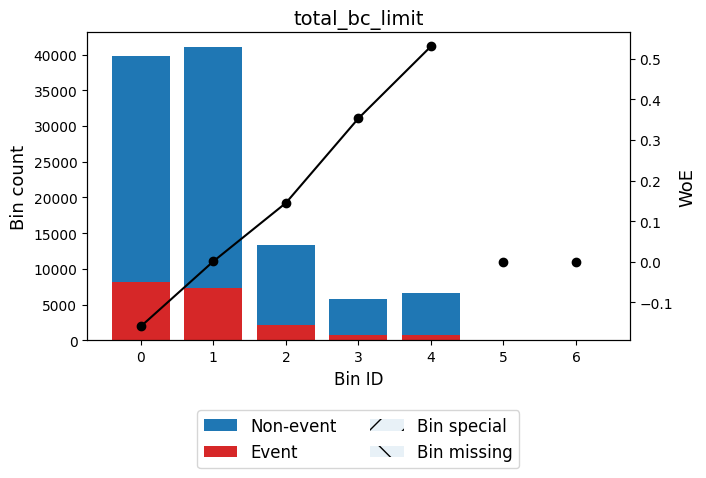

✅ Total IV for total_rev_hi_lim: 0.0212
╒══════════════════════╤═════════╤════════════════════╤══════════════════════╤═════════════╕
│ Bin                  │   Count │   Default Rate (%) │ WOE                  │          IV │
╞══════════════════════╪═════════╪════════════════════╪══════════════════════╪═════════════╡
│ (-inf, 19369.50)     │   39675 │             0.1973 │ -0.10978766769159454 │ 0.00464176  │
├──────────────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [19369.50, 23955.50) │   10635 │             0.1912 │ -0.07054160450153901 │ 0.000507396 │
├──────────────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [23955.50, 53290.00) │   41637 │             0.1778 │ 0.018638791587159753 │ 0.000134811 │
├──────────────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [53290.00, 79556.50) │    8926 │             0.1453 │ 0.2588790655569113   │ 0.00515356  │
├──────────────────────┼──────

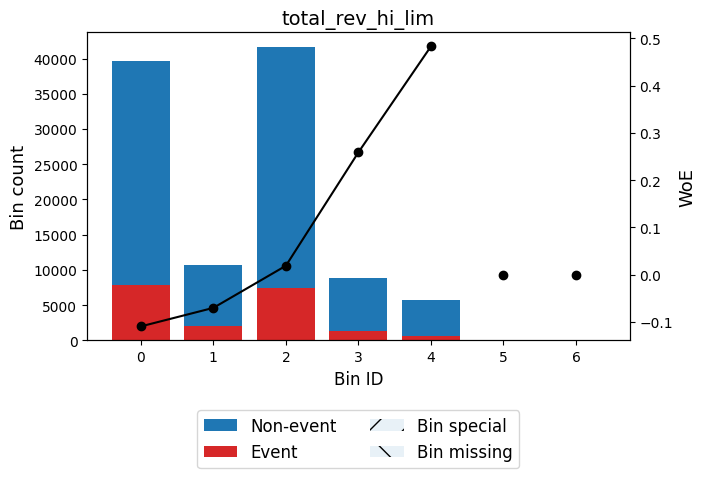

✅ Total IV for verification_status: 0.0560
╒═════════════════════╤═════════╤════════════════════╤═══════════════════════╤════════════╕
│ Bin                 │   Count │   Default Rate (%) │ WOE                   │         IV │
╞═════════════════════╪═════════╪════════════════════╪═══════════════════════╪════════════╡
│ ['Not Verified']    │   31381 │             0.1307 │ 0.3818991823484652    │ 0.0378354  │
├─────────────────────┼─────────┼────────────────────┼───────────────────────┼────────────┤
│ ['Source Verified'] │   41116 │             0.1894 │ -0.059210007208211124 │ 0.00137711 │
├─────────────────────┼─────────┼────────────────────┼───────────────────────┼────────────┤
│ ['Verified']        │   34162 │             0.2155 │ -0.22095355165689212  │ 0.0167513  │
├─────────────────────┼─────────┼────────────────────┼───────────────────────┼────────────┤
│ Special             │       0 │             0      │ 0.0                   │ 0          │
├─────────────────────┼─────────┼────

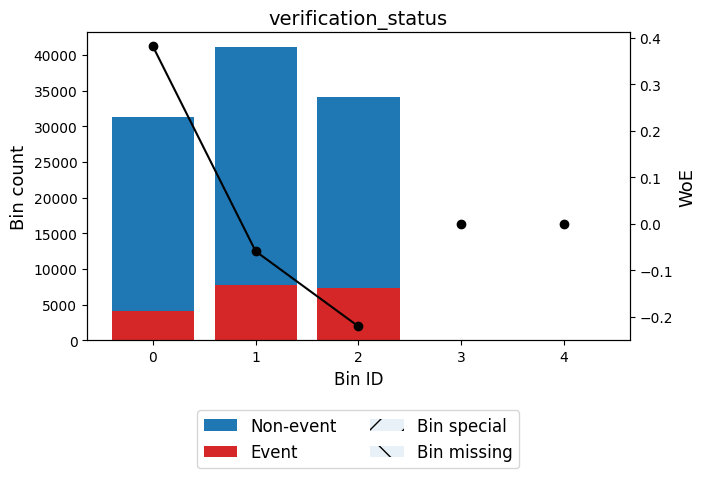

In [30]:
# == Observe WoE & IV of train_pdf1 ==
for feature in sorted(train_pdf1.columns):
    excluded_columns = ["id", "issue_d", "default_status"]
    x, y = train_pdf1[feature], train_pdf1[TARGET_COL]

    if feature in excluded_columns:
        continue

    if train_pdf1[feature].dtype == "object":
        bin_and_classify_feature(
            feature=feature,
            x=x,
            y=y,
            monotonic_trend_type="auto",
            dtype="categorical",
            max_n_bins=5,
        )
    else:
        bin_and_classify_feature(
            feature=feature, x=x, y=y, monotonic_trend_type="auto", max_n_bins=5
        )

✅ Total IV for tot_cur_bal: 0.0290
╒═══════════════════════╤═════════╤════════════════════╤══════════════════════╤═════════════╕
│ Bin                   │   Count │   Default Rate (%) │ WOE                  │          IV │
╞═══════════════════════╪═════════╪════════════════════╪══════════════════════╪═════════════╡
│ (-inf, 13577.50)      │    9035 │             0.1604 │ 0.14240697571128802  │ 0.00164047  │
├───────────────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [13577.50, 37020.50)  │   21990 │             0.1996 │ -0.12445412925984778 │ 0.00332112  │
├───────────────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [37020.50, 76421.00)  │   17892 │             0.2202 │ -0.24858166036009277 │ 0.0111975   │
├───────────────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [76421.00, 240385.00) │   37454 │             0.1746 │ 0.040248186044145484 │ 0.000561547 │
├───────────────────────┼

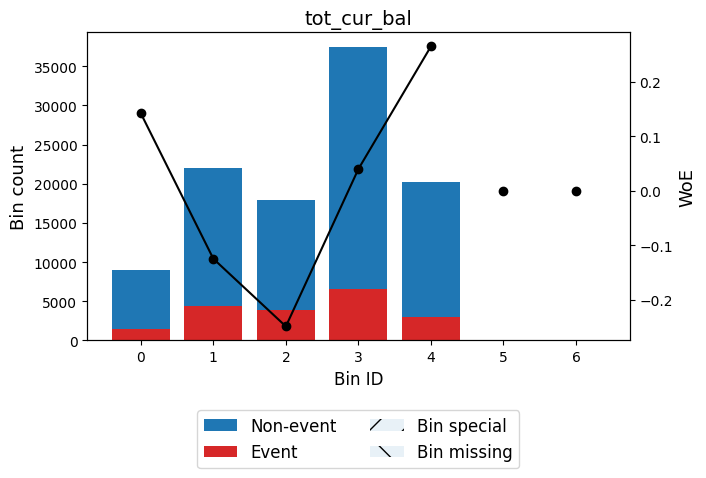

✅ Total IV for tot_hi_cred_lim: 0.0317
╒════════════════════════╤═════════╤════════════════════╤══════════════════════╤═════════════╕
│ Bin                    │   Count │   Default Rate (%) │ WOE                  │          IV │
╞════════════════════════╪═════════╪════════════════════╪══════════════════════╪═════════════╡
│ (-inf, 33122.00)       │   13562 │             0.1855 │ -0.03362577157607216 │ 0.000145318 │
├────────────────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [33122.00, 110956.00)  │   36313 │             0.211  │ -0.19410850392975187 │ 0.0136304   │
├────────────────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [110956.00, 225556.00) │   27919 │             0.1738 │ 0.04573879716379392  │ 0.00053963  │
├────────────────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [225556.00, 415353.50) │   20481 │             0.1525 │ 0.20223561270423773  │ 0.00735341  │
├──────────

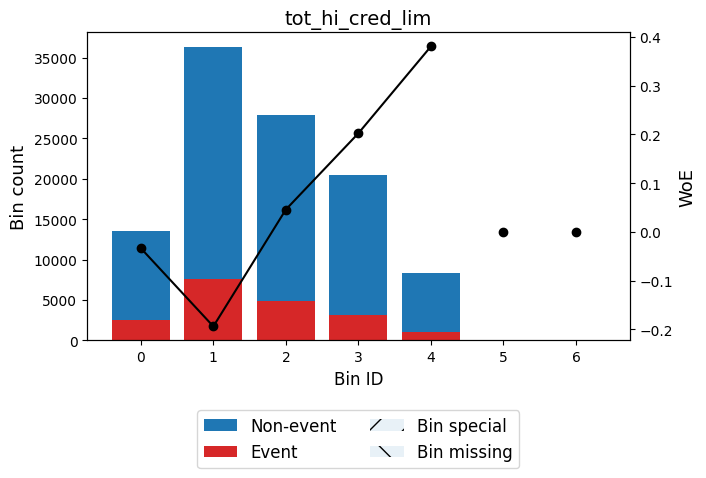

✅ Total IV for fico_score/inq_last_6mths: 0.0539
╒══════════════════╤═════════╤════════════════════╤══════════════════════╤═════════════╕
│ Bin              │   Count │   Default Rate (%) │ WOE                  │          IV │
╞══════════════════╪═════════╪════════════════════╪══════════════════════╪═════════════╡
│ (-inf, 111.58)   │   60568 │             0.1612 │ 0.13612703941334536  │ 0.0100694   │
├──────────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [111.58, 342.25) │   11403 │             0.2474 │ -0.40044824966740045 │ 0.0193635   │
├──────────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [342.25, 684.50) │   18736 │             0.2184 │ -0.23802695704826426 │ 0.010717    │
├──────────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [684.50, 709.50) │    8695 │             0.1952 │ -0.0962613965234671  │ 0.000778749 │
├──────────────────┼─────────┼────────────────────┼──────────

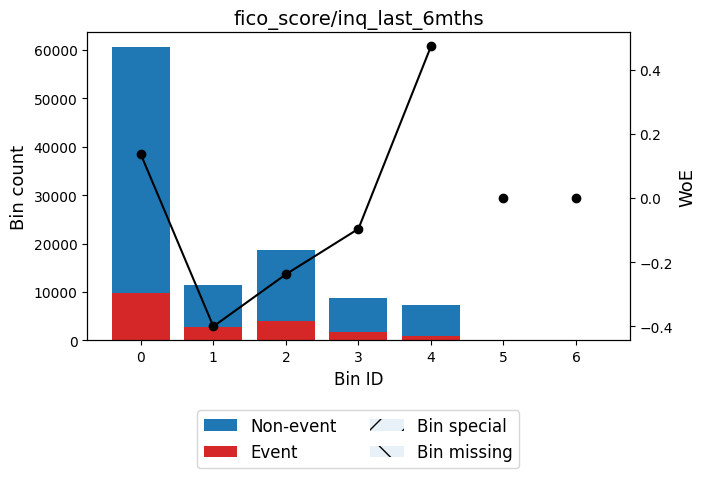

In [31]:
# == Inspect Non Monotonic Features to handle later on ==

non_monotonic_features = ["tot_cur_bal", "tot_hi_cred_lim", "fico_score/inq_last_6mths"]

for feature in non_monotonic_features:
    bin_and_classify_feature(feature, x=train_pdf1[feature], y=train_pdf1[TARGET_COL])

For these non-monotonic features, we shall attempt to enforce a strict monotonic trend constraint on WoE. If IV drops severely, the feature shall be dropped.


✅ Total IV for tot_cur_bal: 0.0215
╒════════════════════════╤═════════╤════════════════════╤════════════════════════╤════════════╕
│ Bin                    │   Count │   Default Rate (%) │ WOE                    │         IV │
╞════════════════════════╪═════════╪════════════════════╪════════════════════════╪════════════╡
│ (-inf, 76421.00)       │   48917 │             0.1999 │ -0.12616717150499834   │ 0.0075967  │
├────────────────────────┼─────────┼────────────────────┼────────────────────────┼────────────┤
│ [76421.00, 140002.00)  │   19703 │             0.1806 │ -0.0009549471336764981 │ 1.6851e-07 │
├────────────────────────┼─────────┼────────────────────┼────────────────────────┼────────────┤
│ [140002.00, 240385.00) │   17751 │             0.1679 │ 0.08731547763048009    │ 0.00123364 │
├────────────────────────┼─────────┼────────────────────┼────────────────────────┼────────────┤
│ [240385.00, 362012.00) │   12068 │             0.1492 │ 0.22822179388990071    │ 0.00547058 │
├────

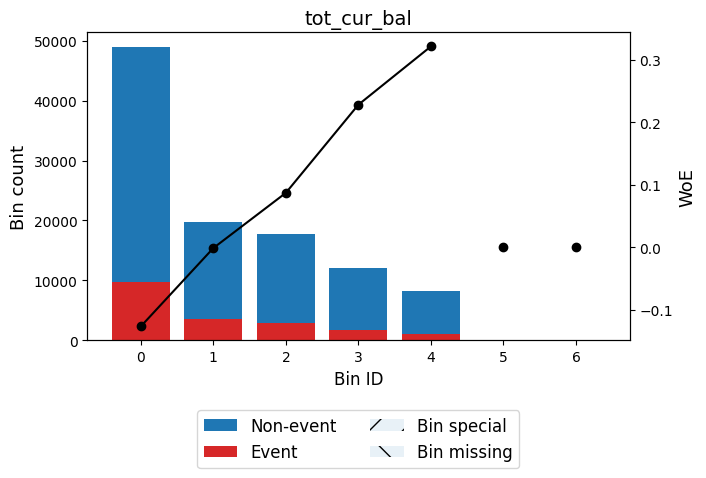

✅ Total IV for tot_hi_cred_lim: 0.0298
╒════════════════════════╤═════════╤════════════════════╤══════════════════════╤════════════╕
│ Bin                    │   Count │   Default Rate (%) │ WOE                  │         IV │
╞════════════════════════╪═════════╪════════════════════╪══════════════════════╪════════════╡
│ (-inf, 110956.00)      │   49875 │             0.2041 │ -0.15197671429631066 │ 0.0113287  │
├────────────────────────┼─────────┼────────────────────┼──────────────────────┼────────────┤
│ [110956.00, 225556.00) │   27919 │             0.1738 │ 0.04573879716379392  │ 0.00053963 │
├────────────────────────┼─────────┼────────────────────┼──────────────────────┼────────────┤
│ [225556.00, 302284.50) │   10853 │             0.1591 │ 0.15171787912379542  │ 0.00222984 │
├────────────────────────┼─────────┼────────────────────┼──────────────────────┼────────────┤
│ [302284.50, 415353.50) │    9628 │             0.145  │ 0.26139418997469366  │ 0.00566266 │
├────────────────────

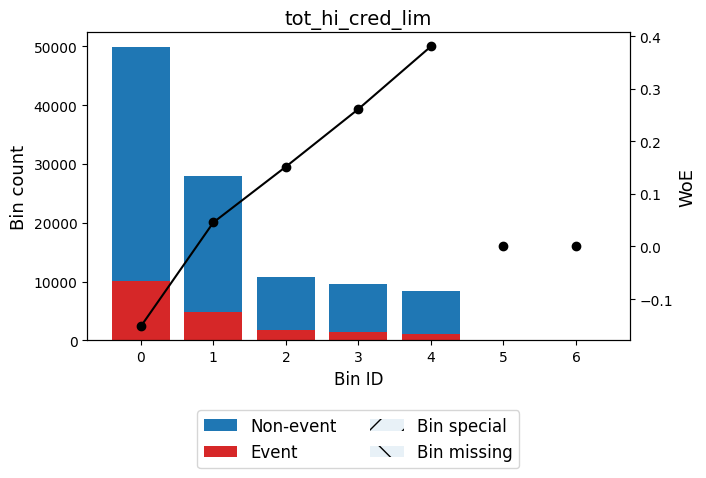

✅ Total IV for fico_score/inq_last_6mths: 0.0138
╒════════════════╤═════════╤════════════════════╤═══════════════════════╤═════════════╕
│ Bin            │   Count │   Default Rate (%) │ WOE                   │          IV │
╞════════════════╪═════════╪════════════════════╪═══════════════════════╪═════════════╡
│ (-inf, 709.50) │   99402 │             0.1849 │ -0.029232416853215204 │ 0.000803843 │
├────────────────┼─────────┼────────────────────┼───────────────────────┼─────────────┤
│ [709.50, inf)  │    7257 │             0.1207 │ 0.4726902087150813    │ 0.0129982   │
├────────────────┼─────────┼────────────────────┼───────────────────────┼─────────────┤
│ Special        │       0 │             0      │ 0.0                   │ 0           │
├────────────────┼─────────┼────────────────────┼───────────────────────┼─────────────┤
│ Missing        │       0 │             0      │ 0.0                   │ 0           │
├────────────────┼─────────┼────────────────────┼──────────────────────

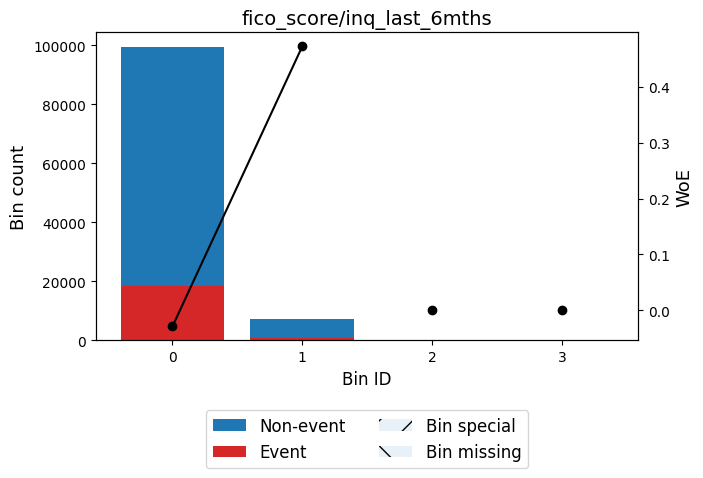

In [32]:
# == Inspect forced WoE monotonicity constraint ==
for non_mono in ["tot_cur_bal", "tot_hi_cred_lim", "fico_score/inq_last_6mths"]:
    bin_and_classify_feature(
        non_mono,
        train_pdf1[non_mono],
        train_pdf1[TARGET_COL],
        monotonic_trend_type="auto_asc_desc",
    )

As seen, enforcing monotonicity constraint caused `fico_score/inq_last_6mths` resulted in a drop of 0.04 in IV. This variable should be dropped, since monotonicity constraint is important for Logistic Regression.


In [33]:
train_pdf1 = train_pdf1.drop("fico_score/inq_last_6mths", axis=1)
train_pdf1 = train_pdf1.drop("fico_score/inq_last_6mths_invalid", axis=1)

assert ("fico_score/inq_last_6mths" not in train_pdf1.columns) and (
    "fico_score/inq_last_6mths_invalid" not in train_pdf1.columns
)

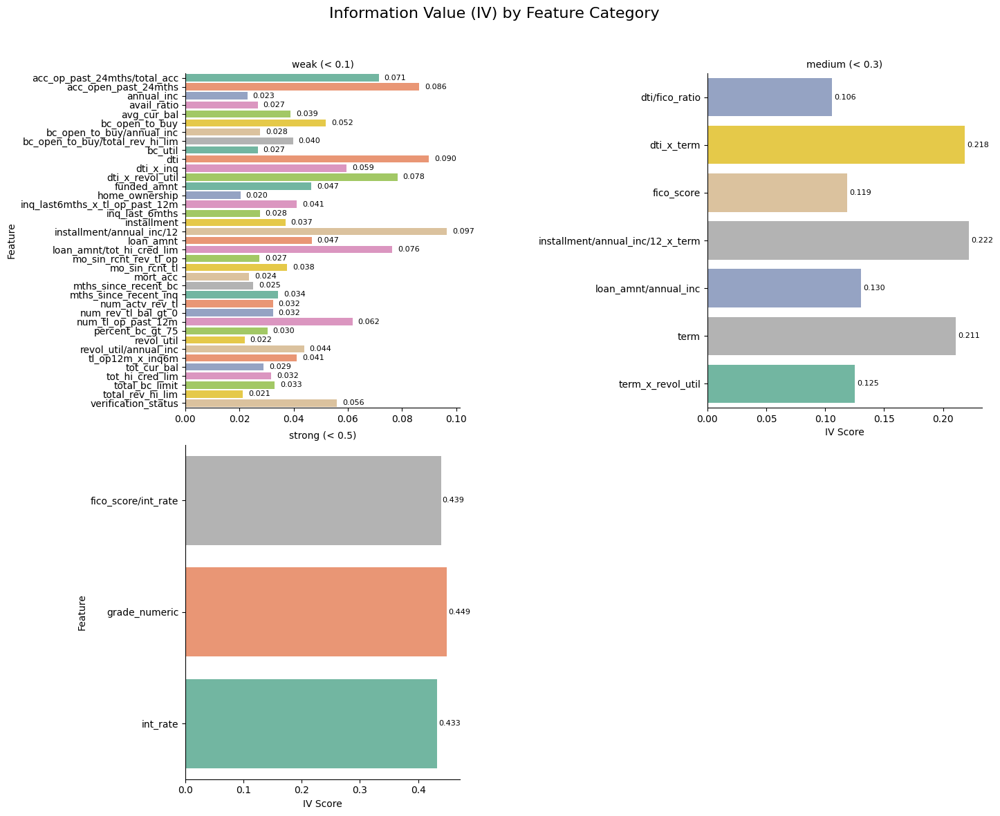

In [34]:
updated_iv_categories = get_updated_iv_categories(updated_iv_categories, train_pdf1)
plot_iv_by_category(updated_iv_categories)

In [35]:
# == Before WoE Binning Transformation ==
train_pdf1.head()

,id,loan_amnt,funded_amnt,term,int_rate,installment,home_ownership,annual_inc,verification_status,issue_d,...,dti_x_inq,dti_x_term,term_x_revol_util,dti/fico_ratio,loan_amnt/tot_hi_cred_lim,bc_open_to_buy/total_rev_hi_lim,fico_score/int_rate,installment/annual_inc/12,installment/annual_inc/12_x_term,grade_numeric
0,101579,10000.0,10000.0,36,10.28,323.98,RENT,27376.0,Not Verified,2007-07-01,...,0.00,385.20,1958.4,0.015028,0.089954,0.19425,69.260700,0.142013,5.112484,3
1,93277,3000.0,3000.0,36,8.70,94.98,MORTGAGE,25000.0,Not Verified,2007-07-01,...,14.54,523.44,280.8,0.019335,0.026986,0.19425,86.436782,0.045590,1.641254,2
2,98339,5100.0,5100.0,36,8.38,160.72,RENT,32000.0,Not Verified,2007-07-01,...,0.00,532.08,860.4,0.019145,0.045877,0.19425,92.124105,0.060270,2.169720,1
3,118533,2500.0,2500.0,36,9.64,80.26,MORTGAGE,75000.0,Not Verified,2007-08-01,...,60.00,720.00,136.8,0.025907,0.022488,0.19425,80.082988,0.012842,0.462298,2
4,88854,5000.0,5000.0,36,7.43,155.38,RENT,200000.0,Not Verified,2007-08-01,...,0.00,10.08,493.2,0.000363,0.044977,0.19425,103.903096,0.009323,0.335621,1


In [36]:
# == Ensure Same Columns between train_df and test_df (Drop `grade`) ==

# == 1. Add grade_numeric, drop grade column
test_pdf1 = tx_grade(test_pdf1)

# = 2. Select only columns train_pdf1 has ==
test_pdf1 = test_pdf1[train_pdf1.columns]
test_pdf1.head()

,id,loan_amnt,funded_amnt,term,int_rate,installment,home_ownership,annual_inc,verification_status,issue_d,...,dti_x_inq,dti_x_term,term_x_revol_util,dti/fico_ratio,loan_amnt/tot_hi_cred_lim,bc_open_to_buy/total_rev_hi_lim,fico_score/int_rate,installment/annual_inc/12,installment/annual_inc/12_x_term,grade_numeric
107899,94447013,19200.0,19200.0,60,17.99,487.45,MORTGAGE,45000.0,Source Verified,2016-12-01,...,23.79,1427.40,1944.0,0.034379,0.108540,0.545009,38.465814,0.129987,7.799200,4
107900,95638359,6000.0,6000.0,36,12.74,201.42,OWN,20000.0,Source Verified,2016-12-01,...,0.00,868.68,1288.8,0.035124,0.241935,0.153462,53.924647,0.120852,4.350672,3
107901,92588591,7200.0,7200.0,36,11.44,237.23,MORTGAGE,30000.0,Source Verified,2016-12-01,...,0.00,1026.72,673.2,0.037428,0.081675,0.674418,66.608392,0.094892,3.416112,2
107902,93892389,15000.0,15000.0,36,17.99,542.22,RENT,50000.0,Not Verified,2016-12-01,...,0.00,328.32,1346.4,0.013372,0.688073,0.484633,37.909950,0.130133,4.684781,4
107903,94363068,15000.0,15000.0,36,12.74,503.54,MORTGAGE,80080.0,Source Verified,2016-12-01,...,14.24,512.64,1746.0,0.021034,0.077193,0.230397,53.139717,0.075456,2.716400,3


In [37]:
# == Check column discrepancies ==
set(test_pdf1.columns) - set(train_pdf1.columns)

set()

In [38]:
# == 1. WoE binning Transformation on train_df ==
non_monotonic_cols = ["tot_cur_bal", "tot_hi_cred_lim"]

# == 2. Transform Train Dataset ==
train_pdf1, optb_dict = woe_bin_transform_train(
    train_pdf1, non_monotonic_features, TARGET_COL
)

train_pdf1.head()

,id,issue_d,default_status,loan_amnt_woe,funded_amnt_woe,term_woe,int_rate_woe,installment_woe,home_ownership_woe,annual_inc_woe,...,dti_x_inq_woe,dti_x_term_woe,term_x_revol_util_woe,dti/fico_ratio_woe,loan_amnt/tot_hi_cred_lim_woe,bc_open_to_buy/total_rev_hi_lim_woe,fico_score/int_rate_woe,installment/annual_inc/12_woe,installment/annual_inc/12_x_term_woe,grade_numeric_woe
0,101579,2007-07-01,0,0.167128,0.165953,0.302984,0.398021,0.042477,-0.152828,-0.156797,...,0.152716,0.515767,0.228023,0.446235,0.020091,0.077022,0.322934,-0.372756,-0.453375,-0.137559
1,93277,2007-07-01,0,0.321775,0.322027,0.302984,1.011332,0.380761,0.147222,-0.156797,...,0.152716,0.515767,0.442981,0.144928,0.572371,0.077022,0.924863,0.254202,0.520632,0.483962
2,98339,2007-07-01,0,0.321775,0.322027,0.302984,1.011332,0.380761,-0.152828,-0.156797,...,0.152716,0.515767,0.442981,0.144928,0.279811,0.077022,0.924863,0.254202,0.520632,1.289755
3,118533,2007-08-01,1,0.321775,0.322027,0.302984,0.398021,0.380761,0.147222,0.021940,...,-0.634051,0.166625,0.442981,0.144928,0.572371,0.077022,0.924863,0.510586,0.520632,0.483962
4,88854,2007-08-01,0,0.321775,0.322027,0.302984,1.011332,0.380761,-0.152828,0.262563,...,0.152716,0.515767,0.442981,0.446235,0.279811,0.077022,1.698471,0.510586,0.520632,1.289755


In [39]:
# == Transform Test Dataset ==
test_pdf1 = apply_woe_transform(test_pdf1, optb_dict)
test_pdf1.head()

,id,issue_d,default_status,loan_amnt_woe,funded_amnt_woe,term_woe,int_rate_woe,installment_woe,home_ownership_woe,annual_inc_woe,...,dti_x_inq_woe,dti_x_term_woe,term_x_revol_util_woe,dti/fico_ratio_woe,loan_amnt/tot_hi_cred_lim_woe,bc_open_to_buy/total_rev_hi_lim_woe,fico_score/int_rate_woe,installment/annual_inc/12_woe,installment/annual_inc/12_x_term_woe,grade_numeric_woe
107899,94447013,2016-12-01,1,-0.188964,-0.189190,-0.707826,-0.897960,-0.089293,0.147222,-0.156797,...,-0.073237,-0.597628,0.228023,-0.111770,-0.111925,0.330249,-0.893397,-0.372756,-1.069016,-0.559071
107900,95638359,2016-12-01,0,0.321775,0.322027,0.302984,-0.221322,0.380761,-0.057545,-0.156797,...,0.152716,-0.212221,0.228023,-0.111770,-0.293541,-0.111153,-0.223992,-0.372756,-0.082614,-0.137559
107901,92588591,2016-12-01,0,0.321775,0.322027,0.302984,0.398021,0.208138,0.147222,-0.156797,...,0.152716,-0.212221,0.442981,-0.387761,0.020091,0.330249,0.322934,-0.110724,0.163386,0.483962
107902,93892389,2016-12-01,1,-0.049743,-0.049864,0.302984,-0.897960,-0.162368,-0.152828,-0.067416,...,0.152716,0.515767,0.228023,0.446235,-0.293541,0.077022,-0.893397,-0.372756,-0.453375,-0.559071
107903,94363068,2016-12-01,0,-0.049743,-0.049864,0.302984,-0.221322,-0.162368,0.147222,0.021940,...,0.152716,0.515767,0.228023,0.144928,0.020091,0.077022,-0.223992,-0.110724,0.163386,-0.137559


In [40]:
# == Evaluate Model Performance upon WoE Transformation ==
run_model_checkpoint(
    train_pdf1,
    test_pdf1,
    run_name="log_reg_woe_transformation",
    model_type="Logistic Regression",
    run_group=NOTEBOOK_RUN_NAME,
)


✅ Best F1 Score = 0.4110 at threshold = 0.50

📄 Classification Report (Optimized Threshold):
              precision    recall  f1-score   support

 Non-Default     0.8822    0.6527    0.7503     19166
     Default     0.3038    0.6349    0.4109      4574

    accuracy                         0.6493     23740
   macro avg     0.5930    0.6438    0.5806     23740
weighted avg     0.7708    0.6493    0.6849     23740



Accuracy,▁
Best Threshold,▁
F1 Score,▁
Gini,▁
Precision,▁
Recall,▁
Accuracy,0.64928
Best Threshold,0.49819
F1 Score,0.41092
Gini,0.39593
Model Type,Logistic Regression


In [41]:
train_pdf2 = train_pdf1
test_pdf2 = test_pdf1

# 3. A/B Testing (Interaction Feature Selection)


In [42]:
# = Find base vs interaction features ==
excluded_columns = ["id", "default_status", "issue_d"]
base_feats = sorted(
    [
        col
        for col in train_pdf2.columns
        if "_x_" not in col
        and "/" not in col
        and col != "avail_ratio_woe"
        and col not in excluded_columns
    ]
)

interaction_features = sorted(
    [
        feature
        for feature in train_pdf2.columns
        if feature not in base_feats and feature not in excluded_columns
    ]
)


interaction_features

['acc_op_past_24mths/total_acc_woe',
 'avail_ratio_woe',
 'bc_open_to_buy/annual_inc_woe',
 'bc_open_to_buy/total_rev_hi_lim_woe',
 'dti/fico_ratio_woe',
 'dti_x_inq_woe',
 'dti_x_revol_util_woe',
 'dti_x_term_woe',
 'fico_score/int_rate_woe',
 'inq_last6mths_x_tl_op_past_12m_woe',
 'installment/annual_inc/12_woe',
 'installment/annual_inc/12_x_term_woe',
 'loan_amnt/annual_inc_woe',
 'loan_amnt/tot_hi_cred_lim_woe',
 'revol_util/annual_inc_woe',
 'term_x_revol_util_woe',
 'tl_op12m_x_inq6m_woe']

In [43]:
from sklearn.metrics import roc_auc_score

METRIC = "gini"  # "auc" or "gini"
THRESH_GINI = 0.0015  # same but for Gini


# == WoE transformed variables are already scaled in log odds ==
def score(train_df, test_df, features):
    X_tr = train_df[features]
    y_tr = train_df[TARGET_COL]
    X_te = test_df[features]
    y_te = test_df[TARGET_COL]
    model = LogisticRegression(solver="lbfgs", C=1.0, max_iter=1000, penalty="l2")
    model.fit(X_tr, y_tr)
    auc = roc_auc_score(y_te, model.predict_proba(X_te)[:, 1])
    return 2 * auc - 1


def pick_interactions(train_df, test_df, base_features, interaction_features):
    base_score = score(train_df, test_df, base_features)
    print(f"Base {METRIC.upper()}: {base_score:.4f}")
    keep = []
    for f in interaction_features:
        s = score(train_df, test_df, base_features + [f])
        delta = s - base_score
        need = THRESH_GINI
        print(f"{f:40s} -> {METRIC.upper()}: {s:.4f}  Δ={delta:+.4f}")
        if delta >= need:
            keep.append(f)

    return base_features + keep


# ==== example usage ====


final_feats = pick_interactions(train_pdf2, test_pdf2, base_feats, interaction_features)

Base GINI: 0.3930
acc_op_past_24mths/total_acc_woe         -> GINI: 0.3939  Δ=+0.0009
avail_ratio_woe                          -> GINI: 0.3931  Δ=+0.0001
bc_open_to_buy/annual_inc_woe            -> GINI: 0.3928  Δ=-0.0002
bc_open_to_buy/total_rev_hi_lim_woe      -> GINI: 0.3930  Δ=-0.0001
dti/fico_ratio_woe                       -> GINI: 0.3932  Δ=+0.0002
dti_x_inq_woe                            -> GINI: 0.3932  Δ=+0.0002
dti_x_revol_util_woe                     -> GINI: 0.3930  Δ=+0.0000
dti_x_term_woe                           -> GINI: 0.3928  Δ=-0.0002
fico_score/int_rate_woe                  -> GINI: 0.3938  Δ=+0.0008
inq_last6mths_x_tl_op_past_12m_woe       -> GINI: 0.3930  Δ=+0.0000
installment/annual_inc/12_woe            -> GINI: 0.3954  Δ=+0.0024
installment/annual_inc/12_x_term_woe     -> GINI: 0.3953  Δ=+0.0023
loan_amnt/annual_inc_woe                 -> GINI: 0.3949  Δ=+0.0019
loan_amnt/tot_hi_cred_lim_woe            -> GINI: 0.3933  Δ=+0.0003
revol_util/annual_inc_woe     

In [44]:
sorted(final_feats)

['acc_open_past_24mths_woe',
 'annual_inc_woe',
 'avg_cur_bal_woe',
 'bc_open_to_buy_woe',
 'bc_util_woe',
 'dti_woe',
 'fico_score_woe',
 'funded_amnt_woe',
 'grade_numeric_woe',
 'home_ownership_woe',
 'inq_last_6mths_woe',
 'installment/annual_inc/12_woe',
 'installment/annual_inc/12_x_term_woe',
 'installment_woe',
 'int_rate_woe',
 'loan_amnt/annual_inc_woe',
 'loan_amnt_woe',
 'mo_sin_rcnt_rev_tl_op_woe',
 'mo_sin_rcnt_tl_woe',
 'mort_acc_woe',
 'mths_since_recent_bc_woe',
 'mths_since_recent_inq_woe',
 'num_actv_rev_tl_woe',
 'num_rev_tl_bal_gt_0_woe',
 'num_tl_op_past_12m_woe',
 'percent_bc_gt_75_woe',
 'revol_util_woe',
 'term_woe',
 'tot_cur_bal_woe',
 'tot_hi_cred_lim_woe',
 'total_bc_limit_woe',
 'total_rev_hi_lim_woe',
 'verification_status_woe']

In [45]:
train_pdf2 = train_pdf2[final_feats + excluded_columns]

In [46]:
run_model_checkpoint(
    train_pdf2, test_pdf2, "log_reg_ab_test", "Logistic Regression", NOTEBOOK_RUN_NAME
)


✅ Best F1 Score = 0.4111 at threshold = 0.50

📄 Classification Report (Optimized Threshold):
              precision    recall  f1-score   support

 Non-Default     0.8821    0.6540    0.7511     19166
     Default     0.3042    0.6338    0.4111      4574

    accuracy                         0.6501     23740
   macro avg     0.5932    0.6439    0.5811     23740
weighted avg     0.7708    0.6501    0.6856     23740



Accuracy,▁
Best Threshold,▁
F1 Score,▁
Gini,▁
Precision,▁
Recall,▁
Accuracy,0.65013
Best Threshold,0.49963
F1 Score,0.41109
Gini,0.39568
Model Type,Logistic Regression


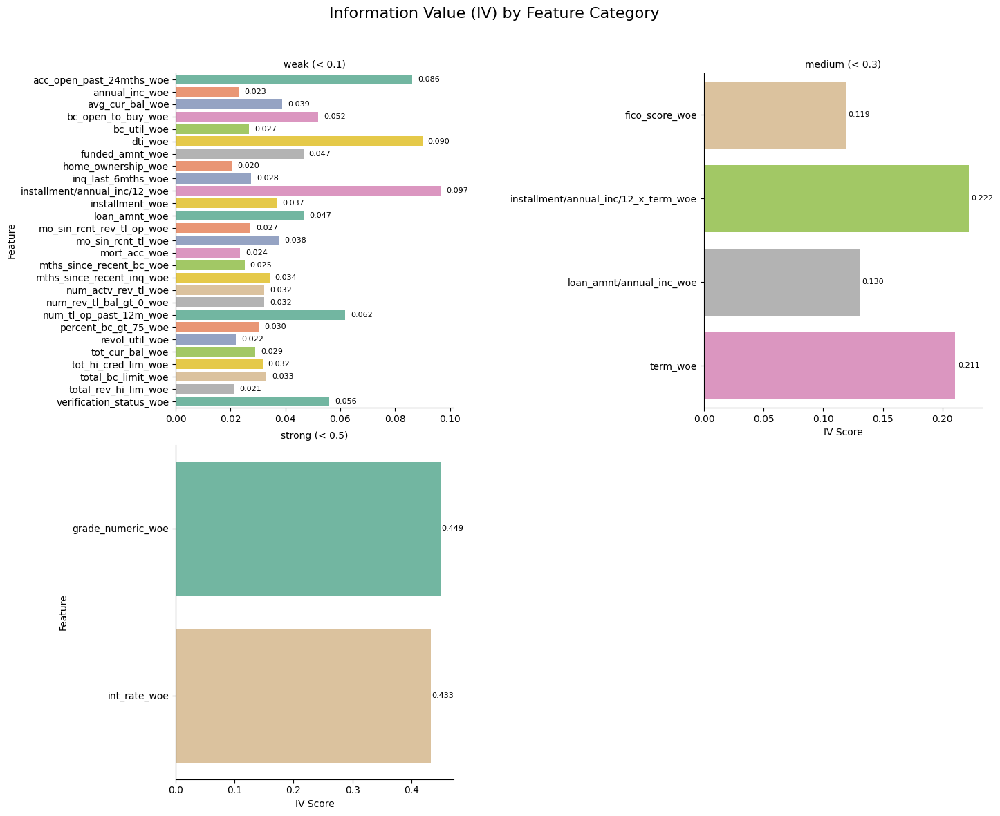

In [47]:
# == Obtain IV scores of each feature currently in train_pdf2 ==
updated_iv_categories_woe = {
    bucket: [
        (f"{feat}_woe", iv) for feat, iv in feats if f"{feat}_woe" in train_pdf2.columns
    ]
    for bucket, feats in updated_iv_categories.items()
}

plot_iv_by_category(updated_iv_categories_woe)

# 4. Multicollinearity Handling & Final Model

Now, we will be identifying features which has high Variance Inflation Factor. For such features, we will find the cluster of features it has high correlation to (high similarity to), and then keep the one with highest IV / easier to interpret.


In [48]:
numeric_cols2 = [
    feature for feature in train_pdf2.columns if feature not in excluded_columns
]
keep_cols, drop_cols = calculate_vif_pandas(train_pdf2, numeric_cols2)


print("✅ Features to Keep (VIF <= 5.0):")
for feature, vif in sorted(keep_cols):
    print(f" - {feature}: {vif}")

print("\n❌ Features to Drop (VIF > 5.0):")
for feature, vif in sorted(drop_cols):
    print(f" - {feature}: {vif}")

✅ Features to Keep (VIF <= 5.0):
 - acc_open_past_24mths_woe: 2.2425267571685255
 - annual_inc_woe: 3.2510404311956878
 - avg_cur_bal_woe: 3.325194215654536
 - bc_util_woe: 4.156091893365064
 - dti_woe: 1.3662602097331615
 - fico_score_woe: 1.8841474834455236
 - home_ownership_woe: 1.773393912686166
 - inq_last_6mths_woe: 1.5163345375254444
 - mo_sin_rcnt_rev_tl_op_woe: 2.4830764180601346
 - mo_sin_rcnt_tl_woe: 2.474446290145286
 - mort_acc_woe: 1.937237830120773
 - mths_since_recent_bc_woe: 1.7979713134732416
 - mths_since_recent_inq_woe: 1.4752927883897848
 - num_tl_op_past_12m_woe: 2.9479396314727873
 - percent_bc_gt_75_woe: 2.8325631220262464
 - revol_util_woe: 2.482938854956541
 - term_woe: 2.4746888893771986
 - total_bc_limit_woe: 4.753876063031287
 - total_rev_hi_lim_woe: 3.3983800522870307
 - verification_status_woe: 1.1310286354603651

❌ Features to Drop (VIF > 5.0):
 - bc_open_to_buy_woe: 5.09159971804691
 - funded_amnt_woe: 1398.2187223448916
 - grade_numeric_woe: 7.34869352

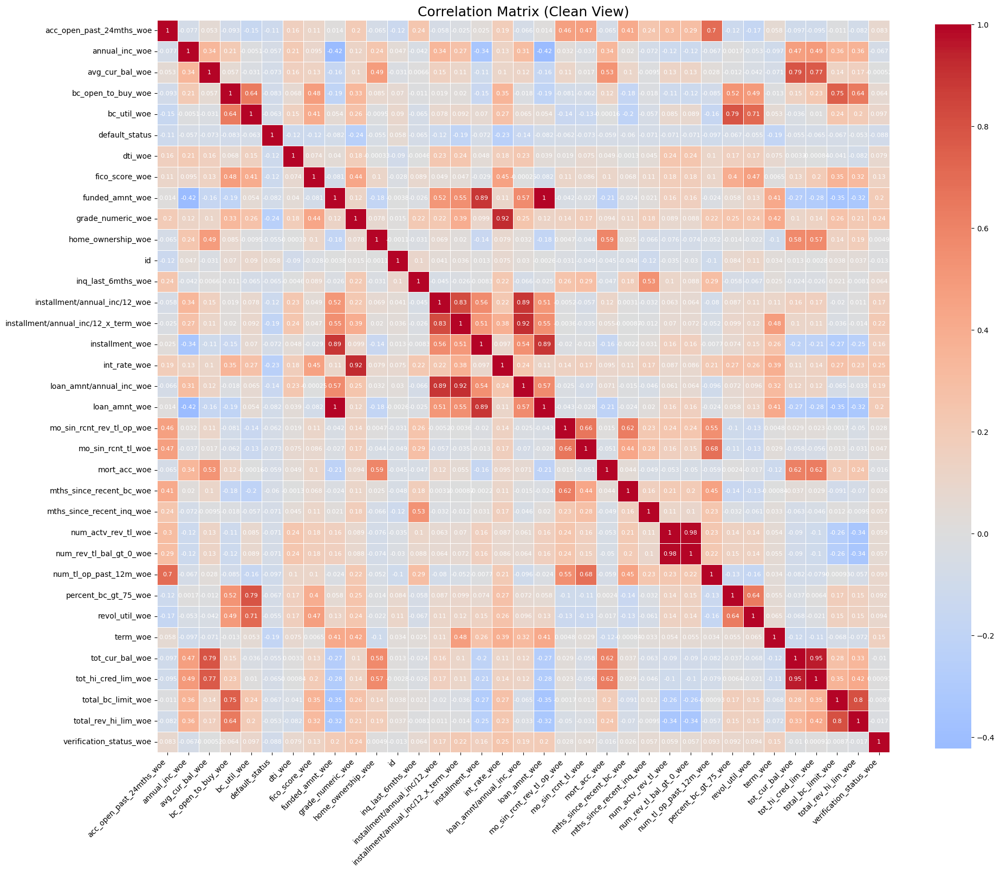

In [49]:
# == Check Correlation Matrix ==
threshold = 0.5
corr_matrix = train_pdf2.corr(numeric_only=True)
corr_matrix = corr_matrix.sort_index(axis=0).sort_index(axis=1)


plt.figure(figsize=(20, 20))

sns.heatmap(
    corr_matrix,
    cmap="coolwarm",
    center=0,
    square=True,
    linewidths=0.5,
    annot_kws={"size": 8, "color": "white"},
    cbar_kws={"shrink": 0.7},
    annot=True,
)

plt.title("Correlation Matrix (Clean View)", fontsize=18)
plt.xticks(rotation=45, ha="right", fontsize=10)
plt.yticks(fontsize=10)
plt.tight_layout()
plt.show()

In [50]:
# ========= Helper: turn updated_iv_categories_woe into simple lookups =========
def _flatten_iv_dict(iv_dict):
    """Return:
    - iv_lookup:  {feature -> IV}
    - cat_lookup: {feature -> IV category (if available)}
    Accepts either:
      A) {"weak": [("x1", 0.03), ("x2", 0.05)], "medium": [...]}
      B) {"x1": 0.03, "x2": 0.05}
    """
    iv_lookup, cat_lookup = {}, {}
    if not isinstance(iv_dict, dict):
        return iv_lookup, cat_lookup

    for key, val in iv_dict.items():
        # Case A: category -> list of (feature, iv)
        if isinstance(val, list):
            category = str(key)
            for item in val:
                if isinstance(item, (list, tuple)) and len(item) >= 2:
                    feat, iv = item[0], item[1]
                elif isinstance(item, dict):
                    feat = item.get("feature") or item.get("Feature")
                    iv = item.get("iv") or item.get("IV")
                else:
                    continue
                try:
                    iv_lookup[str(feat)] = float(iv)
                    cat_lookup[str(feat)] = category
                except (TypeError, ValueError):
                    pass
        else:
            # Case B: feature -> iv
            try:
                iv_lookup[str(key)] = float(val)
            except (TypeError, ValueError):
                pass
    return iv_lookup, cat_lookup


# ========= Main reporter =========
def report_correlated_iv(
    features_to_drop,
    corr_matrix,
    updated_iv_categories_woe,
    corr_threshold=0.85,
    top_k_fallback=3,
    verbose=False,
):
    """
    For each feature in `features_to_drop`, list variables that are strongly correlated
    (|r| >= corr_threshold) in `corr_matrix`, and show their IV from
    `updated_iv_categories_woe`. If none meet the threshold, show top_k_fallback anyway.
    Returns a tidy DataFrame.
    """
    iv_lookup, cat_lookup = _flatten_iv_dict(updated_iv_categories_woe)

    corr = corr_matrix.copy()
    corr.index = corr.index.astype(str)
    corr.columns = corr.columns.astype(str)

    drops = (
        [str(f) for f, _v in features_to_drop]
        if isinstance(features_to_drop[0], (list, tuple))
        else [str(f) for f in features_to_drop]
    )
    present = [f for f in drops if f in corr.columns]
    missing = [f for f in drops if f not in corr.columns]

    if verbose and missing:
        print(f"[Info] Skipped (not in correlation matrix): {missing}")

    rows = []
    for drop_feat in present:
        s = corr.loc[drop_feat].drop(labels=[drop_feat], errors="ignore").dropna()
        if s.empty:
            if verbose:
                print(f"[Info] No correlations found for '{drop_feat}' (all NaN?)")
            continue

        # strong first
        strong = s[s.abs() >= corr_threshold].reindex(
            s.abs().sort_values(ascending=False).index
        )

        reason = "meets_threshold"
        if strong.empty:
            strong = s.reindex(s.abs().sort_values(ascending=False).index).head(
                top_k_fallback
            )
            reason = f"top_{top_k_fallback}_fallback"

        for other, r in strong.items():
            iv_val = iv_lookup.get(other)
            iv_cat = cat_lookup.get(other)
            rows.append(
                {
                    "Drop": drop_feat,
                    "CorrelatedWith": other,
                    "Corr": round(float(r), 4),
                    "IV": (round(float(iv_val), 4) if iv_val is not None else None),
                    "IV_Category": iv_cat,
                    "Reason": reason,
                }
            )

    out = pd.DataFrame(rows)
    if not out.empty:
        out = out.sort_values(
            ["Drop", "Reason", "Corr"], ascending=[True, True, False]
        ).reset_index(drop=True)
    else:
        if verbose:
            print(
                "[Info] No rows produced. Likely: name mismatch or all-NaN correlations."
            )
    return out


# ========= Use it with YOUR objects =========
# 1) Build the list of features to drop from your VIF output (you already printed them)
vif_drop_features = [
    feat for feat, vif in drop_cols
]  # <- drop_cols came from calculate_vif_pandas()

# 2) Run the report — requires you to have a dict named `updated_iv_categories_woe`
#    (either {category: [(feature, iv), ...]} OR {feature: iv})
correlated_iv_df = report_correlated_iv(
    features_to_drop=vif_drop_features,
    corr_matrix=corr_matrix,
    updated_iv_categories_woe=updated_iv_categories_woe,  # make sure this exists
    corr_threshold=0.85,
    top_k_fallback=3,
    verbose=True,
)

# 3) Print a clean, beginner-friendly view
if correlated_iv_df.empty:
    print(
        "\n(No strong correlations found at the chosen threshold; check names or lower the threshold.)"
    )
else:
    # Grouped, easy to scan:
    for drop_name, grp in correlated_iv_df.groupby("Drop", sort=True):
        print(f"\n=== If dropping: {drop_name} ===")
        print(
            grp[["CorrelatedWith", "Corr", "IV", "IV_Category", "Reason"]].to_string(
                index=False
            )
        )


=== If dropping: bc_open_to_buy_woe ===
                      CorrelatedWith  Corr     IV    IV_Category          Reason
                  total_bc_limit_woe   NaN 0.0331   weak (< 0.1) meets_threshold
                total_rev_hi_lim_woe   NaN 0.0212   weak (< 0.1) meets_threshold
                         bc_util_woe   NaN 0.0268   weak (< 0.1) meets_threshold
                percent_bc_gt_75_woe   NaN 0.0303   weak (< 0.1) meets_threshold
                      revol_util_woe   NaN 0.0219   weak (< 0.1) meets_threshold
                      fico_score_woe   NaN 0.1189 medium (< 0.3) meets_threshold
                        int_rate_woe   NaN 0.4327 strong (< 0.5) meets_threshold
                   grade_numeric_woe   NaN 0.4495 strong (< 0.5) meets_threshold
                 tot_hi_cred_lim_woe   NaN 0.0317   weak (< 0.1) meets_threshold
                      annual_inc_woe   NaN 0.0229   weak (< 0.1) meets_threshold
                       loan_amnt_woe   NaN 0.0466   weak (< 0.1) mee

In [51]:
train_pdf2.columns

Index(['acc_open_past_24mths_woe', 'annual_inc_woe', 'avg_cur_bal_woe',
       'bc_open_to_buy_woe', 'bc_util_woe', 'dti_woe', 'fico_score_woe',
       'funded_amnt_woe', 'grade_numeric_woe', 'home_ownership_woe',
       'inq_last_6mths_woe', 'installment_woe', 'int_rate_woe',
       'loan_amnt_woe', 'mo_sin_rcnt_rev_tl_op_woe', 'mo_sin_rcnt_tl_woe',
       'mort_acc_woe', 'mths_since_recent_bc_woe', 'mths_since_recent_inq_woe',
       'num_actv_rev_tl_woe', 'num_rev_tl_bal_gt_0_woe',
       'num_tl_op_past_12m_woe', 'percent_bc_gt_75_woe', 'revol_util_woe',
       'term_woe', 'tot_cur_bal_woe', 'tot_hi_cred_lim_woe',
       'total_bc_limit_woe', 'total_rev_hi_lim_woe', 'verification_status_woe',
       'installment/annual_inc/12_woe', 'installment/annual_inc/12_x_term_woe',
       'loan_amnt/annual_inc_woe', 'id', 'default_status', 'issue_d'],
      dtype='object')

In [52]:
train_pdf2_1 = train_pdf2.drop(
    columns=[
        "grade_numeric_woe",
        "loan_amnt_woe",
        "tot_cur_bal_woe",
        "grade_numeric_woe",
        "installment/annual_inc/12_woe",
        "installment/annual_inc/12_x_term_woe",
        "installment_woe",
        "num_rev_tl_bal_gt_0_woe",
        "tot_hi_cred_lim_woe",
        "funded_amnt_woe",
    ]
)

In [53]:
run_model_checkpoint(
    train_pdf2_1,
    test_pdf2,
    "log_reg_multicol_drop",
    "Logistic Regression",
    NOTEBOOK_RUN_NAME,
)


✅ Best F1 Score = 0.4080 at threshold = 0.51

📄 Classification Report (Optimized Threshold):
              precision    recall  f1-score   support

 Non-Default     0.8805    0.6532    0.7500     19166
     Default     0.3020    0.6286    0.4079      4574

    accuracy                         0.6485     23740
   macro avg     0.5912    0.6409    0.5790     23740
weighted avg     0.7690    0.6485    0.6841     23740



Accuracy,▁
Best Threshold,▁
F1 Score,▁
Gini,▁
Precision,▁
Recall,▁
Accuracy,0.64848
Best Threshold,0.50567
F1 Score,0.40795
Gini,0.39129
Model Type,Logistic Regression


Our final evaluation metrics throughout the lifetime of outlier handling -> feature engineering -> woe-transformation -> multicollinearity handling are shown below in WandB. The current model is tuned to prioritize identifying as many default cases as possible, achieving strong recall on the default class. This comes at the cost of a higher false positive rate, meaning more non-default cases are flagged for review. If the objective shifts toward improving precision and reducing unnecessary interventions, further refinements in feature engineering, model selection, and threshold calibration will be required.

| Metric             | Value   | What It Means                                                                                 |
| ------------------ | ------- | --------------------------------------------------------------------------------------------- |
| **Accuracy**       | 0.648 | About **65%** of predictions were correct overall.                                            |
| **Precision**      | 0.30  | When the model predicted "positive", it was right about **30%** of the time.                  |
| **Recall**         | 0.65 | The model caught about **63%** of all actual positives.                                       |
| **F1 Score**       | 0.40 | Balance between precision & recall — good for seeing trade-off.                               |
| **Gini**           | 0.40  | Measure of model's ability to rank correctly; higher means better separation between classes. |

<br><br>

**Guide to the Metrics**

- **Accuracy** → How often the model is right overall.
- **Precision** → Of all predicted positives, how many were actually correct (~0.3 signifies our model would produce more false alarms, in order to catch more possible defaults)
- **Recall** → Of all actual positives, how many the model found (0.65 signfies our model performs well on catching suspicious loans based on the borrowers' demographics, and credit history)
- **F1 Score** → A single number that combines precision & recall (useful for unbalanced data) -> weighted metric between precision and recall
- **Gini** → How well the model can distinguish between classes (Model assigns higher risk score to default cause 70% of the time -> usable with business rules)
- **Best Threshold** → The decision cut-off where the model performs best, in logistic regression model, for F1 score optimisation.


It seems our model performs decently as a baseline model, since it captures defaulters 60% of the time, when borrowers actually defaulted. 

![Screenshot 2025-08-11 at 20.42.09.png](<attachment:Screenshot 2025-08-11 at 20.42.09.png>)

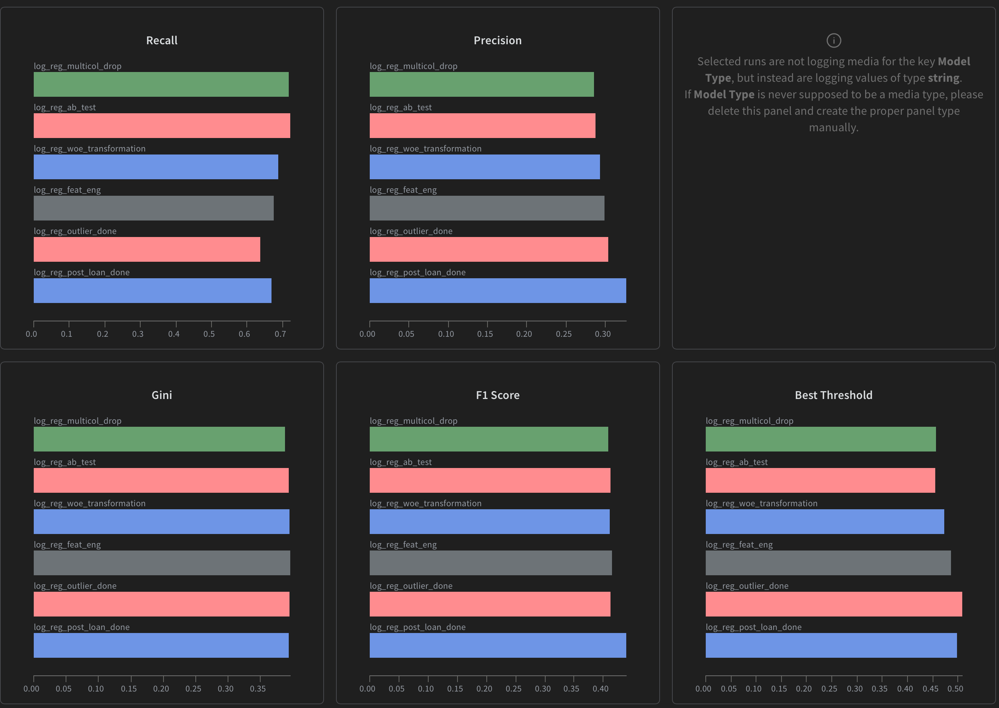

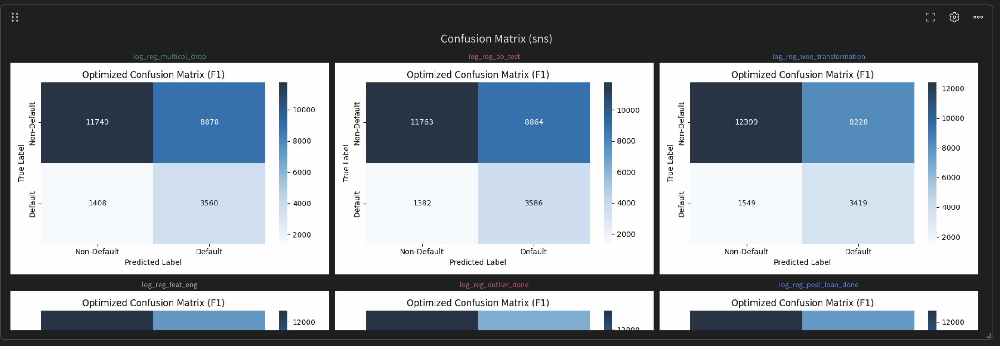

In [54]:
sorted(train_pdf2_1.columns)

['acc_open_past_24mths_woe',
 'annual_inc_woe',
 'avg_cur_bal_woe',
 'bc_open_to_buy_woe',
 'bc_util_woe',
 'default_status',
 'dti_woe',
 'fico_score_woe',
 'home_ownership_woe',
 'id',
 'inq_last_6mths_woe',
 'int_rate_woe',
 'issue_d',
 'loan_amnt/annual_inc_woe',
 'mo_sin_rcnt_rev_tl_op_woe',
 'mo_sin_rcnt_tl_woe',
 'mort_acc_woe',
 'mths_since_recent_bc_woe',
 'mths_since_recent_inq_woe',
 'num_actv_rev_tl_woe',
 'num_tl_op_past_12m_woe',
 'percent_bc_gt_75_woe',
 'revol_util_woe',
 'term_woe',
 'total_bc_limit_woe',
 'total_rev_hi_lim_woe',
 'verification_status_woe']